# Import necessary libraries

In [2]:
import numpy as np
import json
import pandas as pd
import warnings
import seaborn as sns
from scipy import stats
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, make_scorer
from sklearn.preprocessing import LabelEncoder
from kennard_stone import train_test_split as ks_split
from sklearn.utils import shuffle
from sklearn.neural_network import MLPRegressor
from sklearn.decomposition import PCA
from sklearn.metrics import pairwise_distances
from scipy.spatial import distance
from sklearn.manifold import TSNE
from sklearn.neighbors import KernelDensity

# Import files with Organs Data

In [3]:
# Reading the CSV
df_curve_fit_all_organ = pd.read_csv('df_FINAL_finalist.csv', index_col=0).sort_index()
# Convert JSON strings back to lists
df_curve_fit_all_organ['Concentrations'] = df_curve_fit_all_organ['Concentrations'].apply(json.loads)
df_curve_fit_all_organ['Time_points'] = df_curve_fit_all_organ['Time_points'].apply(json.loads)
df_curve_fit_all_organ['Parameters'] = df_curve_fit_all_organ['Parameters'].apply(json.loads)
# Convert list back to Numpy arrays
df_curve_fit_all_organ['Concentrations'] = df_curve_fit_all_organ['Concentrations'].apply(np.array)
df_curve_fit_all_organ['Time_points'] = df_curve_fit_all_organ['Time_points'].apply(np.array)
df_curve_fit_all_organ['Parameters'] = df_curve_fit_all_organ['Parameters'].apply(np.array)

print(df_curve_fit_all_organ.shape)
df_curve_fit_all_organ.head(5)

(1439, 11)


,Study_id,Instance,Organs,Concentrations,Time_points,Parameters,R2_score,auc_calc,auc_simps,Cmax_calc,Time_Cmax_calc
0,1,1,Blood,"[83.5715121429407, 2.457985651262957, 2.001502...","[0.0, 0.16666666666666666, 1.0, 2.0, 4.0, 24.0...","[81.5329817362303, 31.679318243723753, -0.7734...",0.999998,451.447865,439.123949,83.571512,0.000000
1,1,1,Brain,"[0.0, 8.425676874874718, 2.9197890160456903, 2...","[0.0, 1.0, 24.0, 168.0]","[7.011668382413655, 0.09799548744597017, -9.26...",1.000000,447.585616,539.715664,8.427476,1.038121
2,1,1,Kidneys,"[0.0, 7.995076681233775, 2.884821482919395, 2....","[0.0, 1.0, 24.0, 168.0]","[-9.831295737175694, 2.719643487958578, 7.0288...",1.000000,505.138668,572.543858,8.054453,1.192484
3,1,1,Liver,"[0.0, 3.4513788334293967, 9.20367688914503, 0....","[0.0, 1.0, 24.0, 168.0]","[-15.192545150910798, 0.2847971466760059, 15.0...",1.000000,667.524904,2047.984457,11.451905,9.909364
4,1,1,Lungs,"[0.0, 7.259475430305388, 4.619666182921618, 56...","[0.0, 1.0, 24.0, 168.0]","[1.9964470115182613, -0.019760492420510832, 1....",0.987680,2952.664981,3761.435400,56.755581,167.999993


In [4]:
# Make a copy of the DataFrame
df_curve_fit_organ_loaded = df_curve_fit_all_organ.copy()

### Load and process Physchemical properties dataframe

In [5]:
# Create DataFrame Physicochemical properties
df_Physchem_properties = pd.read_excel("NMs_Database.xlsx", "Physchem_properties", index_col=None, na_values=["NA"])
print(df_Physchem_properties.shape)
df_Physchem_properties.head()

(337, 27)


,Study_id,Instance,Material,Material_type,Material_molar_mass,Material_name,Nominal_size_nm,Disk_diameter_nm,Length_nm,Width_nm,...,Coating_molecule,Coating_nature,Coating_MW(Da),Rp/area_nm^-2,LIgand_length_nm,Nominal_density_g_cm3,PDI,Z-potential,pH_Zeta,Specific_surface_area_m2/g
0,1,1,TiO2,inorganic,79.866,NaN,NaN,NaN,7.5,NaN,...,PMA,hydrophobic,NaN,NaN,NaN,4.23,NaN,NaN,NaN,NaN
1,1,2,TiO2,inorganic,79.866,NaN,NaN,NaN,27.8,6.3,...,PMA,hydrophobic,NaN,NaN,NaN,4.23,NaN,NaN,NaN,NaN
2,1,3,TiO2,inorganic,79.866,NaN,NaN,NaN,13.6,4.5,...,PMA,hydrophobic,NaN,600,NaN,4.23,NaN,NaN,NaN,NaN
3,2,1,TiO2,inorganic,79.866,I_125,20,NaN,NaN,NaN,...,APTS,hydrophobic,NaN,NaN,NaN,4.23,NaN,-13.2,3.5,NaN
4,3,1,Au,inorganic,197.000,AuNPd,21,NaN,NaN,NaN,...,dextran,hydrophilic,NaN,NaN,NaN,19.32,NaN,NaN,NaN,NaN


#### Coating

In [6]:
# Check Coating column
print(df_Physchem_properties['Coating'].unique())
print(df_Physchem_properties['Coating'].value_counts())

['Yes' 'No' ' Yes' 'Νο']
Yes     265
No       59
Νο        9
 Yes      4
Name: Coating, dtype: int64


In [7]:
# Iterate through dataframe Physchemical properties to correct Coating values
for index, row in df_Physchem_properties.iterrows():
    if row['Coating'] == 'No':
        df_Physchem_properties.at[index, 'Coating'] = 'No'
    elif row['Coating'] == 'Νο':
        df_Physchem_properties.at[index, 'Coating'] = 'No'
    elif row['Coating'] == ' Yes':
        df_Physchem_properties.at[index, 'Coating'] = 'Yes'

# Check the Dataframe
print(df_Physchem_properties['Coating'].unique())
print(df_Physchem_properties['Coating'].value_counts())

['Yes' 'No']
Yes    269
No      68
Name: Coating, dtype: int64


#### Coating nature

In [8]:
# Check Coating nature column
print(df_Physchem_properties['Coating_nature'].unique())
print(df_Physchem_properties['Coating_nature'].value_counts())

['hydrophobic' 'hydrophilic' nan 'hydrophollic'
 'hydrophobic AND hydrophilic' 'ΝΑ']
hydrophobic                    98
ΝΑ                             27
hydrophilic                    20
hydrophobic AND hydrophilic     3
hydrophollic                    1
Name: Coating_nature, dtype: int64


In [9]:
df_Physchem_properties['Coating_nature'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 337 entries, 0 to 336
Series name: Coating_nature
Non-Null Count  Dtype 
--------------  ----- 
149 non-null    object
dtypes: object(1)
memory usage: 2.8+ KB


In [10]:
# Iterate through dataframe Physchemical properties to change Coating_nature
for index, row in df_Physchem_properties.iterrows():
    if row['Coating'] == 'Yes':
        df_Physchem_properties.at[index, 'Coating_nature'] = 'hydrophilic'
    elif row['Coating'] == 'No':
        df_Physchem_properties.at[index, 'Coating_nature'] = 'not_applicable'

# Check the Dataframe
print(df_Physchem_properties['Coating_nature'].unique())
print(df_Physchem_properties['Coating_nature'].value_counts())

['hydrophilic' 'not_applicable']
hydrophilic       269
not_applicable     68
Name: Coating_nature, dtype: int64


#### Shape

In [11]:
# Check Shape column
print(df_Physchem_properties['Shape'].unique())
print(df_Physchem_properties['Shape'].value_counts())

['tetragonal_bipyramid' 'rod' 'plate' nan 'sphere' 'nanocluster' 'tripod'
 'disk' 'cage' 'dendrimer' 'dumbbell' 'nanotags' 'cluster' 'sheet'
 'ribbon' 'cubic' 'dentritic' 'dots' 'capsule']
sphere                  68
sheet                   31
rod                     25
dentritic                8
tripod                   6
capsule                  5
cage                     5
dendrimer                5
cluster                  3
dots                     3
dumbbell                 2
nanotags                 2
disk                     2
ribbon                   1
cubic                    1
nanocluster              1
plate                    1
tetragonal_bipyramid     1
Name: Shape, dtype: int64


In [12]:
# Iterate through dataframe Physchemical properties to make Shape category 'Unknown'

for index, row in df_Physchem_properties.iterrows():
    if pd.isnull(row['Shape']):
        df_Physchem_properties.at[index, 'Shape'] = 'Unknown'
        
# Check the Dataframe
print(df_Physchem_properties['Shape'].unique())
print(df_Physchem_properties['Shape'].value_counts())

['tetragonal_bipyramid' 'rod' 'plate' 'Unknown' 'sphere' 'nanocluster'
 'tripod' 'disk' 'cage' 'dendrimer' 'dumbbell' 'nanotags' 'cluster'
 'sheet' 'ribbon' 'cubic' 'dentritic' 'dots' 'capsule']
Unknown                 167
sphere                   68
sheet                    31
rod                      25
dentritic                 8
tripod                    6
dendrimer                 5
cage                      5
capsule                   5
cluster                   3
dots                      3
disk                      2
dumbbell                  2
nanotags                  2
nanocluster               1
ribbon                    1
cubic                     1
plate                     1
tetragonal_bipyramid      1
Name: Shape, dtype: int64


#### Zeta potential

count    220.000000
mean     -12.116045
std       19.981568
min      -78.100000
25%      -21.500000
50%       -6.760000
75%       -1.660000
max       57.500000
Name: Z-potential, dtype: float64


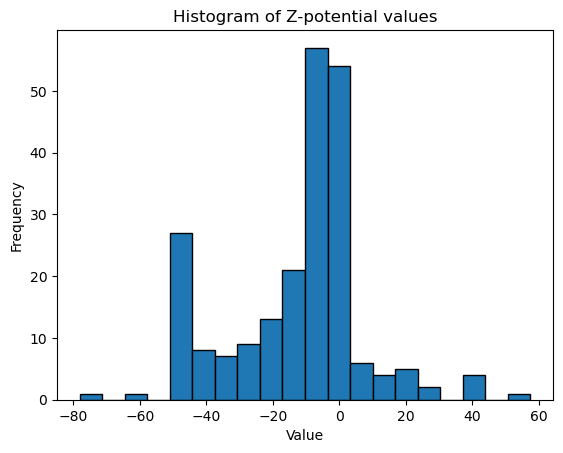

In [13]:
# Convert to numeric, coercing errors (non-numeric values become NaN)
df_Physchem_properties['Z-potential'] = pd.to_numeric(df_Physchem_properties['Z-potential'], errors='coerce')

# Drop NaN values
cleaned_data_zeta =df_Physchem_properties['Z-potential'].dropna()

# Get descriptive statistics for the cleaned data
stats_filtered_zeta = cleaned_data_zeta.describe()
print(stats_filtered_zeta)
# Plot the histogram
plt.hist(cleaned_data_zeta, bins=20, edgecolor='black')
plt.title('Histogram of Z-potential values')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.show()

### Load and process Experimental Details dataframe

In [14]:
# Create DataFrame Experimental_details
df_Experimental_details= pd.read_excel("Experiment_details.xlsx", index_col=None, na_values=["NA"])
print(df_Experimental_details.shape)
df_Experimental_details.head()

(337, 33)


,Study_id,Instance,Species,Strain,Sex,Cancer_presence,Cancer_cell_type,Cancer_location,Cancer_volume_mm3,Pathogen_presence,...,Inhaled_concentration,Inhaled_concentration_units,Admin_time_duration,Admin_time_units,Measured_concentration_units,Method_analysis,Method_measurement,Sampled_time_units,Data_presentation,Measured_chemical_species
0,1,1,Mice,CD1,Male,No,NaN,NaN,NaN,No,...,NaN,NaN,1,min,%ID/g,ICP-MS,Direct,hours,Plot,TiO2
1,1,2,Mice,CD1,Male,No,NaN,NaN,NaN,No,...,NaN,NaN,1,min,%ID/g,ICP-MS,Direct,hours,Plot,TiO2
2,1,3,Mice,CD1,Male,No,NaN,NaN,NaN,No,...,NaN,NaN,1,min,%ID/g,ICP-MS,Direct,hours,Plot,TiO2
3,2,1,Mice,ICR,NaN,No,NaN,NaN,NaN,No,...,NaN,NaN,1,min,%ID/g,gamma_spectrometry,Indirect,hours,Table,TiO2
4,3,1,Mice,Athymic Nude-Foxn1,Female,No,NaN,NaN,NaN,No,...,NaN,NaN,1,min,%ID/g,ICP-MS,Direct,hours,Table,Au


#### Sex column

In [15]:
# Check the column Sex
print(df_Experimental_details['Sex'].unique())
print(df_Experimental_details['Sex'].value_counts())

['Male' nan 'Female' 'Male AND Female']
Female             189
Male                76
Male AND Female      1
Name: Sex, dtype: int64


In [16]:
# Iterate through dataframe Physchemical properties to change Sex
for index, row in df_Experimental_details.iterrows():
    if row['Sex'] not in ['Male', 'Female']:
        df_Experimental_details.at[index, 'Sex'] = 'Unknown'

# Check the column Sex
print(df_Experimental_details['Sex'].unique())
print(df_Experimental_details['Sex'].value_counts())

['Male' 'Unknown' 'Female']
Female     189
Male        76
Unknown     72
Name: Sex, dtype: int64


#### Method analysis column

In [17]:
# Check the Dataframe
print(df_Experimental_details['Method_analysis'].value_counts())

gamma_spectrometry         149
PET                         57
ICP-MS                      53
LCS                         36
scintillation_counting      19
ICP-AES                      6
INAA                         5
ICP-OES                      3
ESR_spectroscopy             3
NAA                          2
PET/MRI                      1
fluorescence microscopy      1
AAS                          1
CT                           1
Name: Method_analysis, dtype: int64


### Load csv file to get main index

In [18]:
# Reading the CSV
grouped_df_Merged_data = pd.read_csv('grouped_df_Merged_data_colab.csv', index_col=0).sort_index()
# Convert JSON strings back to lists
grouped_df_Merged_data['Concentrations'] = grouped_df_Merged_data['Concentrations'].apply(json.loads)
grouped_df_Merged_data['Time_points'] = grouped_df_Merged_data['Time_points'].apply(json.loads)
# Convert list back to Numpy arrays
grouped_df_Merged_data['Concentrations'] = grouped_df_Merged_data['Concentrations'].apply(np.array)
grouped_df_Merged_data['Time_points'] = grouped_df_Merged_data['Time_points'].apply(np.array)

print(grouped_df_Merged_data.shape)
grouped_df_Merged_data.head()

(2497, 6)


,Main_index,Study_id,Instance,Organs,Concentrations,Time_points
0,0,1,1,Blood,"[83.5715121429407, 2.457985651262957, 2.001502...","[0.0, 0.16666666666666666, 1.0, 2.0, 4.0, 24.0..."
1,0,1,1,Brain,"[0.0, 8.425676874874718, 2.9197890160456903, 2...","[0.0, 1.0, 24.0, 168.0]"
2,0,1,1,Kidneys,"[0.0, 7.995076681233775, 2.884821482919395, 2....","[0.0, 1.0, 24.0, 168.0]"
3,0,1,1,Liver,"[0.0, 3.4513788334293967, 9.20367688914503, 0....","[0.0, 1.0, 24.0, 168.0]"
4,0,1,1,Lungs,"[0.0, 7.259475430305388, 4.619666182921618, 56...","[0.0, 1.0, 24.0, 168.0]"


# Process the DataFrames

In [19]:
# Create an empty column to df_curve_fit_organ_loaded which will take 'Main_index' values
df_curve_fit_organ_loaded['Cmax_exp'] = None
df_curve_fit_organ_loaded['Time_Cmax_exp'] = None
df_curve_fit_organ_loaded['Main_index'] = None
df_curve_fit_organ_loaded['Experiment_duration'] = None


# Fill the column with values from grouped_df_Merged_data
for index, row in df_curve_fit_organ_loaded.iterrows():
    if index in grouped_df_Merged_data.index:
        df_curve_fit_organ_loaded.at[index, 'Main_index'] = grouped_df_Merged_data.at[index, 'Main_index']
        df_curve_fit_organ_loaded.at[index, 'Experiment_duration'] = df_curve_fit_organ_loaded.at[index, 'Time_points'][-1]
        df_curve_fit_organ_loaded.at[index, 'Cmax_exp'] = df_curve_fit_organ_loaded.at[index, 'Concentrations'].max()
        
        max_arr_idx = np.argmax(df_curve_fit_organ_loaded.at[index, 'Concentrations'])
        df_curve_fit_organ_loaded.at[index, 'Time_Cmax_exp'] = df_curve_fit_organ_loaded.at[index, 'Time_points'][max_arr_idx]
        
df_curve_fit_organ_loaded.shape

(1439, 15)

In [20]:
# Define organs to study
organs_to_study_lst = ['Blood', 'Lungs', 'Liver', 'Spleen', 'Kidneys', 'Brain', 'Heart', 'Muscles']

# Define r2 score limit for calculated response metric (AUC)
r2_lmt = 0.98

In [21]:
# Create dataframe with the selected organs and with
df_organs_data = df_curve_fit_organ_loaded[df_curve_fit_organ_loaded['Organs'].isin(organs_to_study_lst) & (df_curve_fit_organ_loaded['R2_score']>=r2_lmt)]

print(df_organs_data.shape)

(830, 15)


# Create X and Y data for Regression (all organs)




## Create X data (y data included)

In [22]:
columns = ['Material', 'Material_type', 'Organs','Nominal_size_nm', 'Hydrodynamic_size_nm', 'Disk_diameter_nm', 'Length_nm', 'Width_nm', 'Weight_g',
           'Shape', 'Coating', 'Coating_nature', 'PDI', 'Z-potential', 'pH_Zeta', 'Sex', 'Cancer_presence', 'Dose', 'Dose_units', 'Method_analysis', 'AUC',
          'Experiment_duration', 'Cmax_exp', 'Time_Cmax_exp', 'Cmax', 'Time_Cmax_calc', 'auc_simps']

# 'Cmax', 'Time_to_Cmax', 'Time_half_life',

X = pd.DataFrame(columns=columns)

# Fill the features DataFrame with values
for index, row in df_organs_data.iterrows():

    main_index = row['Main_index']
    # Data from Physchemimal properties
    X.at[index, 'Material'] = df_Physchem_properties.at[main_index, 'Material']
    X.at[index, 'Material_type'] = df_Physchem_properties.at[main_index, 'Material_type']
    X.at[index, 'Nominal_size_nm'] = df_Physchem_properties.at[main_index, 'Nominal_size_nm']
    X.at[index, 'Hydrodynamic_size_nm'] = df_Physchem_properties.at[main_index, 'Hydrodynamic_size_nm']
    X.at[index, 'Disk_diameter_nm'] = df_Physchem_properties.at[main_index, 'Disk_diameter_nm']
    X.at[index, 'Length_nm'] = df_Physchem_properties.at[main_index, 'Length_nm']
    X.at[index, 'Width_nm'] = df_Physchem_properties.at[main_index, 'Width_nm']
    X.at[index, 'Shape'] = df_Physchem_properties.at[main_index, 'Shape']
    X.at[index, 'Coating'] = df_Physchem_properties.at[main_index, 'Coating']
    X.at[index, 'Coating_nature'] = df_Physchem_properties.at[main_index, 'Coating_nature']
    X.at[index, 'PDI'] = df_Physchem_properties.at[main_index, 'PDI']
    X.at[index, 'Z-potential'] = df_Physchem_properties.at[main_index, 'Z-potential']
    X.at[index, 'pH_Zeta'] = df_Physchem_properties.at[main_index, 'pH_Zeta']
    # Data from Experimental details
    X.at[index, 'Sex'] = df_Experimental_details.at[main_index, 'Sex']
    X.at[index, 'Cancer_presence'] = df_Experimental_details.at[main_index, 'Cancer_presence']
    X.at[index, 'Dose'] = df_Experimental_details.at[main_index, 'Dose']
    X.at[index, 'Dose_units'] = df_Experimental_details.at[main_index, 'Dose_units']
    X.at[index, 'Method_analysis'] = df_Experimental_details.at[main_index, 'Method_analysis']
    X.at[index, 'Weight_g'] = df_Experimental_details.at[main_index, 'Weight_g']
    # Data from organs data dataframe
    X.at[index, 'Experiment_duration'] = row['Experiment_duration']
    X.at[index, 'Organs'] = row['Organs']
    X.at[index, 'AUC'] = row['auc_calc']
    X.at[index, 'auc_simps'] = row['auc_simps']
    X.at[index, 'Cmax_exp'] = row['Cmax_exp']
    X.at[index, 'Cmax'] = row['Cmax_calc']
    X.at[index, 'Time_Cmax_exp'] = row['Time_Cmax_exp']
    X.at[index, 'Time_Cmax_calc'] = row['Time_Cmax_calc']
    
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 830 entries, 0 to 2494
Data columns (total 27 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Material              830 non-null    object
 1   Material_type         830 non-null    object
 2   Organs                830 non-null    object
 3   Nominal_size_nm       362 non-null    object
 4   Hydrodynamic_size_nm  553 non-null    object
 5   Disk_diameter_nm      12 non-null     object
 6   Length_nm             160 non-null    object
 7   Width_nm              133 non-null    object
 8   Weight_g              830 non-null    object
 9   Shape                 830 non-null    object
 10  Coating               830 non-null    object
 11  Coating_nature        830 non-null    object
 12  PDI                   94 non-null     object
 13  Z-potential           477 non-null    object
 14  pH_Zeta               98 non-null     object
 15  Sex                   830 non-null    o

In [23]:
# Create a lists with numerical, categorical and target features which will be used for regression based on the non-null number (high is prefered)
all_numerical_features = ['Dose', 'Weight_g', 'Hydrodynamic_size_nm', 'Experiment_duration'] 
all_categorical_features = ['Material', 'Material_type', 'Organs', 'Shape', 'Coating', 'Z-potential', 'Sex', 'Cancer_presence', 'Dose_units', 'Method_analysis']
all_target_features = ['AUC', 'Cmax_exp', 'Cmax', 'auc_simps'] # numerical features

In [24]:
# Make Z-potential categorical feature

# Iterate through dataframe Physchemical properties to change Zeta-potential
for index, row in X.iterrows():
    z_potential = row['Z-potential']
    
    # Check if z_potential is numerical
    if isinstance(z_potential, (int, float)):
        if -10 <= z_potential <= 10:
            X.at[index, 'Z-potential'] = 'neutral'
            
        elif z_potential < -10:
            X.at[index, 'Z-potential'] = 'negative'
            
        elif z_potential > 10:
            X.at[index, 'Z-potential'] = 'positive'
        
        else:
            X.at[index, 'Z-potential'] = 'unknown'

    # Check if z_potential is a string and convert to lowercase for case insensitivity
    elif isinstance(z_potential, str):
        z_potential_lower = z_potential.lower()
        if z_potential_lower in ['neutral', '+']:
            X.at[index, 'Z-potential'] = 'neutral'
        elif z_potential_lower in ['positive']:
            X.at[index, 'Z-potential'] = 'positive'
        elif z_potential_lower in ['negative', '-']:
            X.at[index, 'Z-potential'] = 'negative'
        else:
            X.at[index, 'Z-potential'] = 'unknown'

    else:
        X.at[index, 'Z-potential'] = 'unknown'

# Check the column Z-potential
print(X['Z-potential'].unique())
print(X['Z-potential'].value_counts())

['unknown' 'negative' 'neutral' 'positive']
unknown     353
neutral     247
negative    150
positive     80
Name: Z-potential, dtype: int64


In [25]:
# Check for non-numeric values in numerical and target feature

# Create an empty list to store non-numeric values, their index and Column title
non_numeric_values = []

# Iterate through X DataFrame to find non-numeric values
for index, row in X.iterrows():
    for column in (all_numerical_features+all_target_features):
        if not isinstance(row[column], (int, float)):
            non_numeric_values.append((index, column, row[column]))

# Display non-numeric values and their indices
for index, column, value in non_numeric_values:
    print(f"Index: {index}, Column: {column}, Value: {value}")

Index: 1881, Column: Hydrodynamic_size_nm, Value: <100
Index: 1885, Column: Hydrodynamic_size_nm, Value: <100
Index: 1886, Column: Hydrodynamic_size_nm, Value: <100
Index: 1887, Column: Hydrodynamic_size_nm, Value: <100
Index: 1888, Column: Hydrodynamic_size_nm, Value: <100
Index: 1890, Column: Hydrodynamic_size_nm, Value: <100


In [26]:
# Drop non-numeric values
for i in range(0, len(non_numeric_values)):
    index = non_numeric_values[i][0]
    X = X.drop(index=index)
print(X.shape)

(824, 27)


In [27]:
# Ensure that numerical features are float64
for column_name in (all_numerical_features+all_target_features):
    X[column_name] = X[column_name].astype('float64')
    # Check the transform
    print(f'Column {column_name} is {X[column_name].dtype}')

Column Dose is float64
Column Weight_g is float64
Column Hydrodynamic_size_nm is float64
Column Experiment_duration is float64
Column AUC is float64
Column Cmax_exp is float64
Column Cmax is float64
Column auc_simps is float64


### Define target feature

In [28]:
# Define target feature for Regression
target1 = 'Cmax'
target2 = 'AUC'
target_auc = ['AUC']
target_cmax = ['Cmax']

## Analyze numerical data

In [29]:
# Define numerical data
numerical_data = all_numerical_features + target_auc + target_cmax

In [30]:
# Numerical and target feature must not have NaN, zero, or negative values

# List to store indices of rows with NaN, zero, or negative values
nan_zero_negative_lst = []

for feature in numerical_data:
    nan_mask = X[feature].isna()
    zero_negative_mask = (X[feature] <= 0)

    if nan_mask.any() or zero_negative_mask.any():
        print(f"{feature} has NaN, zero or negative values")

        # Get indices for NaN values
        nan_indices = X[nan_mask].index.tolist()
        print("NaN indices:", nan_indices)

        # Get indices for zero or negative values
        zero_negative_indices = X[zero_negative_mask].index.tolist()
        print("Zero or negative indices:", zero_negative_indices)

        # Combine indices and add to the list
        nan_zero_negative_lst.extend(nan_indices + zero_negative_indices)
        print()

# Remove duplicate indices
nan_zero_negative_lst = list(set(nan_zero_negative_lst))

print()
print("Number of Indices with NaN, zero or negative values:", len(nan_zero_negative_lst))


Dose has NaN, zero or negative values
NaN indices: [732, 734, 735, 736, 737, 738, 740]
Zero or negative indices: []

Hydrodynamic_size_nm has NaN, zero or negative values
NaN indices: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 156, 159, 163, 166, 169, 176, 177, 178, 179, 180, 181, 183, 185, 186, 189, 190, 191, 193, 195, 257, 259, 261, 262, 263, 264, 265, 268, 270, 272, 273, 274, 275, 276, 279, 281, 283, 284, 285, 287, 290, 292, 294, 296, 297, 298, 308, 311, 313, 314, 315, 316, 318, 320, 323, 325, 326, 327, 328, 330, 333, 336, 338, 340, 341, 343, 345, 348, 350, 351, 352, 353, 355, 386, 387, 390, 391, 392, 484, 487, 489, 490, 491, 493, 495, 498, 500, 501, 502, 504, 506, 508, 510, 511, 512, 513, 514, 581, 584, 589, 591, 605, 608, 610, 615, 683, 685, 686, 688, 689, 690, 692, 694, 697, 699, 700, 702, 704, 706, 725, 726, 727, 728, 729, 732, 734, 735, 736, 737, 738, 740, 753, 760, 773, 774, 775, 776, 777, 778, 780, 781, 783, 784, 786, 787, 788, 789, 792, 795, 797, 798, 800

In [31]:
# Drop the rows with these indices
X_dropped = X.drop(index=nan_zero_negative_lst)
print("Shape of the cleaned DataFrame:", X_dropped.shape)

Shape of the cleaned DataFrame: (544, 27)


## Analyze categorical features

### Plot barplots to check number of samples

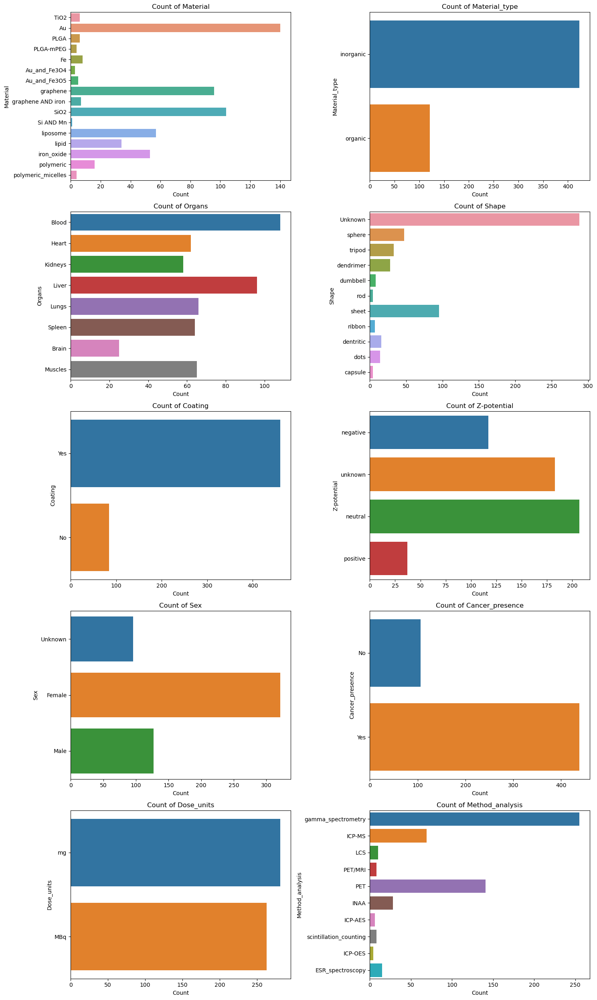

In [32]:
# Number of features
num_features = len(all_categorical_features)
# Determine number of rows and columns
num_cols = 2  # Number of columns in the grid
num_rows = (num_features + num_cols - 1) // num_cols  # Calculate the number of rows

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 5))
axes = axes.flatten()  # Flatten the 2D array of axes into 1D for easy iteration

# Loop through each feature and plot
for i, feature in enumerate(all_categorical_features):
    sns.countplot(y=X_dropped[feature], ax=axes[i])
    axes[i].set_xlabel('Count')
    axes[i].set_ylabel(feature)
    axes[i].set_title(f'Count of {feature}')

# Remove any unused subplots if the number of features is less than grid size
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()

# Save the figure as an image file
plt.savefig('categorical_features_plot.png', dpi=300)  # Save the plot with high resolution

plt.show()

### Remove data with small number of samples

#### Material

In [33]:
# Check material counts
material_value_counts = X_dropped['Material'].value_counts()
print(material_value_counts)

Au                    140
SiO2                  104
graphene               96
liposome               57
iron_oxide             53
lipid                  34
polymeric              16
Fe                      8
graphene AND iron       7
TiO2                    6
PLGA                    6
Au_and_Fe3O5            5
PLGA-mPEG               4
polymeric_micelles      4
Au_and_Fe3O4            3
Si AND Mn               1
Name: Material, dtype: int64


In [34]:
# Set a threshold where materials with lower count value are dropped
material_threshold = 10
# Store materials to be dropped to a list
material_drop_lst = [col for col in material_value_counts.index if material_value_counts[col] < material_threshold]
# Update X_IQR dataframe
X_dropped_mtrl = X_dropped[~X_dropped['Material'].isin(material_drop_lst)]
X_fnl = X_dropped_mtrl
print(X_fnl.shape)

(500, 27)


#### Shape

In [35]:
# Check shape counts
shape_value_counts = X_fnl['Shape'].value_counts()
print(shape_value_counts)

Unknown      270
sheet         88
sphere        37
tripod        33
dendrimer     28
dentritic     16
dots          13
ribbon         7
rod            4
capsule        4
Name: Shape, dtype: int64


In [36]:
# Set a threshold where shapes with lower count value are condidered as one category
shape_threshold = 34
# Store shapes to a list
shape_drop_lst = [col for col in shape_value_counts.index if shape_value_counts[col] < shape_threshold]

for index, row in X_fnl.iterrows():
    if row['Shape'] in shape_drop_lst:
        X_fnl.at[index, 'Shape'] = 'other'



X_fnl['Shape'].value_counts()

Unknown    270
other      105
sheet       88
sphere      37
Name: Shape, dtype: int64

#### Method analysis

In [37]:
# Check method analysis counts
method_value_counts = X_fnl['Method_analysis'].value_counts()
print(method_value_counts)

gamma_spectrometry        243
PET                       127
ICP-MS                     69
INAA                       28
ESR_spectroscopy           15
scintillation_counting      8
ICP-AES                     6
ICP-OES                     4
Name: Method_analysis, dtype: int64


In [38]:
# Set a threshold where method analysis with lower count value are condidered as one category
method_threshold = 30
# Store method analysis to a list
method_drop_lst = [col for col in method_value_counts.index if method_value_counts[col] < method_threshold]

for index, row in X_fnl.iterrows():
    if row['Method_analysis'] in method_drop_lst:
        X_fnl.at[index, 'Method_analysis'] = 'other'

X_fnl['Method_analysis'].value_counts()

gamma_spectrometry    243
PET                   127
ICP-MS                 69
other                  61
Name: Method_analysis, dtype: int64

In [39]:
X_fnl.shape

(500, 27)

## Find outliers with IQR method

In [40]:
# Identify outliers using IQR method
Q1 = X_fnl[numerical_data].quantile(0.25)
Q3 = X_fnl[numerical_data].quantile(0.75)
IQR = Q3 - Q1
thresh = 1.5

# Outliers are values below Q1 - 1.5*IQR or above Q3 + 1.5*IQR
outliers = (X_fnl[numerical_data] < (Q1 - thresh * IQR)) | (X_fnl[numerical_data] > (Q3 + thresh * IQR))

# DataFrame without outliers
X_IQR = X_fnl[~outliers.any(axis=1)]
#print("Data without outliers:\n", X_no_outliers)
X_IQR.shape

(351, 27)

### Plot to visualize numerical data

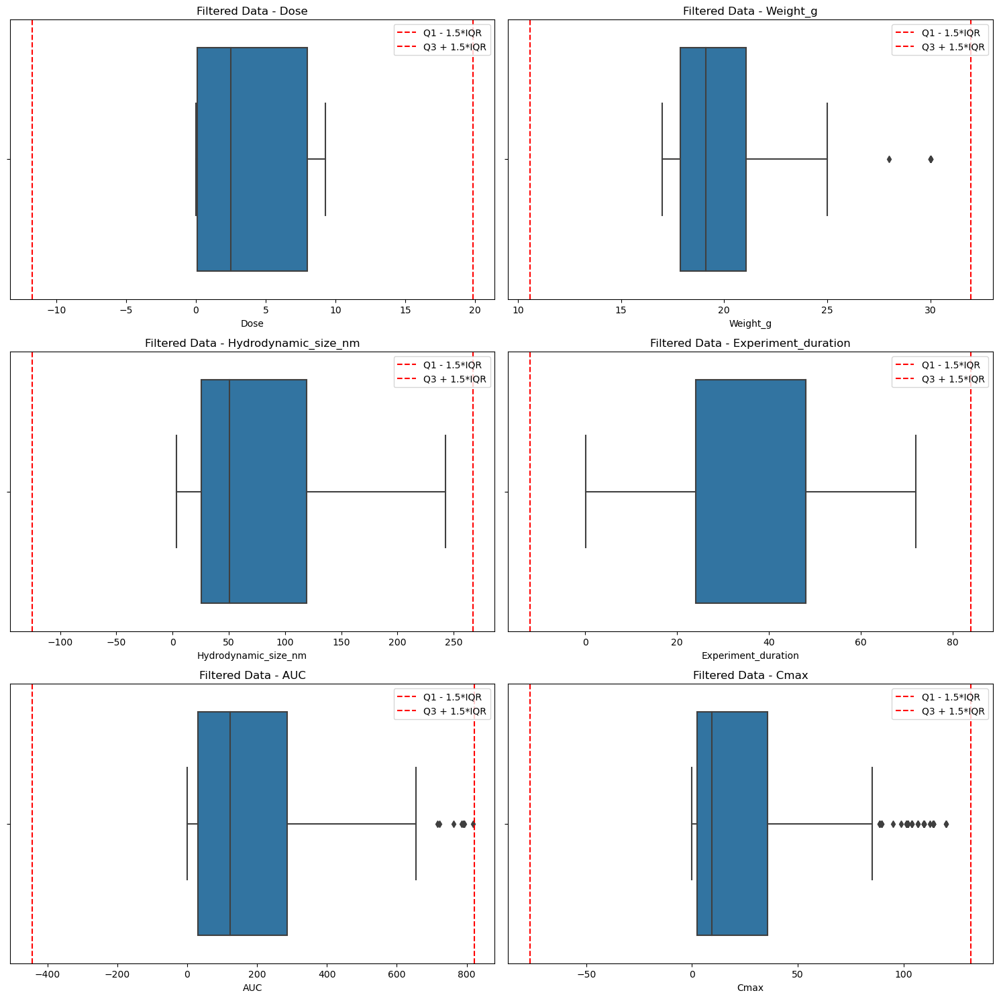

In [41]:
# Determine number of features and create subplots
num_features = len(numerical_data)
num_rows = (num_features + 1) // 2  # +1 to handle odd number of features

fig, axes = plt.subplots(num_rows, 2, figsize=(15, num_rows * 5))
axes = axes.flatten()

# # Loop through each feature and plot only the filtered data
# for i, feature in enumerate(numerical_data):
#     # Plot filtered data
#     sns.boxplot(x=X_IQR[feature], ax=axes[i])
#     axes[i].set_title(f'Filtered Data - {feature}')

#     # Add threshold lines
#     axes[i].axvline(Q1[feature] - thresh * IQR[feature], color='r', linestyle='--', label='Q1 - 1.5*IQR')
#     axes[i].axvline(Q3[feature] + thresh * IQR[feature], color='r', linestyle='--', label='Q3 + 1.5*IQR')
#     axes[i].legend()

# # Remove any unused subplots (if the number of features is odd)
# for j in range(num_features, len(axes)):
#     fig.delaxes(axes[j])

# plt.tight_layout()

# plt.savefig('numerical_features_plot.png', dpi=300)  # Save the plot with high resolution

# plt.show()
# Loop through each feature and plot only the filtered data
for i, feature in enumerate(numerical_data):
    # Plot filtered data
    sns.boxplot(x=X_IQR[feature], ax=axes[i])
    axes[i].set_title(f'Filtered Data - {feature}')

    # Add threshold lines
    axes[i].axvline(Q1[feature] - thresh * IQR[feature], color='r', linestyle='--', label='Q1 - 1.5*IQR')
    axes[i].axvline(Q3[feature] + thresh * IQR[feature], color='r', linestyle='--', label='Q3 + 1.5*IQR')
    axes[i].legend(loc='upper right')  # Specify legend location

# Remove any unused subplots (if the number of features is odd)
for j in range(num_features, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()

plt.savefig('numerical_features_plot.png', dpi=300)  # Save the plot with high resolution

plt.show()

### Plot to visualise categorical data

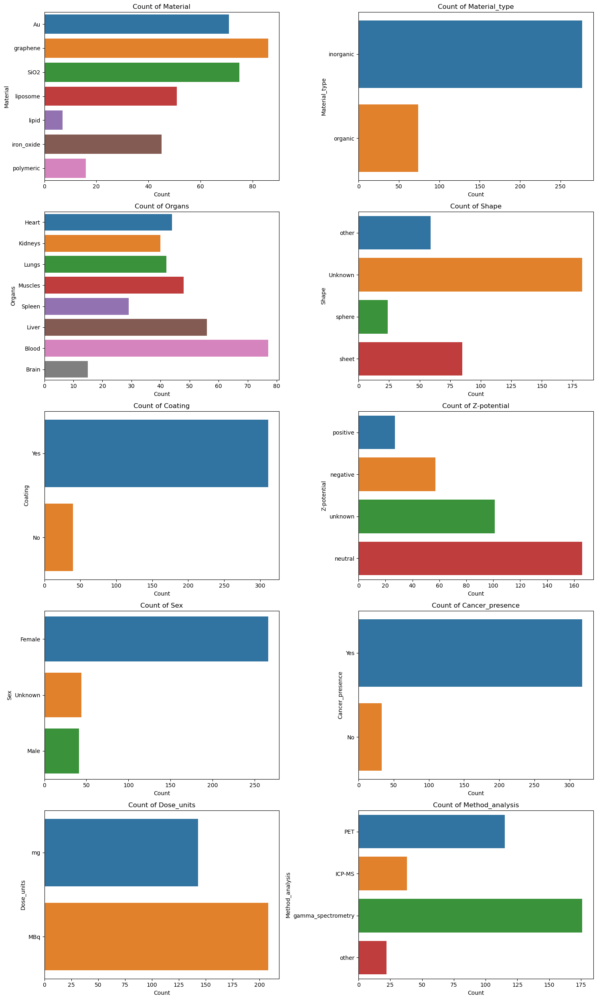

In [42]:
# Number of features
num_features = len(all_categorical_features)
# Determine number of rows and columns
num_cols = 2  # Number of columns in the grid
num_rows = (num_features + num_cols - 1) // num_cols  # Calculate the number of rows

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 5))
axes = axes.flatten()  # Flatten the 2D array of axes into 1D for easy iteration

# Loop through each feature and plot
for i, feature in enumerate(all_categorical_features):
    sns.countplot(y=X_IQR[feature], ax=axes[i])
    axes[i].set_xlabel('Count')
    axes[i].set_ylabel(feature)
    axes[i].set_title(f'Count of {feature}')

# Remove any unused subplots if the number of features is less than grid size
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [43]:
# # Check material counts
# material_value_counts = X_IQR['Material'].value_counts()
# print(material_value_counts)

In [44]:
# # Set a threshold where materials with lower count value are dropped
# material_threshold = 10
# # Store materials to be dropped to a list
# material_drop_lst = [col for col in material_value_counts.index if material_value_counts[col] < material_threshold]
# # Update X_IQR dataframe
# X_IQR = X_IQR[~X_IQR['Material'].isin(material_drop_lst)]
# print(X_IQR.shape)

## Pearson correlation for numerical features

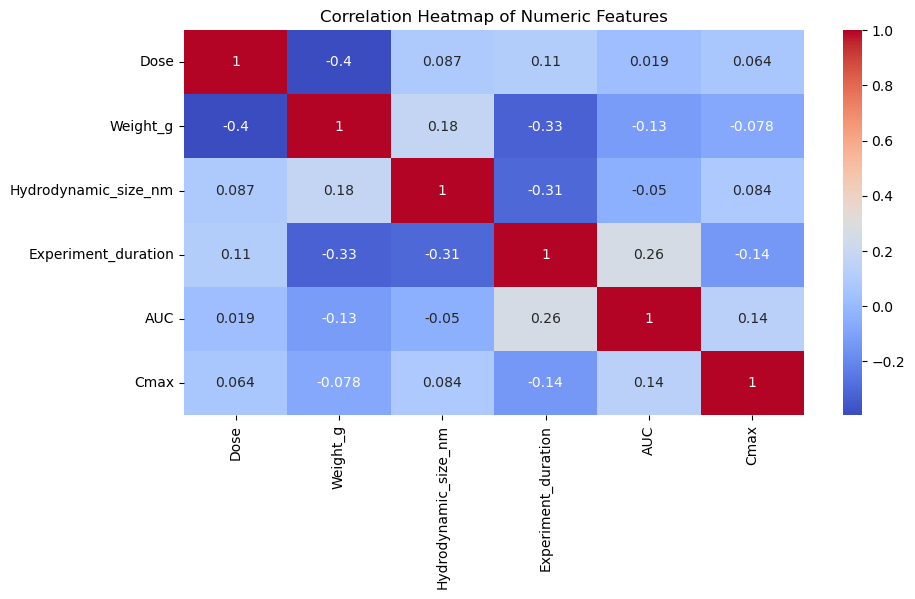

In [45]:
# Pearson’s correlation coefficient for numerical features
plt.figure(figsize=(10,5))
sns.heatmap(X_IQR[numerical_data].corr(),
            annot=True,
            cmap='coolwarm',  # Blue-Red diverging colormap
            )
plt.title("Correlation Heatmap of Numeric Features")
plt.show()

# Model Cmac prediction

### Select numerical features

In [46]:
numerical_features_cmax = ['Dose', 'Weight_g', 'Experiment_duration', 'Hydrodynamic_size_nm']

## ANOVA test

In [47]:
# from statsmodels.formula.api import ols
# from statsmodels.stats.anova import anova_lm


# # Έλεγχος Κανονικότητας (Normality)
# def check_normality(df, feature, target):
#     for category in df[feature].unique():
#         stat, p = stats.shapiro(df[df[feature] == category][target])
#         print(f'Shapiro-Wilk Test for {category} in {feature}: stat={stat}, p={p}')

# # Έλεγχος Ομοιογένειας της Διακύμανσης (Homogeneity of Variances)
# def check_homogeneity(df, feature, target):
#     groups = [df[df[feature] == category][target] for category in df[feature].unique()]
#     stat, p = stats.levene(*groups)
#     print(f'Levene\'s Test for {feature}: stat={stat}, p={p}')

# # Έλεγχος ANOVA
# def anova(df, feature, target):
#     groups = df.groupby(feature)[target].apply(list)
#     f_value, p_value = stats.f_oneway(*groups)
#     return pd.DataFrame({'PR(>F)': [p_value]}, index=[feature])


# # Εκτέλεση των ελέγχων για όλα τα κατηγορικά χαρακτηριστικά
# anova_for_categoricals = []
# for feature in all_categorical_features:
#     # Έλεγχος Κανονικότητας
#     check_normality(X_IQR, feature, target1)
    
#     # Έλεγχος Ομοιογένειας της Διακύμανσης
#     check_homogeneity(X_IQR, feature, target1)
    
#     # Εκτέλεση ANOVA
#     anova_result = anova(X_IQR, feature, target1)
#     anova_for_categoricals.append([feature, anova_result.loc[feature, 'PR(>F)']])

# # Δημιουργία DataFrame με τα αποτελέσματα της ANOVA
# anova_for_categoricals = pd.DataFrame(anova_for_categoricals, columns=['feature', 'anova pvalue'])
# anova_for_categoricals.columns = [str(column) for column in anova_for_categoricals.columns]

# # Εμφάνιση αποτελεσμάτων
# print(anova_for_categoricals)

In [48]:
# all_categorical_features.remove('Z-potential')
# all_categorical_features.append('Z_potential')

In [49]:
# # Μετονομασία της στήλης Z-potential
# X_IQR.rename(columns={'Z-potential': 'Z_potential'}, inplace=True)

# # Έλεγχος Κανονικότητας (Normality)
# def check_normality(df, feature, target):
#     for category in df[feature].unique():
#         stat, p = stats.shapiro(df[df[feature] == category][target])
#         print(f'Shapiro-Wilk Test for {category} in {feature}: stat={stat}, p={p}')

# # Έλεγχος Ομοιογένειας της Διακύμανσης (Homogeneity of Variances)
# def check_homogeneity(df, feature, target):
#     groups = [df[df[feature] == category][target] for category in df[feature].unique()]
#     stat, p = stats.levene(*groups)
#     print(f'Levene\'s Test for {feature}: stat={stat}, p={p}')

# # Έλεγχος Kruskal-Wallis
# def kruskal_wallis(df, feature, target):
#     groups = df.groupby(feature)[target].apply(list)
#     stat, p_value = stats.kruskal(*groups)
#     return pd.DataFrame({'PR(>H)': [p_value]}, index=[feature])

# # Έλεγχος Welch ANOVA
# def welch_anova(df, feature, target):
#     model = ols(f'{target} ~ C({feature})', data=df).fit()
#     welch_anova_table = anova_lm(model, typ=2, robust='hc3')
#     return welch_anova_table



# # Εκτέλεση των ελέγχων για όλα τα κατηγορικά χαρακτηριστικά
# kruskal_for_categoricals = []
# welch_for_categoricals = []

# for feature in all_categorical_features:
#     # Έλεγχος Κανονικότητας
#     check_normality(X_IQR, feature, target1)
    
#     # Έλεγχος Ομοιογένειας της Διακύμανσης
#     check_homogeneity(X_IQR, feature, target1)
    
#     # Εκτέλεση Kruskal-Wallis
#     kruskal_result = kruskal_wallis(X_IQR, feature, target1)
#     kruskal_for_categoricals.append([feature, kruskal_result.loc[feature, 'PR(>H)']])
    
#     # Εκτέλεση Welch ANOVA
#     welch_result = welch_anova(X_IQR, feature, target1)
#     welch_for_categoricals.append([feature, welch_result.loc[f'C({feature})', 'PR(>F)']])

# # Δημιουργία DataFrame με τα αποτελέσματα των Kruskal-Wallis και Welch ANOVA
# kruskal_for_categoricals = pd.DataFrame(kruskal_for_categoricals, columns=['feature', 'kruskal pvalue'])
# welch_for_categoricals = pd.DataFrame(welch_for_categoricals, columns=['feature', 'welch pvalue'])

# # Εμφάνιση αποτελεσμάτων
# print("Kruskal-Wallis Test Results")
# print(kruskal_for_categoricals)

# print("\nWelch ANOVA Test Results")
# print(welch_for_categoricals)


In [50]:
# from scipy.stats import kruskal

# # Kruskal-Wallis test
# def kruskal_wallis(df, feature, target):
#     groups = df.groupby(feature)[target].apply(list)
#     stat, p_value = kruskal(*groups)
#     return pd.DataFrame({'PR(>H)': [p_value]}, index=[feature])

# # Εκτέλεση Kruskal-Wallis για όλα τα κατηγορικά χαρακτηριστικά
# kruskal_for_categoricals = []
# for feature in all_categorical_features:
#     kruskal_result = kruskal_wallis(X_IQR, feature, target1)
#     kruskal_for_categoricals.append([feature, kruskal_result.loc[feature, 'PR(>H)']])

# # Δημιουργία DataFrame με τα αποτελέσματα του Kruskal-Wallis
# kruskal_for_categoricals = pd.DataFrame(kruskal_for_categoricals, columns=['feature', 'kruskal pvalue'])
# print(kruskal_for_categoricals)


In [51]:
# from scipy.stats import chi2_contingency

# # Χρήση του Chi-Square Test για κάθε κατηγορικό χαρακτηριστικό
# chi2_results = []
# for feature in all_categorical_features:
#     contingency_table = pd.crosstab(X_IQR[feature], X_IQR[target1])
#     stat, p, dof, expected = chi2_contingency(contingency_table)
#     chi2_results.append([feature, p])

# # Δημιουργία DataFrame με τα αποτελέσματα του Chi-Square Test
# chi2_results_df = pd.DataFrame(chi2_results, columns=['feature', 'chi2 pvalue'])
# print(chi2_results_df)

In [52]:
X_IQR.columns

Index(['Material', 'Material_type', 'Organs', 'Nominal_size_nm',
       'Hydrodynamic_size_nm', 'Disk_diameter_nm', 'Length_nm', 'Width_nm',
       'Weight_g', 'Shape', 'Coating', 'Coating_nature', 'PDI', 'Z-potential',
       'pH_Zeta', 'Sex', 'Cancer_presence', 'Dose', 'Dose_units',
       'Method_analysis', 'AUC', 'Experiment_duration', 'Cmax_exp',
       'Time_Cmax_exp', 'Cmax', 'Time_Cmax_calc', 'auc_simps'],
      dtype='object')

In [53]:
# Define ANOVA test (for a categorical feature against a numerical target)
def anova(df, feature):
    groups = df.groupby(feature)[target1].apply(list) # AUC is the target value
    f_value, p_value = stats.f_oneway(*groups)
    return pd.DataFrame({'PR(>F)': [p_value]}, index=[feature])

In [54]:
# Test for statistical importance of categoricals
anova_for_categoricals = []
for i in all_categorical_features:
    anova_for_categoricals.append([i,anova(X_IQR, i).loc[i,'PR(>F)']])

anova_for_categoricals = pd.DataFrame(anova_for_categoricals, columns=['feature','anova pvalue'])
anova_for_categoricals.columns = [str(column) for column in anova_for_categoricals.columns]

# show results
anova_for_categoricals

,feature,anova pvalue
0,Material,6.534819e-07
1,Material_type,3.655701e-01
2,Organs,4.876723e-217
3,Shape,1.803037e-01
4,Coating,2.649820e-01
5,Z-potential,6.917702e-01
6,Sex,3.691279e-01
7,Cancer_presence,3.121872e-01
8,Dose_units,3.502549e-01
9,Method_analysis,3.216286e-02


In [55]:
cateforical_drop_lst_cmax = []#['Material_type', 'Shape', 'Coating', 'Sex', 'Z-potential', 'Cancer_presence']

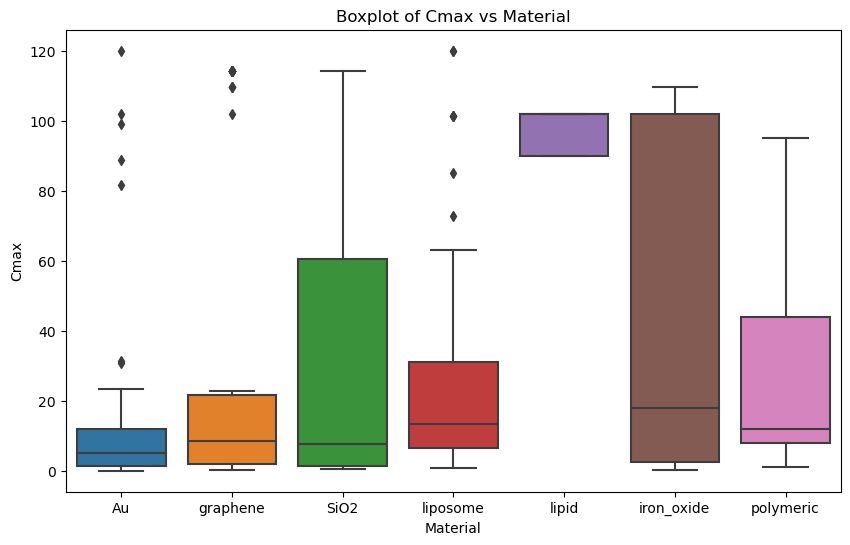

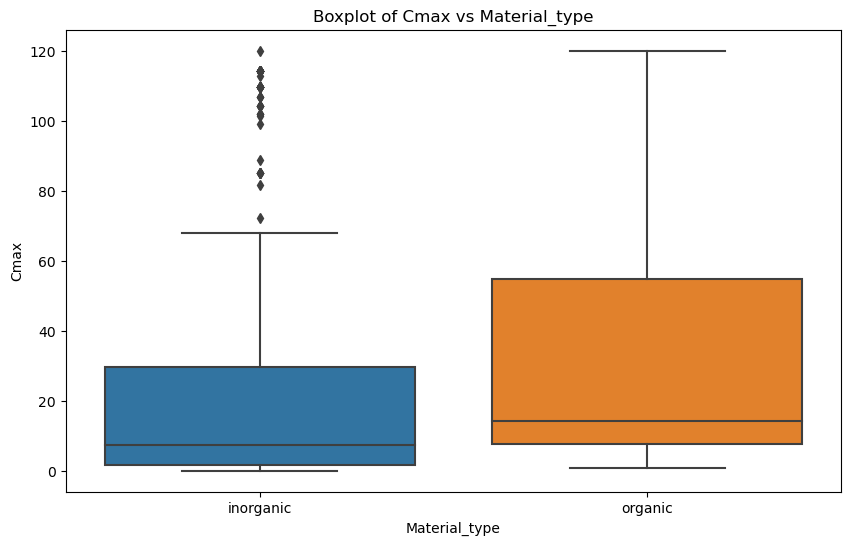

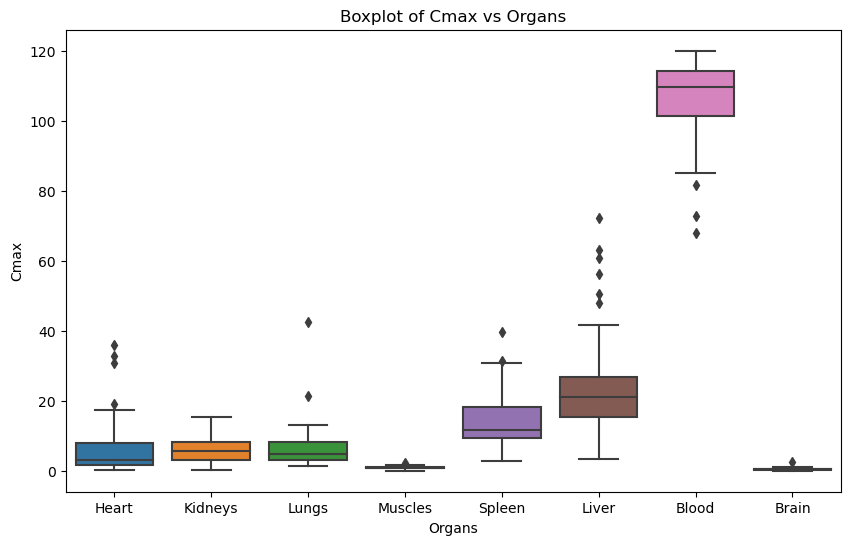

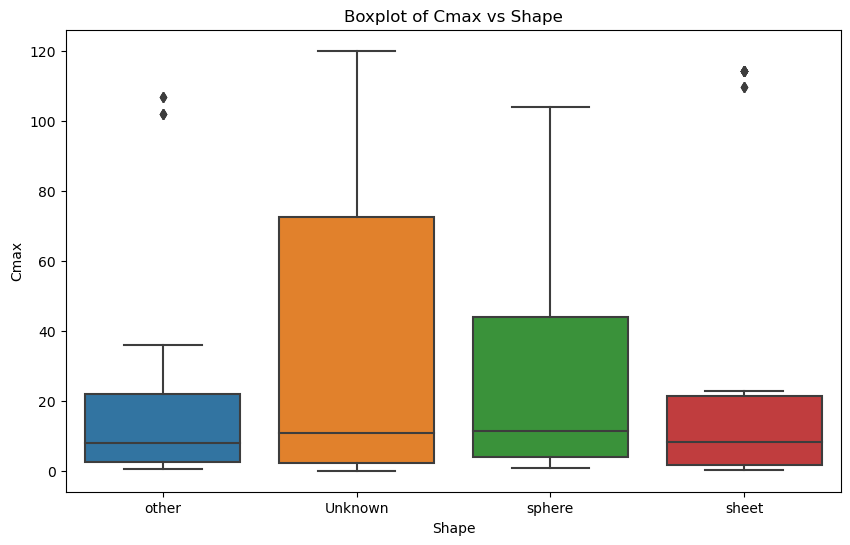

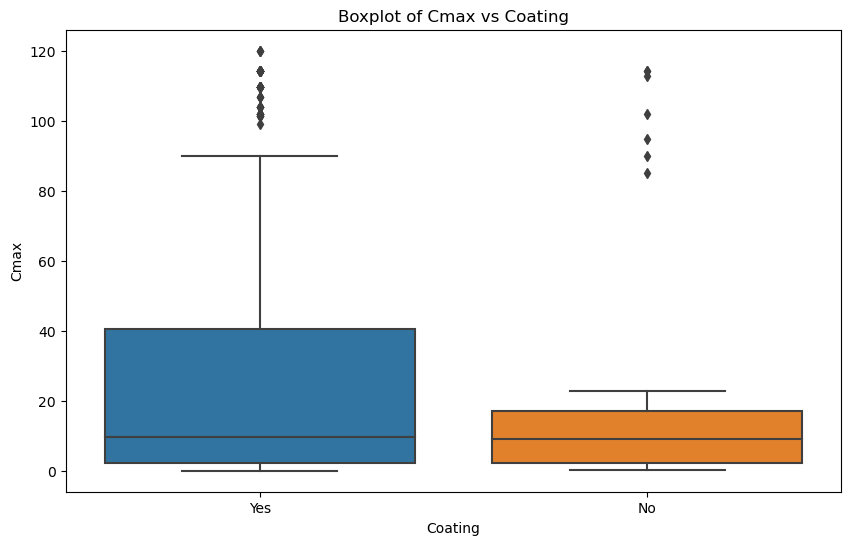

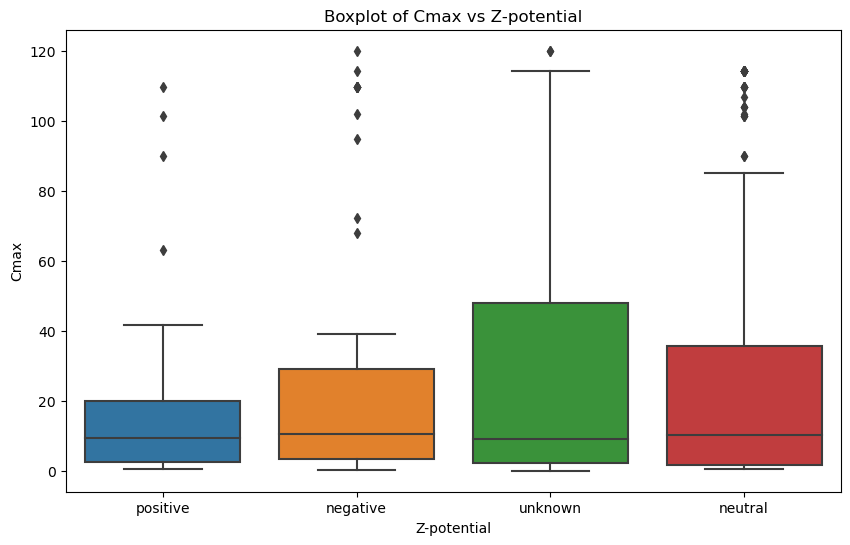

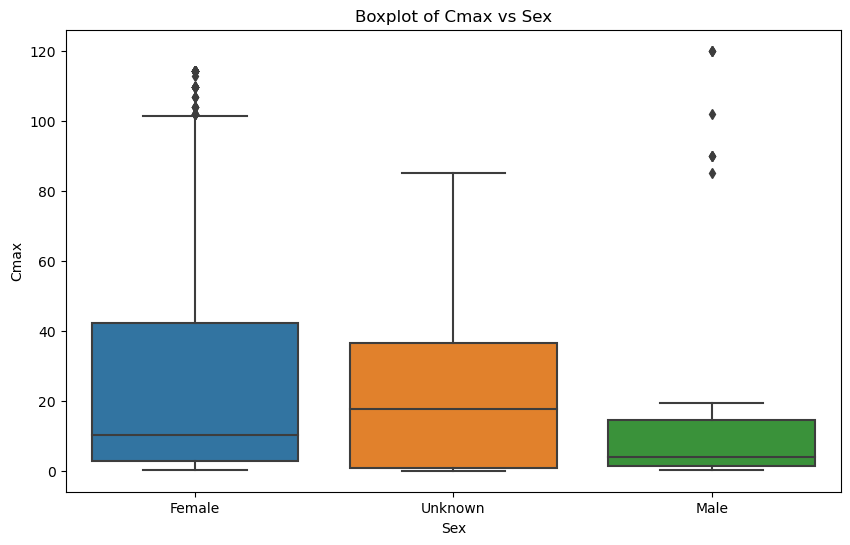

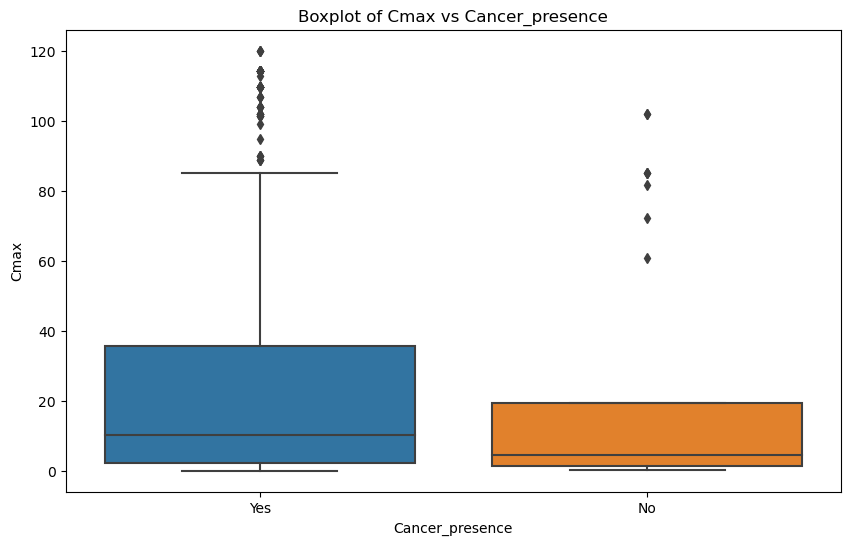

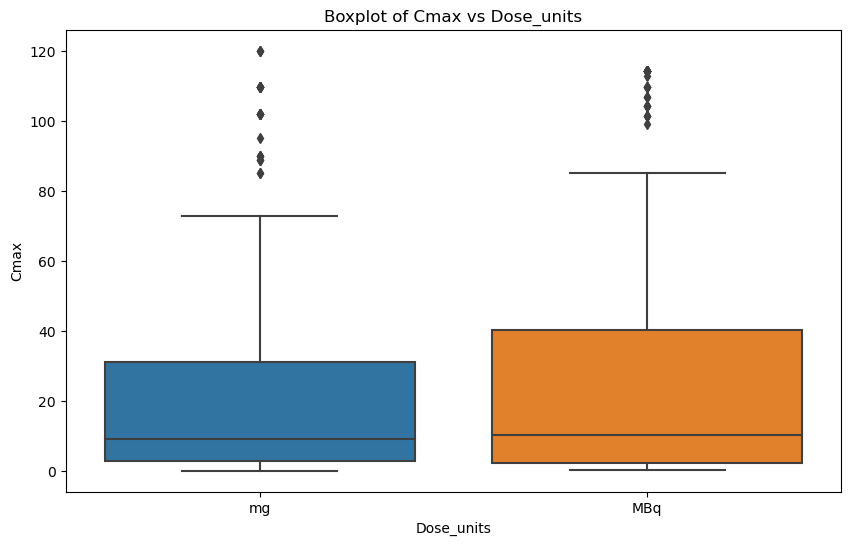

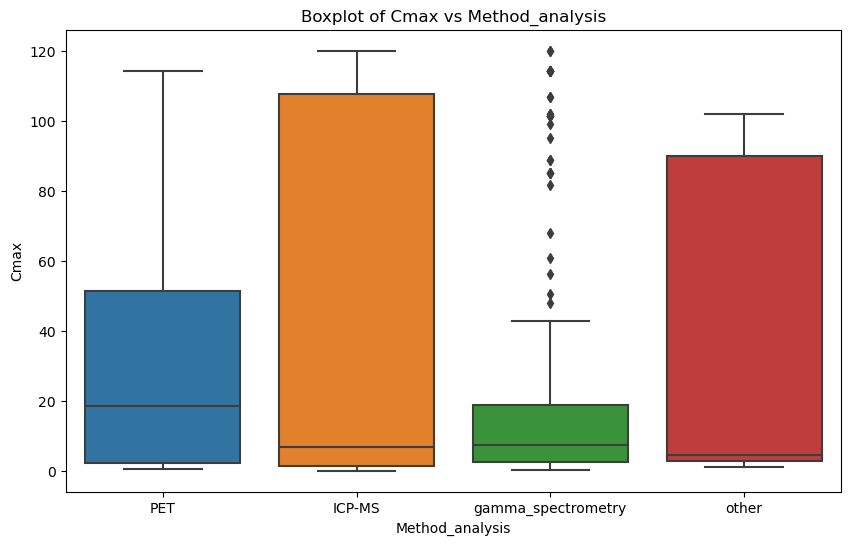

In [56]:
for feature in all_categorical_features:
  # Create the boxplot
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=feature, y=target1, data=X_IQR)
    plt.title(f'Boxplot of {target1} vs {feature}')
    plt.xlabel(f'{feature}')
    plt.ylabel(target1)
    plt.show()

### Select categorical features

In [57]:
encode_features = ['Material_type', 'Coating', 'Cancer_presence', 'Dose_units']

In [58]:
onehot_features = ['Material', 'Shape', 'Z-potential', 'Sex', 'Organs', 'Method_analysis']

In [59]:
categorical_features_cmax = [col for col in all_categorical_features if col not in cateforical_drop_lst_cmax]

## Define X data (features) and Y data (target)

In [60]:
X_outlier = X_IQR
X_data = X_outlier[numerical_features_cmax + categorical_features_cmax]
y_data_cmax = X_outlier[target1]

In [61]:
# Initialize Dose_MBq and Dose_mg with zeros
X_data = X_data.copy()

X_data.loc[:, 'Dose_MBq'] = 0
X_data.loc[:, 'Dose_mg'] = 0

# Assign values based on Dose_units
X_data.loc[X_data['Dose_units'] == 'MBq', 'Dose_MBq'] = X_data['Dose']
X_data.loc[X_data['Dose_units'] == 'mg', 'Dose_mg'] = X_data['Dose']

# Drop unnecessary columns
X_data = X_data.drop(columns=['Dose_units', 'Dose'])

In [62]:
# Handle Dose for numerical and categorical features
numerical_features_cmax.remove('Dose')
numerical_features_cmax.append('Dose_MBq')
numerical_features_cmax.append('Dose_mg')
categorical_features_cmax.remove('Dose_units')

### Onehot encoding

In [63]:
# Define categorical features which need onehot encoding
features_to_onehot_lst_cmax = [col for col in categorical_features_cmax if col in onehot_features]

# One-hot encode categorical features
X_categorical_onehot_cmax = pd.get_dummies(X_data[features_to_onehot_lst_cmax]).astype('int64')
one_hot_columns_lst_cmax = X_categorical_onehot_cmax.columns.values.tolist() # Create a list with new onehot columns
X_categorical_onehot_cmax.columns

Index(['Material_Au', 'Material_SiO2', 'Material_graphene',
       'Material_iron_oxide', 'Material_lipid', 'Material_liposome',
       'Material_polymeric', 'Organs_Blood', 'Organs_Brain', 'Organs_Heart',
       'Organs_Kidneys', 'Organs_Liver', 'Organs_Lungs', 'Organs_Muscles',
       'Organs_Spleen', 'Shape_Unknown', 'Shape_other', 'Shape_sheet',
       'Shape_sphere', 'Z-potential_negative', 'Z-potential_neutral',
       'Z-potential_positive', 'Z-potential_unknown', 'Sex_Female', 'Sex_Male',
       'Sex_Unknown', 'Method_analysis_ICP-MS', 'Method_analysis_PET',
       'Method_analysis_gamma_spectrometry', 'Method_analysis_other'],
      dtype='object')

### Label encoding

In [64]:
# Define categorical features which need onehot encoding
features_to_encode_lst_cmax = [col for col in categorical_features_cmax if col in encode_features]

# Initialize LabelEncoder
label_encoder_cmax = LabelEncoder()

# Apply label encoding to each column in features_to_encode_lst
for feature in features_to_encode_lst_cmax:
    X_data[feature] = label_encoder_cmax.fit_transform(X_data[feature])

X_data[features_to_encode_lst_cmax].head()

,Material_type,Coating,Cancer_presence
209,0,1,1
211,0,1,1
213,0,1,1
214,0,1,1
215,0,1,1


### Create final X data

In [65]:
# Seperate numerical data from X_data
X_numerical_cmax = X_data.drop(features_to_encode_lst_cmax+features_to_onehot_lst_cmax, axis=1)

# Join numerical, onehot and label encoded data
X_data_cmax = pd.concat([X_numerical_cmax, X_data[features_to_encode_lst_cmax], X_categorical_onehot_cmax], axis=1)

# Check the final dataframe
X_data_cmax.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 351 entries, 209 to 2464
Data columns (total 38 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Weight_g                            351 non-null    float64
 1   Experiment_duration                 351 non-null    float64
 2   Hydrodynamic_size_nm                351 non-null    float64
 3   Dose_MBq                            351 non-null    float64
 4   Dose_mg                             351 non-null    float64
 5   Material_type                       351 non-null    int64  
 6   Coating                             351 non-null    int64  
 7   Cancer_presence                     351 non-null    int64  
 8   Material_Au                         351 non-null    int64  
 9   Material_SiO2                       351 non-null    int64  
 10  Material_graphene                   351 non-null    int64  
 11  Material_iron_oxide                 351 no

### Train, Test split

In [66]:
# Shuffle the data
X_data_cmax_shuf, y_data_cmax_shuf = shuffle(X_data_cmax, y_data_cmax, random_state=42)

In [67]:
X_data_cmax.shape

(351, 38)

#### Kennard-stone

In [68]:
# Split with Kennard stone
X_train_cmax, X_test_cmax, y_train_cmax, y_test_cmax = ks_split(X_data_cmax_shuf, y_data_cmax_shuf, test_size=0.2)

Calculating pairwise distances using scikit-learn.
Calculating pairwise distances using scikit-learn.


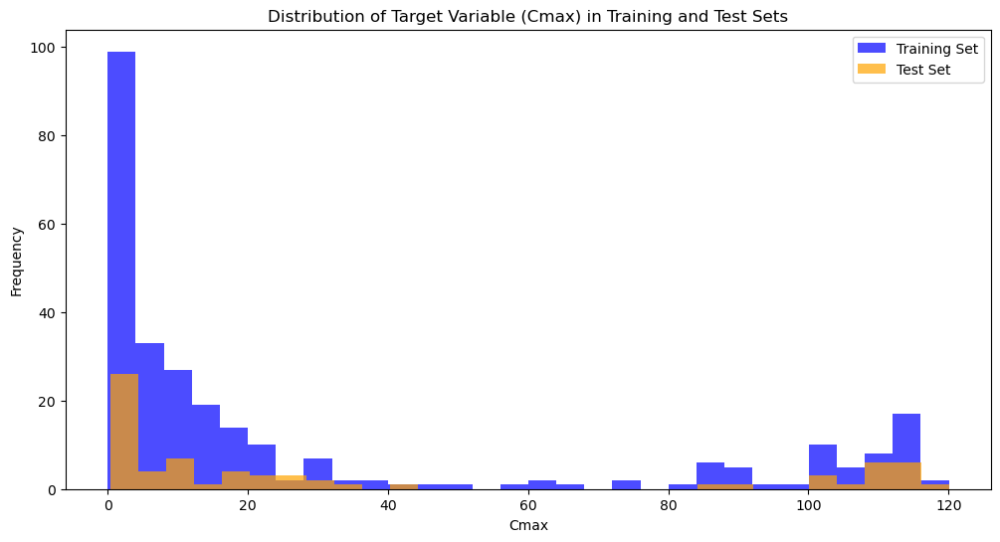

In [69]:
# Plotting histograms
plt.figure(figsize=(12, 6))

# Plot histogram for y_train
plt.hist(y_train_cmax, bins=30, alpha=0.7, label='Training Set', color='blue')

# Plot histogram for y_test
plt.hist(y_test_cmax, bins=30, alpha=0.7, label='Test Set', color='orange')

# Adding labels and title
plt.xlabel('Cmax')
plt.ylabel('Frequency')
plt.title('Distribution of Target Variable (Cmax) in Training and Test Sets')
plt.legend()

# # Save the plot to a file
plt.savefig('kn_cmax_hist.png', dpi=300, bbox_inches='tight')

# Show plot 
plt.show()

In [70]:
y_data_cmax_shuf.describe()

count    351.000000
mean      30.454289
std       40.940392
min        0.008726
25%        2.289774
50%        9.415812
75%       35.601714
max      120.048019
Name: Cmax, dtype: float64

In [71]:
percentiles = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
description_cmax = y_data_cmax_shuf.describe(percentiles=percentiles)
print(description_cmax)

count    351.000000
mean      30.454289
std       40.940392
min        0.008726
10%        0.691927
20%        1.295021
30%        3.148148
40%        5.084810
50%        9.415812
60%       14.377034
70%       23.339518
80%       85.193995
90%      109.662350
max      120.048019
Name: Cmax, dtype: float64


In [72]:
# Define custom bins
bins = [description_cmax['10%'], description_cmax['20%'], description_cmax['30%'], description_cmax['40%'], description_cmax['50%'], description_cmax['60%'], description_cmax['70%'], description_cmax['80%'], description_cmax['90%'],  np.inf]  # Custom bins
y_binned_cmax = np.digitize(y_data_cmax_shuf, bins)

# Check the distribution of instances in each bin
bin_counts_cmax = np.bincount(y_binned_cmax)
print("Bin counts:", bin_counts_cmax)

Bin counts: [35 35 35 35 35 35 35 32 34 40]


In [73]:
# Perform stratified train-test split
X_train_cmax, X_test_cmax, y_train_cmax, y_test_cmax = train_test_split(X_data_cmax_shuf, y_data_cmax_shuf, stratify=y_binned_cmax, test_size=0.2, random_state=42)

# Display the shapes of the resulting datasets
print("X_train shape:", X_train_cmax.shape)
print("X_test shape:", X_test_cmax.shape)
print("y_train shape:", y_train_cmax.shape)
print("y_test shape:", y_test_cmax.shape)
print()
print(f'y_train description: {y_train_cmax.describe()}')
print()
print(f'y_test description: {y_test_cmax.describe()}')

X_train shape: (280, 38)
X_test shape: (71, 38)
y_train shape: (280,)
y_test shape: (71,)

y_train description: count    280.000000
mean      30.363377
std       40.859838
min        0.008726
25%        2.209871
50%        9.340891
75%       35.489660
max      120.048019
Name: Cmax, dtype: float64

y_test description: count     71.000000
mean      30.812816
std       41.547085
min        0.068404
25%        2.348850
50%        9.437332
75%       35.265835
max      114.267431
Name: Cmax, dtype: float64


In [74]:
print(X_data['Material'].nunique())
print(X_data['Material'][X_train_cmax.index].nunique())
print(X_data['Material'][X_test_cmax.index].nunique())
print(X_data['Material'][X_train_cmax.index].value_counts())
print(X_data['Material'][X_test_cmax.index].value_counts())

7
7
7
graphene      72
SiO2          58
Au            56
liposome      37
iron_oxide    37
polymeric     14
lipid          6
Name: Material, dtype: int64
SiO2          17
Au            15
liposome      14
graphene      14
iron_oxide     8
polymeric      2
lipid          1
Name: Material, dtype: int64


### Scale numerical features

In [75]:
# Make dataframes with the numerical features of X_train and X_test
X_train_num_cmax = X_train_cmax[numerical_features_cmax]
X_test_num_cmax = X_test_cmax[numerical_features_cmax]

In [76]:
# Define scaler
feature_scaler_cmax = StandardScaler()

# Fit scaler on training features
feature_scaler_cmax.fit(X_train_num_cmax)

# Transform features
X_train_num_scaled_cmax = feature_scaler_cmax.transform(X_train_num_cmax)
X_test_num_scaled_cmax = feature_scaler_cmax.transform(X_test_num_cmax)

# Convert scaled features back to DataFrames
X_train_num_scaled_cmax_df = pd.DataFrame(X_train_num_scaled_cmax, columns=X_train_num_cmax.columns, index=X_train_num_cmax.index)
X_test_num_scaled_cmax_df = pd.DataFrame(X_test_num_scaled_cmax, columns=X_test_num_cmax.columns, index=X_test_num_cmax.index)

In [77]:
# Define non numerical features
non_numerical_features_cmax = [col for col in X_train_cmax.columns if col not in numerical_features_cmax]

# Define train data
X_train_cmax = pd.concat([X_train_num_scaled_cmax_df, X_train_cmax[non_numerical_features_cmax]], axis=1)
X_test_cmax = pd.concat([X_test_num_scaled_cmax_df, X_test_cmax[non_numerical_features_cmax]], axis=1)

# Check train and test dimensions
print(f'Train dimensions: {X_train_cmax.shape}')
print(f'Test dimensions: {X_test_cmax.shape}')

Train dimensions: (280, 38)
Test dimensions: (71, 38)


In [78]:
X_train_cmax.describe()

,Weight_g,Experiment_duration,Hydrodynamic_size_nm,Dose_MBq,Dose_mg,Material_type,Coating,Cancer_presence,Material_Au,Material_SiO2,...,Z-potential_neutral,Z-potential_positive,Z-potential_unknown,Sex_Female,Sex_Male,Sex_Unknown,Method_analysis_ICP-MS,Method_analysis_PET,Method_analysis_gamma_spectrometry,Method_analysis_other
count,2.800000e+02,2.800000e+02,2.800000e+02,2.800000e+02,2.800000e+02,280.000000,280.000000,280.000000,280.000000,280.000000,...,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000
mean,-2.981742e-16,-2.220446e-16,-1.141944e-16,-1.268826e-16,-5.709718e-17,0.203571,0.882143,0.903571,0.200000,0.207143,...,0.475000,0.067857,0.292857,0.746429,0.121429,0.132143,0.110714,0.321429,0.500000,0.067857
std,1.001791e+00,1.001791e+00,1.001791e+00,1.001791e+00,1.001791e+00,0.403375,0.323016,0.295707,0.400716,0.405984,...,0.500269,0.251951,0.455888,0.435834,0.327209,0.339252,0.314340,0.467861,0.500895,0.251951
min,-1.164512e+00,-1.907246e+00,-1.107966e+00,-9.909937e-01,-3.037148e-01,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,-8.461853e-01,-6.963097e-01,-7.744355e-01,-9.909937e-01,-3.037148e-01,0.000000,1.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,-3.835019e-01,5.188463e-01,-4.889664e-01,-3.446553e-01,-3.037148e-01,0.000000,1.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.500000,0.000000
75%,7.010280e-01,5.188463e-01,6.118672e-01,1.077289e+00,-1.819340e-01,0.000000,1.000000,1.000000,0.000000,0.000000,...,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000
max,3.647396e+00,1.734002e+00,2.545764e+00,1.413385e+00,1.244153e+01,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [79]:
# Calculate Z-scores for the features
z_scores = np.abs(X_train_cmax[numerical_features_cmax])

# Define the threshold for identifying outliers
threshold = 3

# Identify outliers
outliers = (z_scores > threshold)

# Create a dataframe showing which data points are outliers
outlier_df = pd.DataFrame(outliers, columns=X_train_cmax[numerical_features_cmax].columns)

# Display outliers
outliers_summary = outlier_df.sum(axis=0).sort_values(ascending=False)
print(outliers_summary)

# Optionally, you can get the indices of rows that are outliers in any feature
outlier_indices = np.where(outliers.any(axis=1))[0]

# Display the indices of outlier rows
print("Indices of outlier rows:", outlier_indices)

Weight_g                5
Dose_mg                 4
Experiment_duration     0
Hydrodynamic_size_nm    0
Dose_MBq                0
dtype: int64
Indices of outlier rows: [ 19  37  38  53 157 244 246 254 267]


In [80]:
# Define the threshold for identifying outliers
threshold = 3

# Identify outliers (rows where any scaled value > threshold or < -threshold)
outlier_indices_cmax = X_train_cmax[(X_train_cmax > threshold).any(axis=1) | (X_train_cmax < -threshold).any(axis=1)].index

# Display the indices of the outliers
print("Indices of outliers:", outlier_indices_cmax)

Indices of outliers: Int64Index([2180, 2178, 303, 2179, 306, 1766, 2181, 2177, 305], dtype='int64')


In [81]:
# Remove the rows with outliers from both X_train_cmax and y_train_cmax using DataFrame indices
X_train_cmax = X_train_cmax.drop(index=outlier_indices_cmax)
y_train_cmax = y_train_cmax.drop(index=outlier_indices_cmax)

# Display the shape of the filtered datasets
print("Filtered X_train_cmax shape:", X_train_cmax.shape)
print("Filtered y_train_cmax shape:", y_train_cmax.shape)

Filtered X_train_cmax shape: (271, 38)
Filtered y_train_cmax shape: (271,)


In [82]:
y_train_cmax.describe()

count    271.000000
mean      30.751945
std       41.281149
min        0.008726
25%        2.201578
50%        9.265971
75%       35.601714
max      120.048019
Name: Cmax, dtype: float64

In [83]:
# from scipy.stats import shapiro

# # Εκτέλεση Shapiro-Wilk test
# stat, p_value = shapiro(y_train_cmax)
# print(f'Statistic: {stat}, p-value: {p_value}')

# if p_value > 0.05:
#     print("The data appears to be normally distributed.")
# else:
#     print("The data does not appear to be normally distributed.")

In [84]:
# X_train_cmax.describe()

In [85]:
# # Step 1: Find the maximum value in 'Dose_mg'
# max_value = X_train_cmax['Dose_mg'].max()

# # Step 2: Find the index of the maximum value
# # This returns the index of the first occurrence of the maximum value
# index_max = X_train_cmax[X_train_cmax['Dose_mg'] == max_value].index[0]

# print("Index where 'Dose_mg' is maximum:", index_max)

In [86]:
# X_train_cmax = X_train_cmax.drop(1766)
# y_train_cmax = y_train_cmax.drop(1766)
# X_train_cmax.shape

In [87]:
# # Compute pairwise distances between training data points
# distances_train_cmax = pairwise_distances(X_train_cmax, X_train_cmax)

# # Calculate the mean distance to other training points for each point
# mean_distances_train_cmax = np.mean(distances_train_cmax, axis=1)

# # Define a threshold for high leverage (e.g., 95th percentile)
# threshold_leverage_train_cmax = np.percentile(mean_distances_train_cmax, 95)

# # Identify high leverage points
# high_leverage_points_train_cmax = np.where(mean_distances_train_cmax > threshold_leverage_train_cmax)[0]

# print("High leverage points detected:", high_leverage_points_train_cmax)

In [88]:
# # Drop leverage points from training data and target variable
# X_train_cmax = X_train_cmax.drop(X_train_cmax.iloc[high_leverage_points_train_cmax].index)
# y_train_cmax = y_train_cmax.drop(y_train_cmax.iloc[high_leverage_points_train_cmax].index)

# # Drop leverage points from whole dataset to be used in model AUC
# combined_indices = X_train_cmax.index.union(X_test_cmax.index)
# X_IQR = X_IQR.loc[X_IQR.index.isin(combined_indices)]

In [89]:
# # Combine indices from X_train_cmax and X_test_cmax
# combined_indices = X_train_cmax.index.union(X_test_cmax.index)

# # Check if any index in X_IQR is not present in the combined indices
# missing_indices = X_IQR.index.difference(combined_indices)


# if not missing_indices.empty:
#     print('Yes, some indices are missing.')
# else:
#     print('No missing indices.')

## Random Forest Regression for Model Cmax

In [90]:
# Define the model
rf_cmax =RandomForestRegressor(n_estimators=500, random_state=42)

# Fit the model to training data
rf_cmax.fit(X_train_cmax, y_train_cmax)

RandomForestRegressor(n_estimators=500, random_state=42)

In [91]:
# Get predictions
y_train_pred_cmax = rf_cmax.predict(X_train_cmax)
y_test_pred_cmax = rf_cmax.predict(X_test_cmax)

# Metrics for Cmax
r2_train_cmax = r2_score(y_train_cmax, y_train_pred_cmax)
r2_test_cmax = r2_score(y_test_cmax, y_test_pred_cmax)

# R^2 score using cross-validation
folds=10
cv_scores_cmax = cross_val_score(rf_cmax, X_train_cmax, y_train_cmax, cv=folds, scoring='r2')
mean_cv_r2_cmax = np.mean(cv_scores_cmax)

print(f'R^2 score on training set: {r2_train_cmax}')
print(f'R^2 score on test set: {r2_test_cmax}')
print(f'Mean R^2 score (CV): {mean_cv_r2_cmax}')
print(f'R^2 scores (CV): {cv_scores_cmax} for {folds} folds')

R^2 score on training set: 0.9959975197832505
R^2 score on test set: 0.9867356514849389
Mean R^2 score (CV): 0.9725796298022062
R^2 scores (CV): [0.94012818 0.97324693 0.98034254 0.97440568 0.9614147  0.955686
 0.99273369 0.98857645 0.98041369 0.97884844] for 10 folds


In [92]:
# Define the parameter grid
param_grid = {
    'n_estimators': [30, 50, 100, 200, 300],  # Number of trees in the forest
    'max_depth': [None, 10, 20, 30],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split an internal node
}

# Initialize the Grid Search with Random Forest
grid_search_cmax = GridSearchCV(estimator=rf_cmax, param_grid=param_grid, cv=10, scoring='r2', n_jobs=-1, verbose=2)

# Fit the Grid Search model
grid_search_cmax.fit(X_train_cmax, y_train_cmax)

# Extract the best parameters and best score
best_params_cmax = grid_search_cmax.best_params_
best_score_cmax = grid_search_cmax.best_score_

# Print the best parameters and the best score
print(f"Best parameters found: {best_params_cmax}")
print(f"Best R^2 score from Grid Search (CV): {best_score_cmax}")

# Use the best estimator to make predictions
best_rf_cmax = grid_search_cmax.best_estimator_

# Get predictions on training and test sets using the best estimator
y_train_pred_cmax = best_rf_cmax.predict(X_train_cmax)
y_test_pred_cmax = best_rf_cmax.predict(X_test_cmax)

# Metrics for Cmax
r2_train_cmax = r2_score(y_train_cmax, y_train_pred_cmax)
r2_test_cmax = r2_score(y_test_cmax, y_test_pred_cmax)

# Cross-Validation R^2 Score with the best model
cv_scores_r2_cmax = cross_val_score(best_rf_cmax, X_train_cmax, y_train_cmax, cv=10, scoring='r2')
mean_cv_r2_cmax = np.mean(cv_scores_r2_cmax)

# Print the R^2 scores
print(f'R^2 score on training set: {r2_train_cmax}')
print(f'R^2 score on test set: {r2_test_cmax}')
print(f'Mean R^2 score (CV): {mean_cv_r2_cmax}')
print(f'R^2 scores (CV): {cv_scores_r2_cmax} for {folds} folds')


Fitting 10 folds for each of 60 candidates, totalling 600 fits
Best parameters found: {'max_depth': 20, 'min_samples_split': 2, 'n_estimators': 200}
Best R^2 score from Grid Search (CV): 0.9728360371742293
R^2 score on training set: 0.9960134111202057
R^2 score on test set: 0.9872747715607536
Mean R^2 score (CV): 0.9728360371742293
R^2 scores (CV): [0.94184307 0.97371045 0.98114659 0.97417838 0.96089342 0.95625373
 0.99336681 0.98888329 0.9796453  0.97843934] for 10 folds


In [93]:
# Manually define root_mean_squared_error to avoid deprecation warning
def root_mean_squared_error(y_true, y_pred):
    return np.sqrt(np.mean((y_pred - y_true) ** 2))


In [94]:
# RMSE metrics
rmse_train_cmax = root_mean_squared_error(y_train_cmax, y_train_pred_cmax)
rmse_test_cmax = root_mean_squared_error(y_test_cmax, y_test_pred_cmax)

cv_scores_rmse_cmax = cross_val_score(best_rf_cmax, X_train_cmax, y_train_cmax, cv=10,
                                      scoring=make_scorer(root_mean_squared_error))
mean_cv_rmse_cmax = np.mean(cv_scores_rmse_cmax)

print(f'RMSE on training set: {rmse_train_cmax}')
print(f'RMSE on test set: {rmse_test_cmax}')
print(f'Mean RMSE score (CV): {mean_cv_rmse_cmax}')
print(f'RMSE scores (CV): {cv_scores_rmse_cmax} for {folds} folds')


RMSE on training set: 2.601655182529271
RMSE on test set: 4.653644410413546
Mean RMSE score (CV): 6.180631321405482
RMSE scores (CV): [9.04733081 7.38966198 6.19827762 7.11816106 7.02655186 5.97694124
 3.63408066 4.83922479 4.52888834 6.04719486] for 10 folds


### Plot results

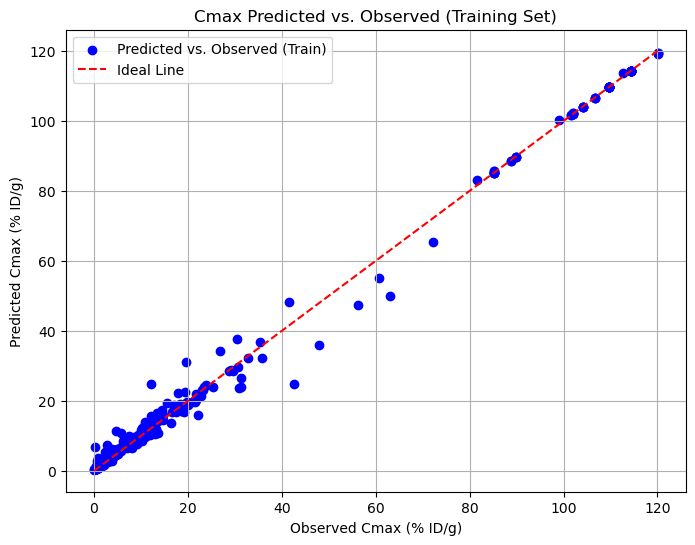

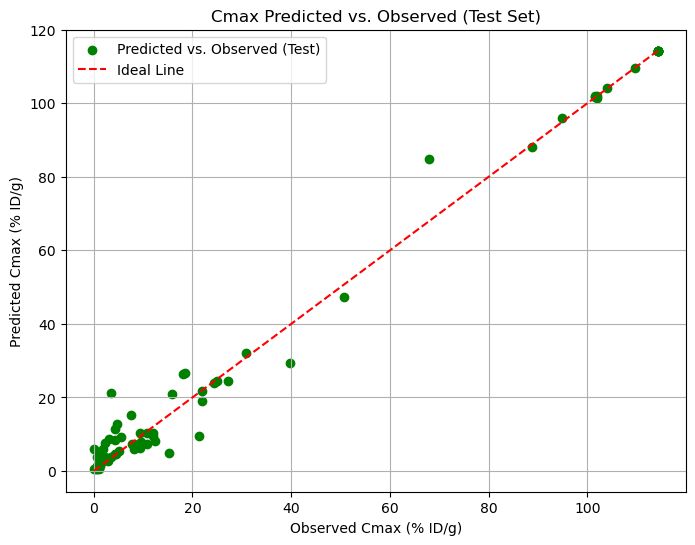

In [95]:
# Plot predicted vs. observed for training set Cmax
plt.figure(figsize=(8, 6))
plt.scatter(y_train_cmax, y_train_pred_cmax, color='blue', label='Predicted vs. Observed (Train)')
plt.plot([min(y_train_cmax), max(y_train_cmax)], [min(y_train_cmax), max(y_train_cmax)], linestyle='--', color='red', label='Ideal Line')
plt.xlabel('Observed Cmax (% ID/g)')
plt.ylabel('Predicted Cmax (% ID/g)')
plt.title(f'{target1} Predicted vs. Observed (Training Set)')
plt.legend()
plt.grid(True)
plt.savefig('cmax_ypred_training_set', dpi=300)  
plt.show()

# Plot predicted vs. observed for test set
plt.figure(figsize=(8, 6))
plt.scatter(y_test_cmax, y_test_pred_cmax, color='green', label='Predicted vs. Observed (Test)')
plt.plot([min(y_test_cmax), max(y_test_cmax)], [min(y_test_cmax), max(y_test_cmax)], linestyle='--', color='red', label='Ideal Line')
plt.xlabel('Observed Cmax (% ID/g)')
plt.ylabel('Predicted Cmax (% ID/g)')
plt.title(f'{target1} Predicted vs. Observed (Test Set)')
plt.legend()
plt.grid(True)
plt.savefig('cmax_ypred_test_set', dpi=300)  
plt.show()

## Feature importances

In [96]:
# Create a dataframe for feature importances
df_feature_importances = pd.DataFrame({
    'Feature': best_rf_cmax.feature_names_in_,
    'Importance': best_rf_cmax.feature_importances_
})

# Sort by 'Importance' in descending order
df_feature_importances = df_feature_importances.sort_values(by='Importance', ascending=False)

# Reset the index
df_feature_importances = df_feature_importances.reset_index(drop=True)

# Display the DataFrame
print(df_feature_importances.shape)
print(df_feature_importances)

(38, 2)
                               Feature  Importance
0                         Organs_Blood    0.916586
1                         Organs_Liver    0.028368
2                             Weight_g    0.015515
3                  Experiment_duration    0.013530
4                 Hydrodynamic_size_nm    0.005625
5                        Organs_Spleen    0.003800
6                              Dose_mg    0.001865
7                         Organs_Heart    0.001535
8                   Material_polymeric    0.001443
9                       Organs_Muscles    0.001394
10                        Organs_Lungs    0.001140
11                       Material_type    0.000843
12                Z-potential_positive    0.000833
13                            Dose_MBq    0.000787
14  Method_analysis_gamma_spectrometry    0.000590
15                        Shape_sphere    0.000543
16                 Z-potential_neutral    0.000460
17                 Method_analysis_PET    0.000425
18              Method_

In [97]:
df_feature_importances.to_excel('feature_importances_cmax.xlsx', index=False)

## Applicability domain (AD)

### Range 

#### Train set

In [98]:
X_train_cmax_pca = X_data.loc[X_train_cmax.index]
X_train_cmax_pca[numerical_features_cmax].describe()

,Weight_g,Experiment_duration,Hydrodynamic_size_nm,Dose_MBq,Dose_mg
count,271.000000,271.000000,271.000000,271.000000,271.000000
mean,19.903700,38.349446,76.918044,3.877380,0.068226
std,2.322299,19.458564,65.811012,3.909888,0.160805
min,17.000000,0.083333,3.530000,0.000000,0.000000
25%,17.860000,24.000000,25.820000,0.000000,0.000000
50%,19.110000,48.000000,44.100000,2.500000,0.000000
75%,20.110000,48.000000,117.500000,8.000000,0.038220
max,25.000000,72.000000,243.000000,9.300000,1.000000


In [99]:
column_name_train_pca = X_train_cmax_pca.columns
print(column_name_train_pca)

Index(['Weight_g', 'Experiment_duration', 'Hydrodynamic_size_nm', 'Material',
       'Material_type', 'Organs', 'Shape', 'Coating', 'Z-potential', 'Sex',
       'Cancer_presence', 'Method_analysis', 'Dose_MBq', 'Dose_mg'],
      dtype='object')


In [100]:
for column in column_name_train_pca:
    if column in categorical_features_cmax:
        print(f'There unique categories in {column} are: {X_train_cmax_pca[column].unique()}')

There unique categories in Material are: ['liposome' 'iron_oxide' 'graphene' 'SiO2' 'Au' 'polymeric' 'lipid']
There unique categories in Material_type are: [1 0]
There unique categories in Organs are: ['Lungs' 'Liver' 'Muscles' 'Blood' 'Kidneys' 'Heart' 'Spleen' 'Brain']
There unique categories in Shape are: ['Unknown' 'sheet' 'other' 'sphere']
There unique categories in Coating are: [1 0]
There unique categories in Z-potential are: ['negative' 'neutral' 'unknown' 'positive']
There unique categories in Sex are: ['Female' 'Unknown' 'Male']
There unique categories in Cancer_presence are: [1 0]
There unique categories in Method_analysis are: ['gamma_spectrometry' 'other' 'PET' 'ICP-MS']


#### Test set

In [101]:
X_test_cmax_pca = X_data.loc[X_test_cmax.index]
X_test_cmax_pca[numerical_features_cmax].describe()

,Weight_g,Experiment_duration,Hydrodynamic_size_nm,Dose_MBq,Dose_mg
count,71.000000,71.000000,71.000000,71.000000,71.000000
mean,20.077316,35.988263,85.600282,3.543380,0.142827
std,2.644396,20.762954,68.366160,3.856788,0.333712
min,17.000000,0.166667,5.500000,0.000000,0.000000
25%,17.860000,22.000000,26.410000,0.000000,0.000000
50%,19.110000,48.000000,70.000000,0.300000,0.000000
75%,20.110000,48.000000,134.600000,8.000000,0.038220
max,30.000000,72.000000,243.000000,9.300000,1.400000


In [102]:
column_name_test_pca = X_test_cmax_pca.columns
print(column_name_test_pca)

Index(['Weight_g', 'Experiment_duration', 'Hydrodynamic_size_nm', 'Material',
       'Material_type', 'Organs', 'Shape', 'Coating', 'Z-potential', 'Sex',
       'Cancer_presence', 'Method_analysis', 'Dose_MBq', 'Dose_mg'],
      dtype='object')


In [103]:
for column in column_name_test_pca:
    if column in categorical_features_cmax:
        print(f'There unique categories in {column} are: {X_test_cmax_pca[column].unique()}')

There unique categories in Material are: ['Au' 'liposome' 'graphene' 'lipid' 'iron_oxide' 'polymeric' 'SiO2']
There unique categories in Material_type are: [0 1]
There unique categories in Organs are: ['Heart' 'Kidneys' 'Blood' 'Spleen' 'Muscles' 'Lungs' 'Liver' 'Brain']
There unique categories in Shape are: ['Unknown' 'sheet' 'other' 'sphere']
There unique categories in Coating are: [1 0]
There unique categories in Z-potential are: ['unknown' 'neutral' 'negative' 'positive']
There unique categories in Sex are: ['Female' 'Unknown' 'Male']
There unique categories in Cancer_presence are: [1 0]
There unique categories in Method_analysis are: ['ICP-MS' 'gamma_spectrometry' 'PET' 'other']


#### Range check

In [104]:
# Initialize a boolean Series to store whether each row has values out of bounds
out_of_bounds = pd.Series(False, index=X_test_cmax_pca.index)

# Iterate over each numerical feature
for col in numerical_features_cmax:
    # Check for values larger than the maximum in the training set
    larger = X_test_cmax_pca[col] > X_train_cmax_pca[col].max()
    # Check for values smaller than the minimum in the training set
    smaller = X_test_cmax_pca[col] < X_train_cmax_pca[col].min()
    # Update the out_of_bounds Series
    out_of_bounds = out_of_bounds | larger | smaller

# Count the number of rows that have at least one out-of-bounds value
out_of_bounds_count = out_of_bounds.sum()

# Display the result
print(f'Number of rows in test set with at least one feature value out of bounds: {out_of_bounds_count}')


# Find the indices of the out-of-bounds samples
out_of_bounds_indices = out_of_bounds[out_of_bounds].index

# Display the indices of the out-of-bounds samples
print(f'Indices of out-of-bounds samples in X_test_cmax_pca: {list(out_of_bounds_indices)}')

Number of rows in test set with at least one feature value out of bounds: 5
Indices of out-of-bounds samples in X_test_cmax_pca: [302, 2173, 301, 304, 2175]


### PCA method

#### PCA with range

In [105]:
# X_train_pca_cmax.shape

Number of components explaining 90% of variance: 16
Indices of outliers in X_test_cmax: [ 0  4  5 23 30 35 43 44 48 55 59 65]
Number of outliers: 12


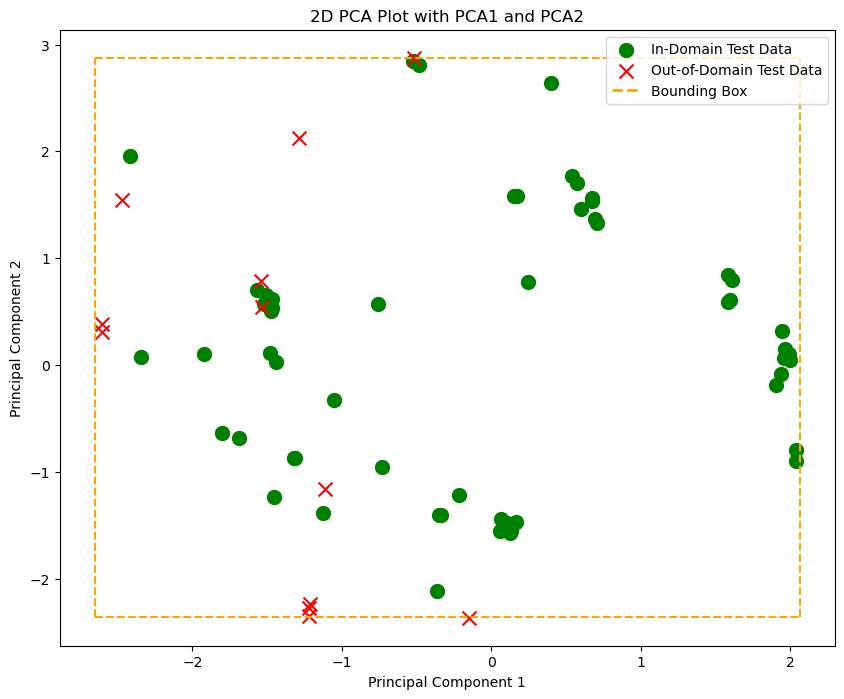

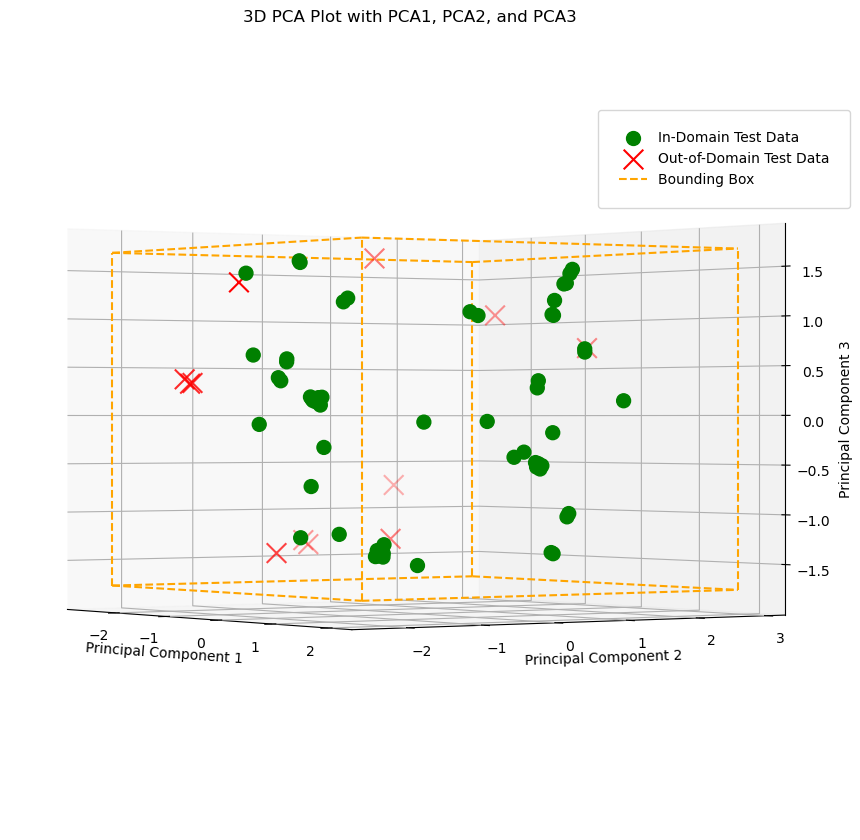

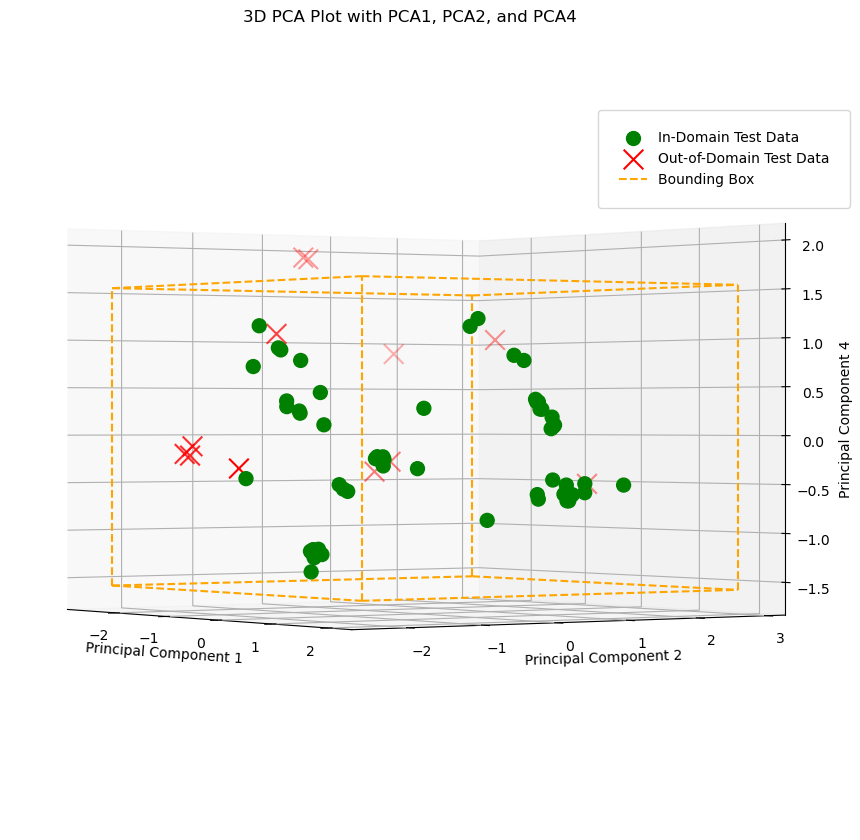

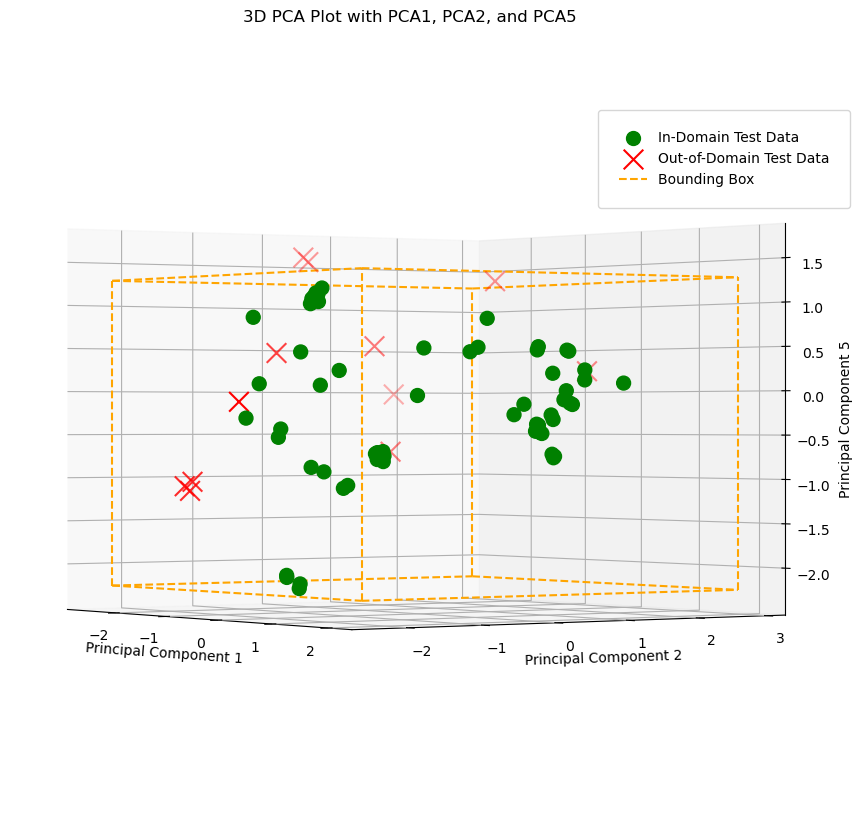

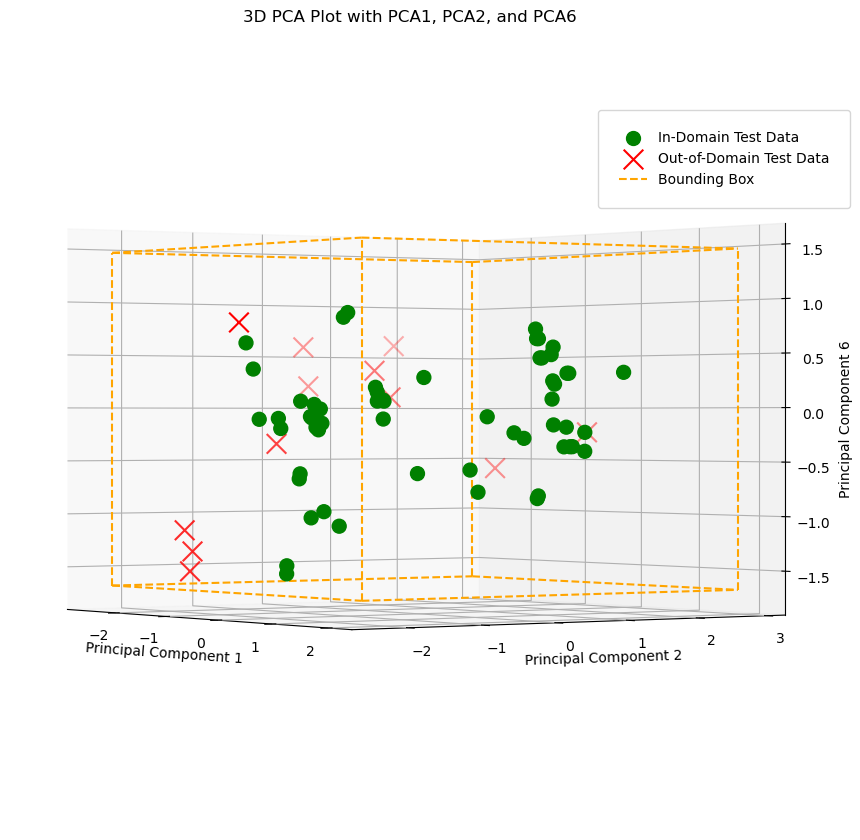

...

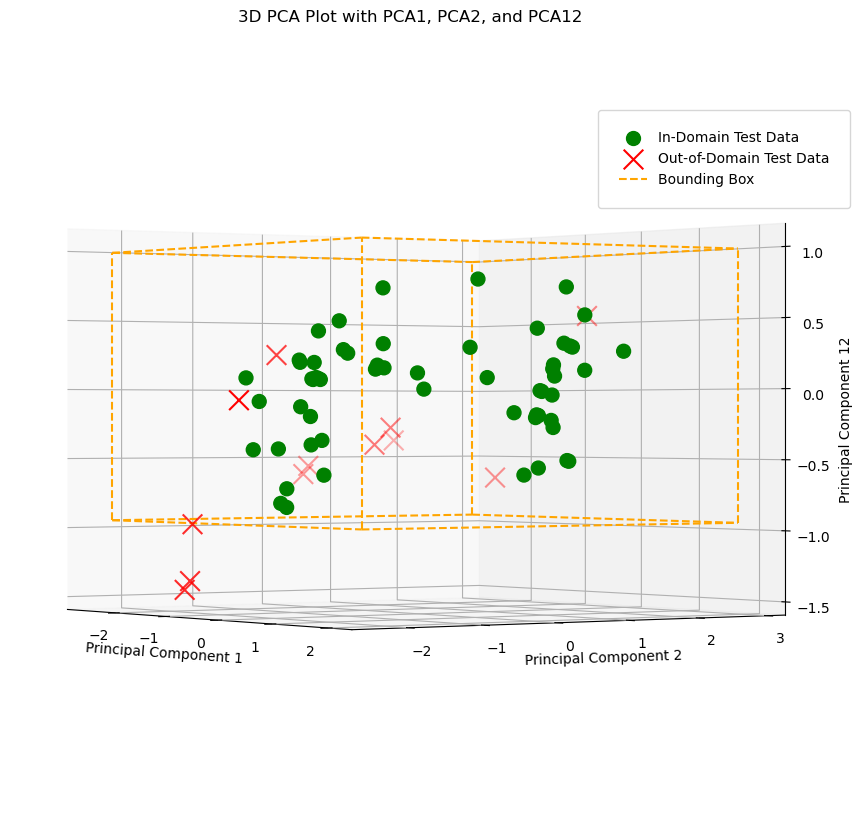

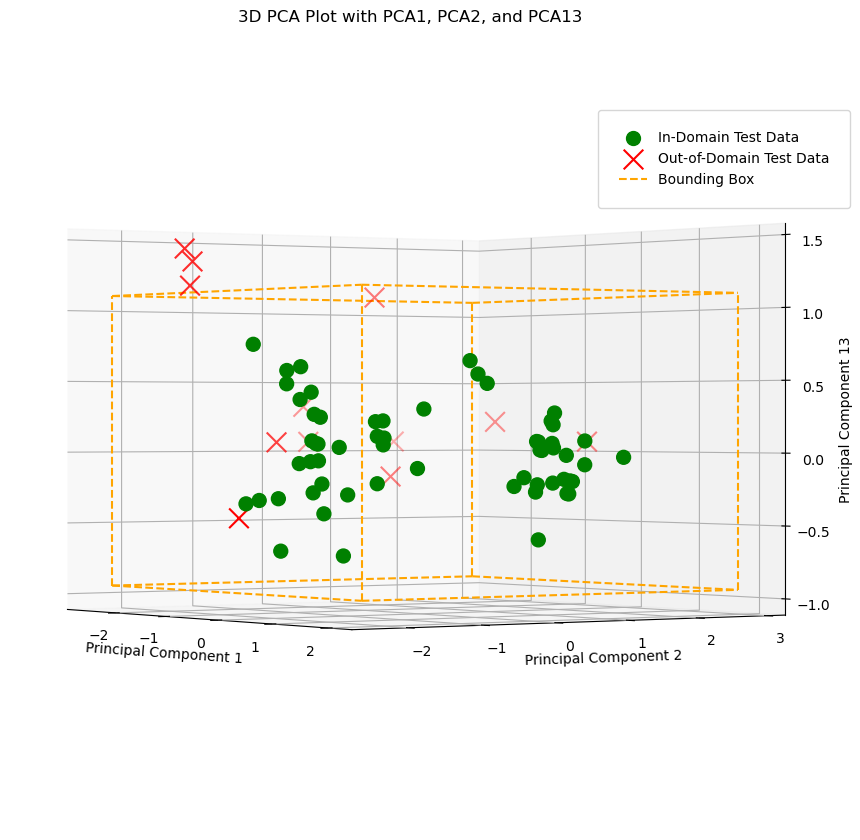

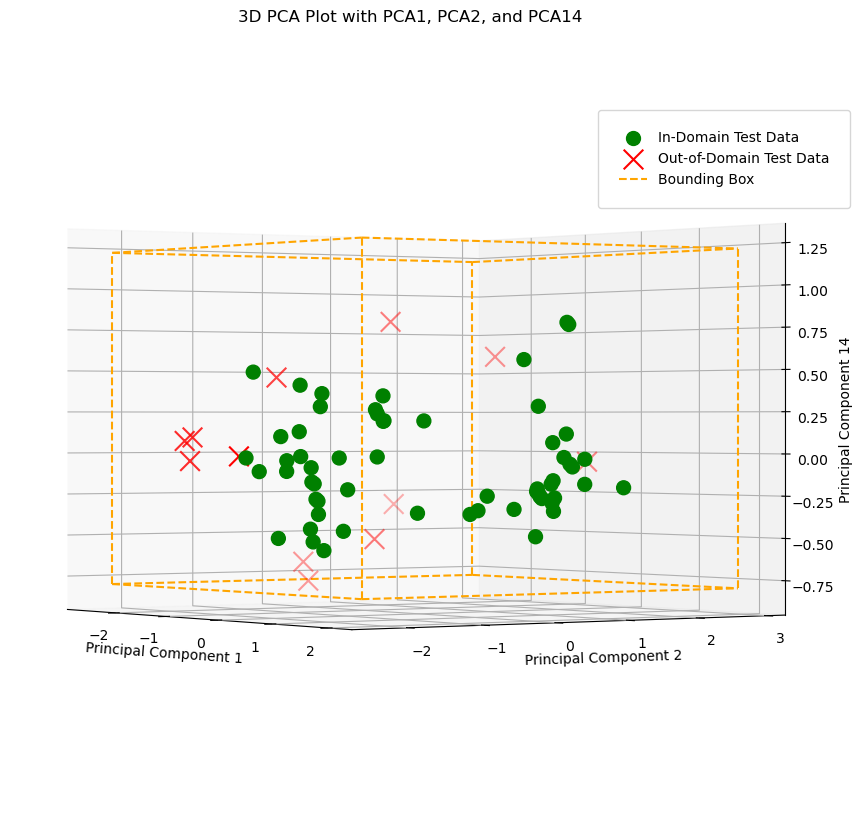

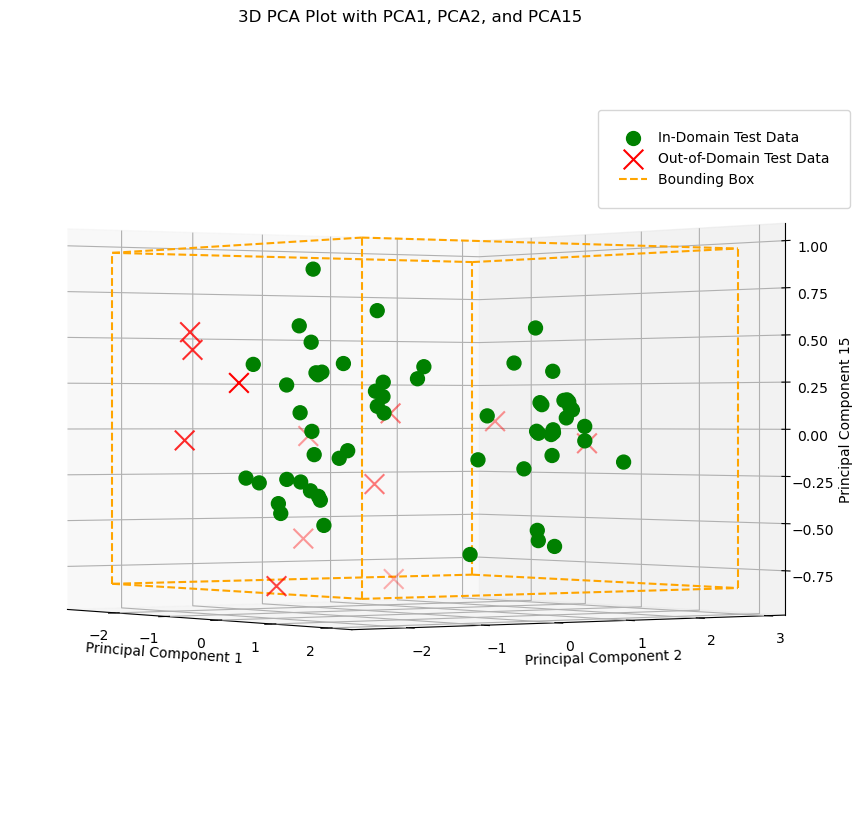

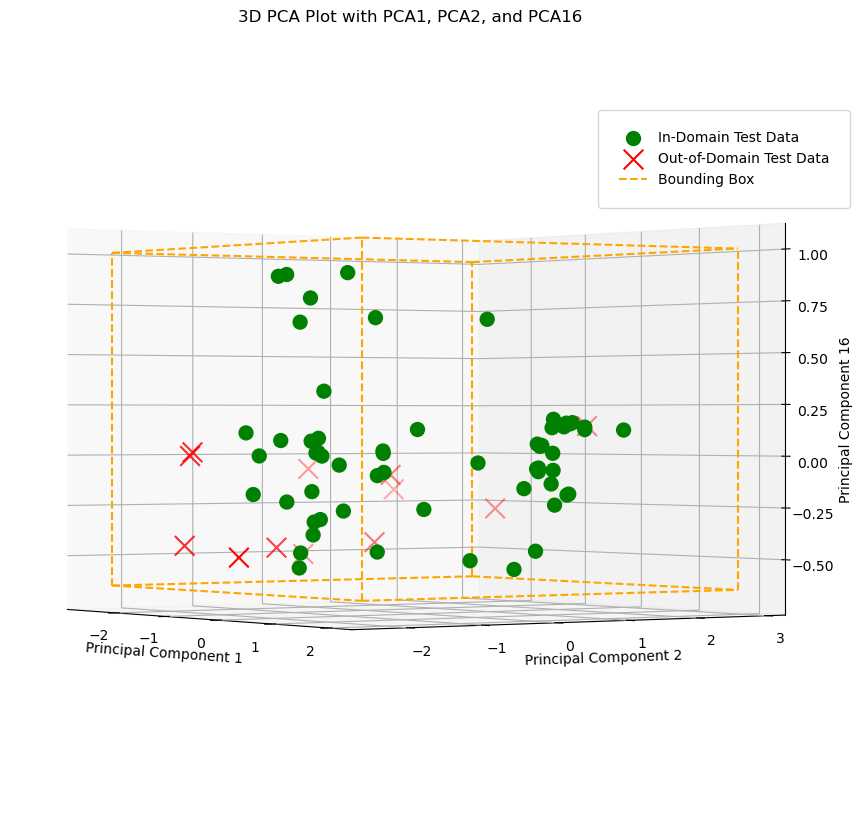

In [106]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.lines import Line2D
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt

# Perform PCA on the training data to retain 90% of the variance
pca_cmax = PCA(n_components=0.90)
X_train_pca_cmax = pca_cmax.fit_transform(X_train_cmax)
X_test_pca_cmax = pca_cmax.transform(X_test_cmax)

# Determine the number of components (n) that explain 90% of the variance
n_components = pca_cmax.n_components_
print(f'Number of components explaining 90% of variance: {n_components}')

# Define the bounds for the PCA space (bounding box for the training data)
lower_bounds_cmax = np.min(X_train_pca_cmax, axis=0)
upper_bounds_cmax = np.max(X_train_pca_cmax, axis=0)

# Check if test data points fall within the defined bounds (bounding box)
within_domain_cmax = np.all(
    (X_test_pca_cmax >= lower_bounds_cmax) & (X_test_pca_cmax <= upper_bounds_cmax),
    axis=1
)

# Identify outliers based on the PCA bounding box
outliers_cmax_pca = X_test_cmax[~within_domain_cmax]
num_outliers = outliers_cmax_pca.shape[0]

# Find the indices of the outliers
outlier_indices = np.where(~within_domain_cmax)[0]

# Print the indices of the outliers and number of them
print(f'Indices of outliers in X_test_cmax: {outlier_indices}')
print(f'Number of outliers: {num_outliers}')


# 2D plot for PCA1 and PCA2
plt.figure(figsize=(10, 8))

# Plot in-domain test data as green markers
plt.scatter(X_test_pca_cmax[within_domain_cmax, 0], X_test_pca_cmax[within_domain_cmax, 1], 
            color='green', alpha=1.0, s=100, marker='o', label='In-Domain Test Data')

# Plot out-of-domain test data as solid red 'x' markers
plt.scatter(X_test_pca_cmax[~within_domain_cmax, 0], X_test_pca_cmax[~within_domain_cmax, 1], 
            color='red', s=100, marker='x', label='Out-of-Domain Test Data')

# Draw bounding box in 2D (only the sides for PCA1 and PCA2)
plt.plot([lower_bounds_cmax[0], upper_bounds_cmax[0]], [lower_bounds_cmax[1], lower_bounds_cmax[1]], 'orange', linestyle="--")
plt.plot([lower_bounds_cmax[0], upper_bounds_cmax[0]], [upper_bounds_cmax[1], upper_bounds_cmax[1]], 'orange', linestyle="--")
plt.plot([lower_bounds_cmax[0], lower_bounds_cmax[0]], [lower_bounds_cmax[1], upper_bounds_cmax[1]], 'orange', linestyle="--")
plt.plot([upper_bounds_cmax[0], upper_bounds_cmax[0]], [lower_bounds_cmax[1], upper_bounds_cmax[1]], 'orange', linestyle="--")

# Custom legend entry for the bounding box lines
legend_lines = [Line2D([0], [0], color='orange', linestyle='--', lw=2, label='Bounding Box')]

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('2D PCA Plot with PCA1 and PCA2')
plt.legend(handles=plt.gca().get_legend_handles_labels()[0] + legend_lines, loc='upper right')
plt.show()

# 3D plots for PCA1, PCA2, and varying the third component
for i in range(2, n_components):
    fig = plt.figure(figsize=(14, 10))  # Increase figure size for more space
    ax = fig.add_subplot(111, projection='3d')
    
    # Plot in-domain test data as green markers
    ax.scatter(X_test_pca_cmax[within_domain_cmax, 0], X_test_pca_cmax[within_domain_cmax, 1], 
               X_test_pca_cmax[within_domain_cmax, i], color='green', alpha=1.0, s=100, marker='o', label='In-Domain Test Data', zorder=1)
    
    # Plot out-of-domain test data as solid red 'x' markers with increased size and zorder
    ax.scatter(X_test_pca_cmax[~within_domain_cmax, 0], X_test_pca_cmax[~within_domain_cmax, 1], 
               X_test_pca_cmax[~within_domain_cmax, i], color='red', s=200, marker='x', label='Out-of-Domain Test Data', zorder=2)
    
    # Plot the bounding box (in-domain region)
    corners = np.array([
        [lower_bounds_cmax[0], lower_bounds_cmax[1], lower_bounds_cmax[i]],
        [lower_bounds_cmax[0], lower_bounds_cmax[1], upper_bounds_cmax[i]],
        [lower_bounds_cmax[0], upper_bounds_cmax[1], lower_bounds_cmax[i]],
        [lower_bounds_cmax[0], upper_bounds_cmax[1], upper_bounds_cmax[i]],
        [upper_bounds_cmax[0], lower_bounds_cmax[1], lower_bounds_cmax[i]],
        [upper_bounds_cmax[0], lower_bounds_cmax[1], upper_bounds_cmax[i]],
        [upper_bounds_cmax[0], upper_bounds_cmax[1], lower_bounds_cmax[i]],
        [upper_bounds_cmax[0], upper_bounds_cmax[1], upper_bounds_cmax[i]],
    ])

    # Define pairs of corners that need to be connected to form the bounding box
    edges = [
        (0, 1), (0, 2), (0, 4),
        (1, 3), (1, 5),
        (2, 3), (2, 6),
        (3, 7),
        (4, 5), (4, 6),
        (5, 7),
        (6, 7),
    ]

    # Plot the edges of the bounding box
    for edge in edges:
        ax.plot3D(*corners[list(edge)].T, color="orange", linestyle="--", label='Bounding Box' if edge == edges[0] else "")
    
    # Labels and title
    ax.set_xlabel('Principal Component 1')
    ax.set_ylabel('Principal Component 2')
    ax.set_zlabel(f'Principal Component {i+1}')
    ax.set_title(f'3D PCA Plot with PCA1, PCA2, and PCA{i+1}')
    
    # Ensure the legend is fully visible
    ax.legend(loc='upper right', bbox_to_anchor=(1.05, 0.9), borderaxespad=0., borderpad=1.5)
    
    # Adjust the plot layout to prevent cutting off parts of the plot
    plt.subplots_adjust(left=0.1, right=1, top=0.9, bottom=0.1)
    
    # Adjust the view angle for better visibility
    ax.view_init(elev=0., azim=-35)
    
    plt.show()
    
    
   


#### Outliers predictions PCA

In [107]:
# # Get the predictions
# y_pca_pred_cmax = best_rf_cmax.predict(outliers_cmax_pca)

# # Calculate R2 and RMSE
# r2_pca_cmax = r2_score(y_test_cmax[~within_domain_cmax], y_pca_pred_cmax)
# rmse_pca_cmax = root_mean_squared_error(y_test_cmax[~within_domain_cmax], y_pca_pred_cmax)

# # Print the results
# print(f'R^2 score on outliers with PCA: {r2_pca_cmax}')
# print(f'RMSE score on outliers with PCA: {rmse_pca_cmax}')

In [108]:
# Get the predictions for the outliers in PCA space
y_pca_pred_cmax = best_rf_cmax.predict(outliers_cmax_pca)

# Get the corresponding actual values from y_test_cmax for the outliers
y_actual_cmax_outliers = y_test_cmax[~within_domain_cmax]

# Calculate the absolute error for each outlier
absolute_errors = np.abs(y_pca_pred_cmax - y_actual_cmax_outliers)

# Print the absolute errors
print("Absolute errors for the outliers:")
print(absolute_errors)


Absolute errors for the outliers:
302      7.811605
2173    16.730217
2195     4.149270
1491     1.383300
1122     5.562593
1429     2.806691
1849     0.460515
301      0.638045
415      0.369115
1306     0.297564
304     17.674305
2175     3.306383
Name: Cmax, dtype: float64


#### PCA with std

Number of components explaining 90% of variance: 16
Number of outliers: 7
Outliers' feature values:
      Weight_g  Experiment_duration  Hydrodynamic_size_nm  Dose_MBq   Dose_mg  \
302   1.056369             0.518846             -1.077909 -0.990994  4.157123   
1491  0.701028             0.518846              1.738639 -0.990994  0.679454   
1698 -1.164512             1.734002              0.363932 -0.990994  1.289441   
1696 -1.164512             1.734002              0.363932 -0.990994  1.289441   
301   1.056369             0.518846             -1.077909 -0.990994  4.157123   
1747 -0.054071             0.518846              0.669083 -0.990994  2.882598   
304   1.056369             0.518846             -1.077909 -0.990994  4.157123   

      Material_type  Coating  Cancer_presence  Material_Au  Material_SiO2  \
302               0        1                1            1              0   
1491              0        1                1            0              1   
1698              1 

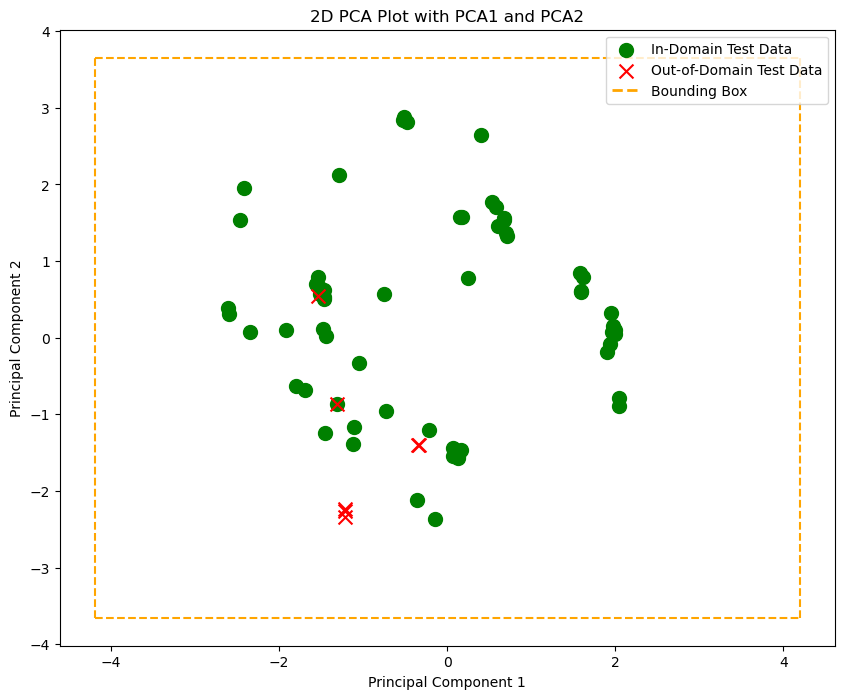

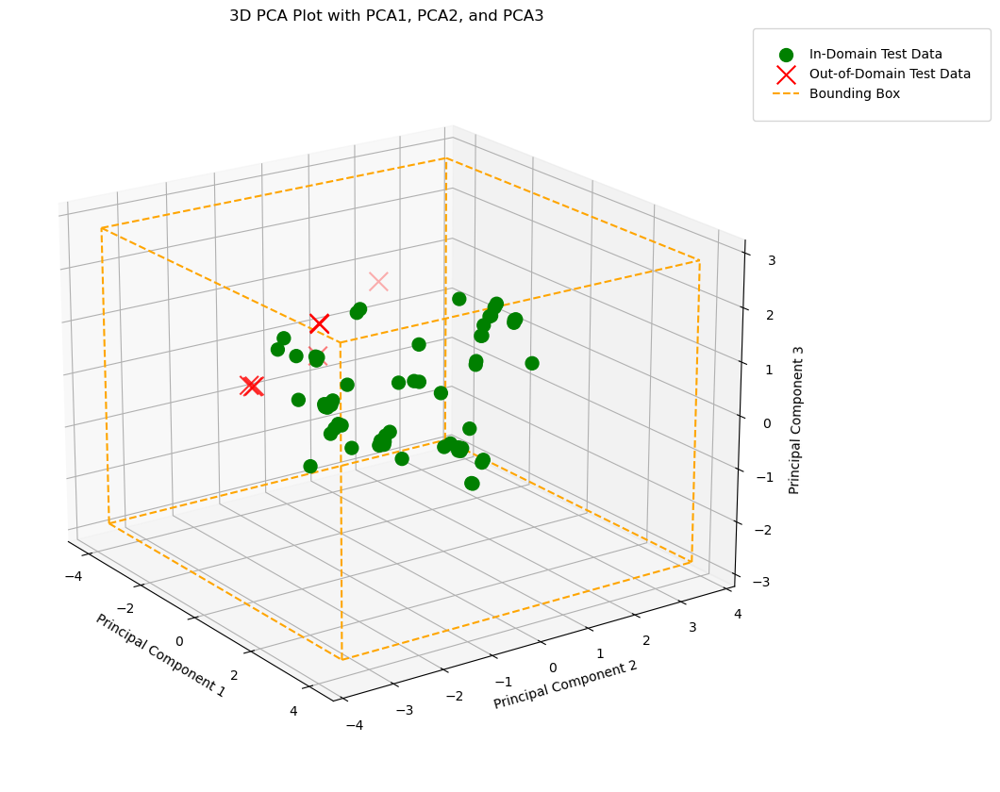

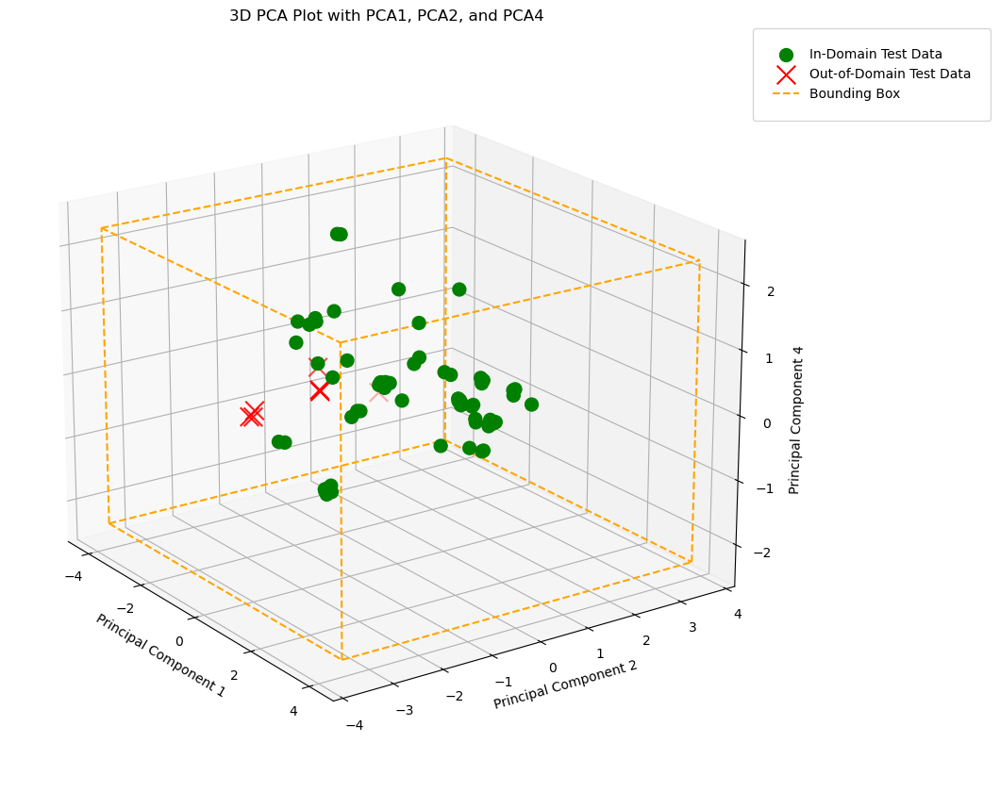

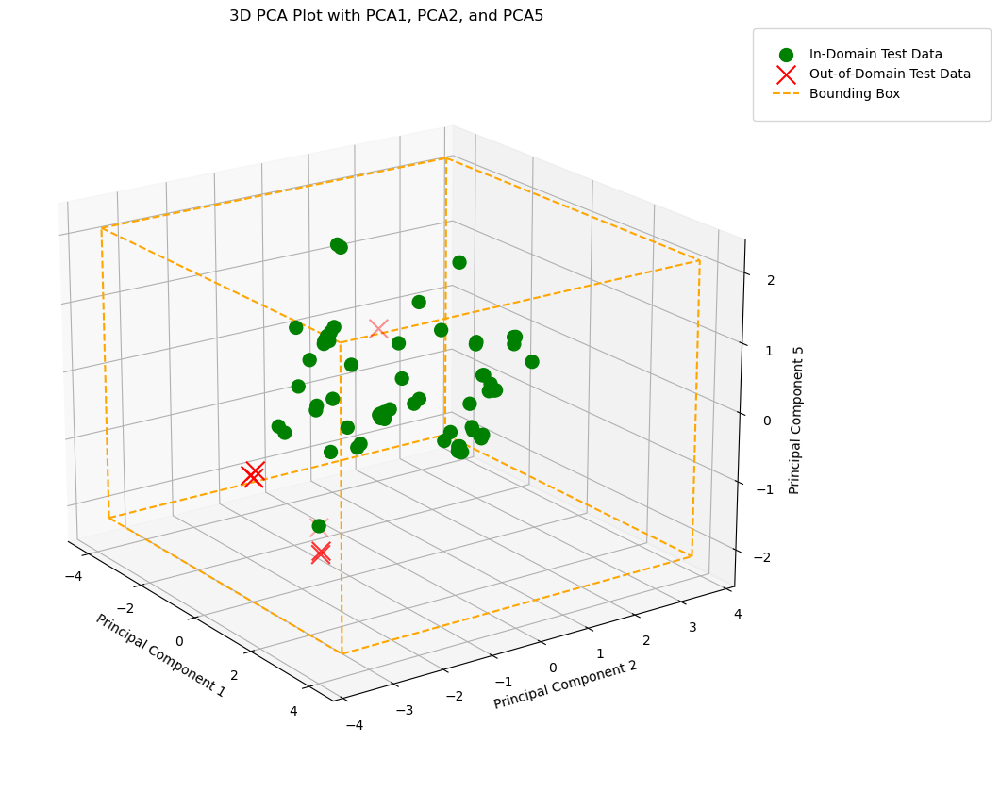

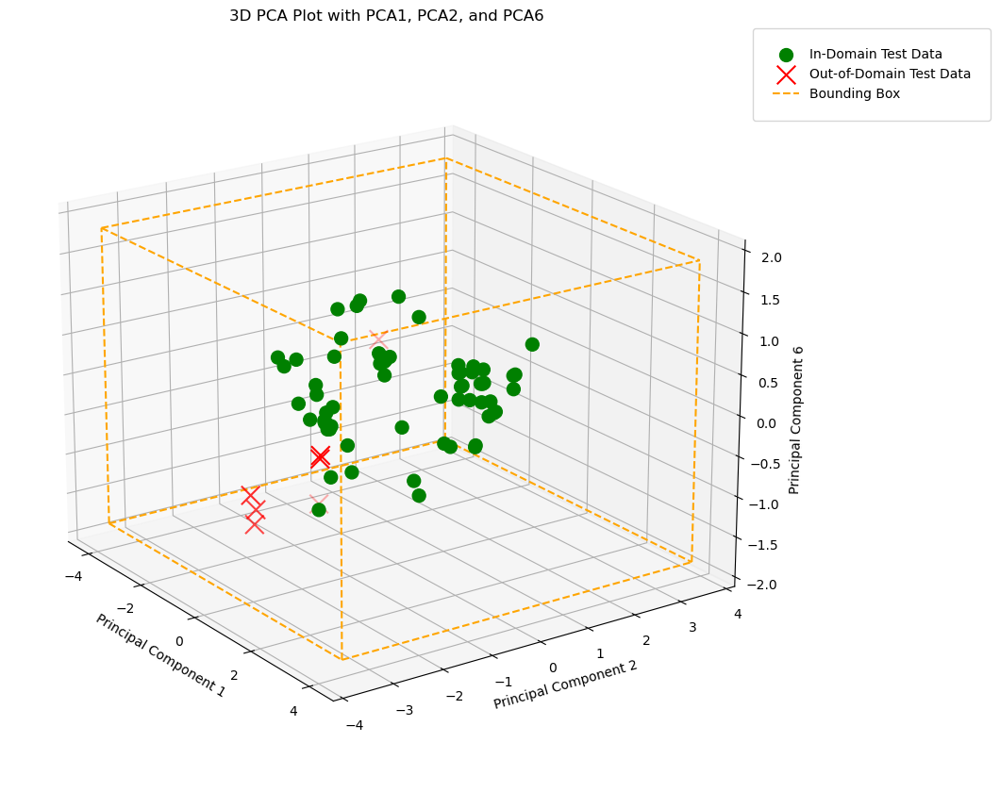

...

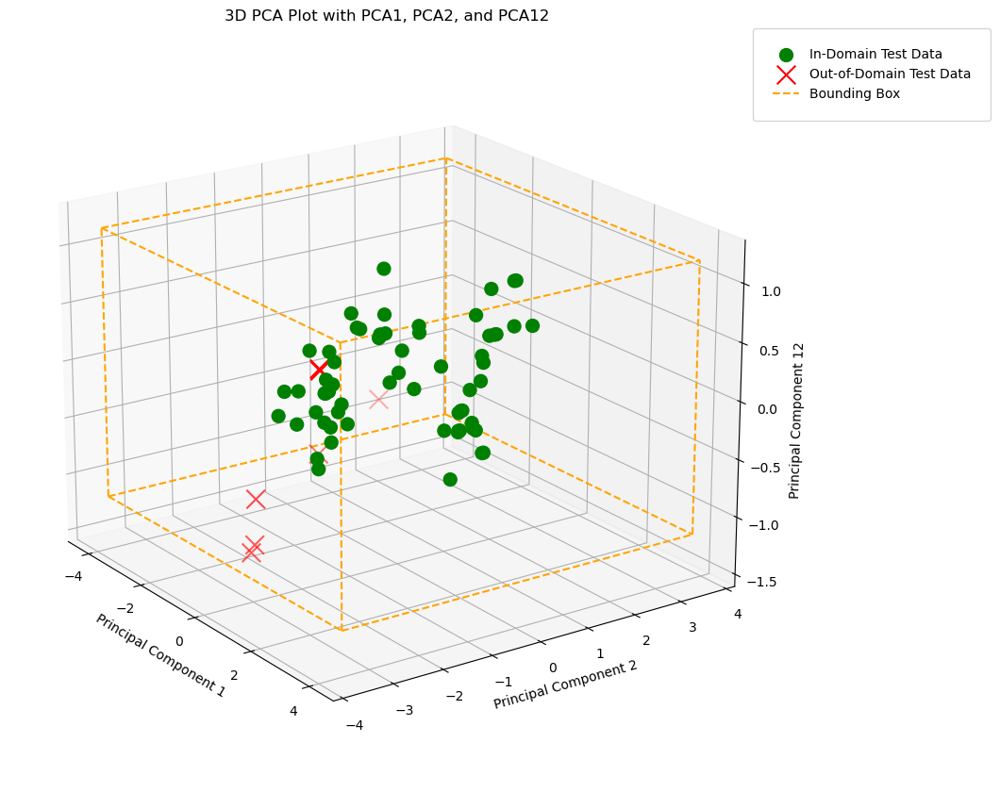

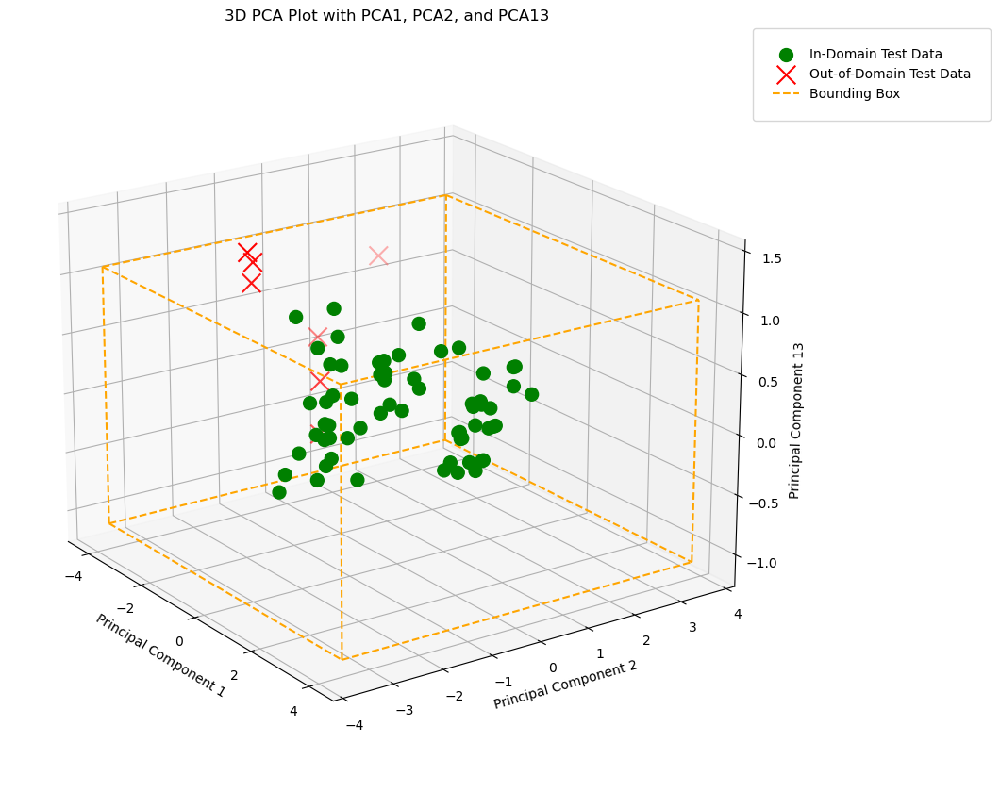

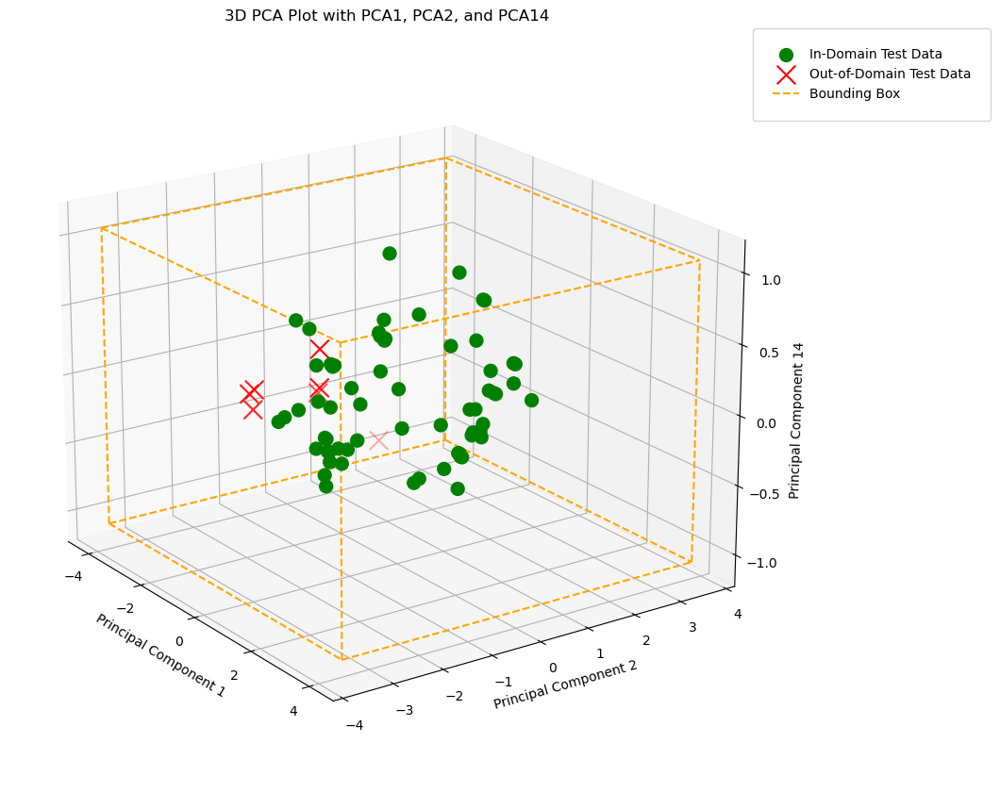

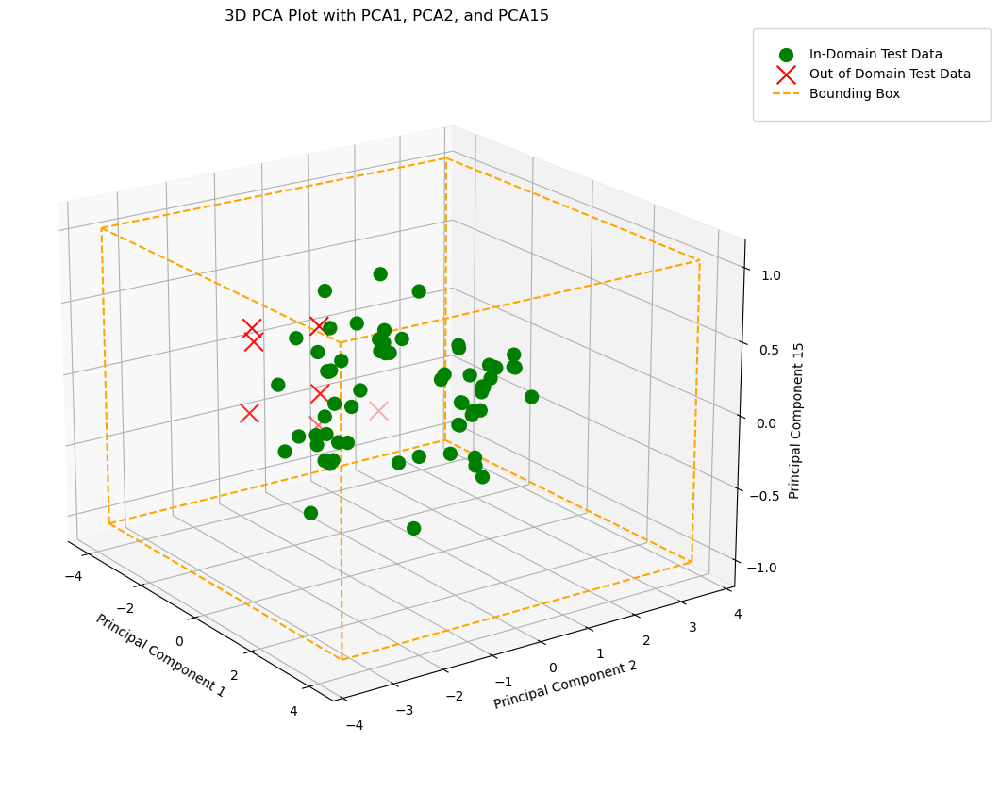

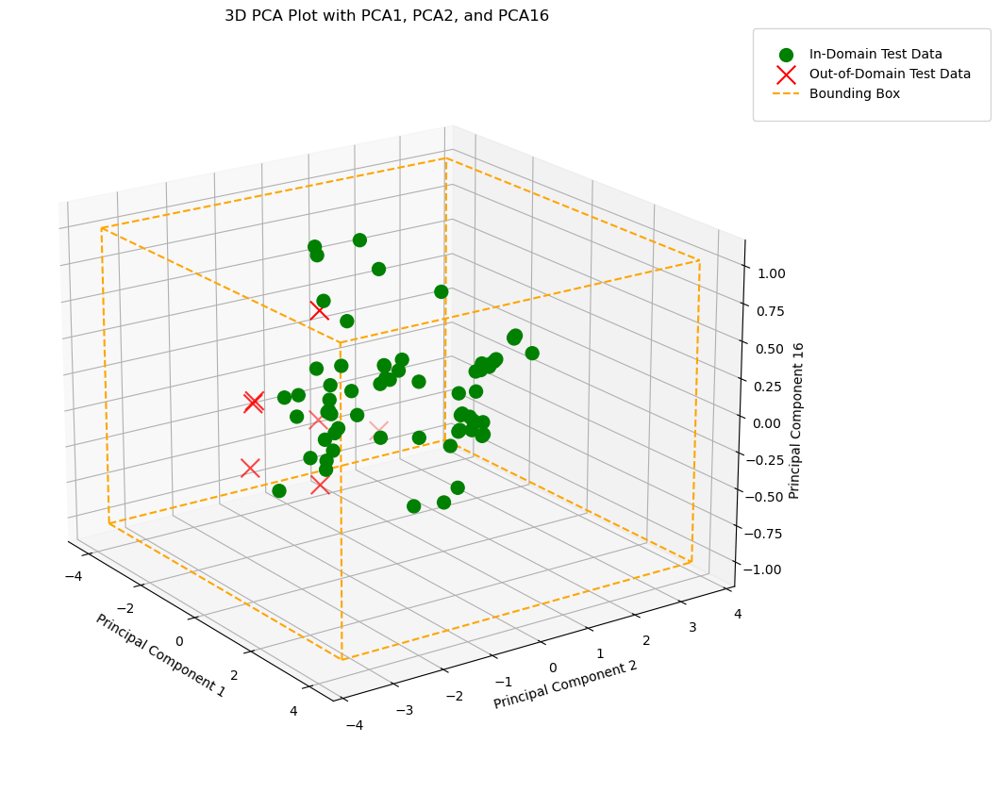

In [109]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.lines import Line2D
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt

# Perform PCA on the training data to retain 90% of the variance
pca_cmax = PCA(n_components=0.90)
X_train_pca_cmax = pca_cmax.fit_transform(X_train_cmax)
X_test_pca_cmax = pca_cmax.transform(X_test_cmax)

# Determine the number of components (n) that explain 90% of the variance
n_components = pca_cmax.n_components_
print(f'Number of components explaining 90% of variance: {n_components}')

# Calculate the mean and standard deviation of the PCA-transformed training data
mean_pca_cmax = np.mean(X_train_pca_cmax, axis=0)
std_pca_cmax = np.std(X_train_pca_cmax, axis=0)

# Define the bounds as mean ± 3 standard deviations (or another appropriate multiple)
lower_bounds_cmax = mean_pca_cmax - 3 * std_pca_cmax
upper_bounds_cmax = mean_pca_cmax + 3 * std_pca_cmax

# Check if test data points fall within the defined bounds
within_domain_cmax = np.all(
    (X_test_pca_cmax >= lower_bounds_cmax) & (X_test_pca_cmax <= upper_bounds_cmax),
    axis=1
)

# Identify outliers based on the PCA bounding box
outliers_cmax = X_test_cmax[~within_domain_cmax]
num_outliers = outliers_cmax.shape[0]
print(f'Number of outliers: {num_outliers}')

# Print outliers' values in the original feature space
print("Outliers' feature values:")
print(outliers_cmax)

# 2D plot for PCA1 and PCA2
plt.figure(figsize=(10, 8))

# Plot in-domain test data as green markers
plt.scatter(X_test_pca_cmax[within_domain_cmax, 0], X_test_pca_cmax[within_domain_cmax, 1], 
            color='green', alpha=1.0, s=100, marker='o', label='In-Domain Test Data')

# Plot out-of-domain test data as solid red 'x' markers
plt.scatter(X_test_pca_cmax[~within_domain_cmax, 0], X_test_pca_cmax[~within_domain_cmax, 1], 
            color='red', s=100, marker='x', label='Out-of-Domain Test Data')

# Draw bounding box in 2D (only the sides for PCA1 and PCA2)
plt.plot([lower_bounds_cmax[0], upper_bounds_cmax[0]], [lower_bounds_cmax[1], lower_bounds_cmax[1]], 'orange', linestyle="--")
plt.plot([lower_bounds_cmax[0], upper_bounds_cmax[0]], [upper_bounds_cmax[1], upper_bounds_cmax[1]], 'orange', linestyle="--")
plt.plot([lower_bounds_cmax[0], lower_bounds_cmax[0]], [lower_bounds_cmax[1], upper_bounds_cmax[1]], 'orange', linestyle="--")
plt.plot([upper_bounds_cmax[0], upper_bounds_cmax[0]], [lower_bounds_cmax[1], upper_bounds_cmax[1]], 'orange', linestyle="--")

# Custom legend entry for the bounding box lines
legend_lines = [Line2D([0], [0], color='orange', linestyle='--', lw=2, label='Bounding Box')]

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('2D PCA Plot with PCA1 and PCA2')
plt.legend(handles=plt.gca().get_legend_handles_labels()[0] + legend_lines, loc='upper right')
plt.show()

# 3D plots for PCA1, PCA2, and varying the third component
for i in range(2, n_components):
    fig = plt.figure(figsize=(14, 10))  # Increase figure size for more space
    ax = fig.add_subplot(111, projection='3d')
    
    # Plot in-domain test data as green markers
    ax.scatter(X_test_pca_cmax[within_domain_cmax, 0], X_test_pca_cmax[within_domain_cmax, 1], 
               X_test_pca_cmax[within_domain_cmax, i], color='green', alpha=1.0, s=100, marker='o', label='In-Domain Test Data', zorder=1)
    
    # Plot out-of-domain test data as solid red 'x' markers with increased size and zorder
    ax.scatter(X_test_pca_cmax[~within_domain_cmax, 0], X_test_pca_cmax[~within_domain_cmax, 1], 
               X_test_pca_cmax[~within_domain_cmax, i], color='red', s=200, marker='x', label='Out-of-Domain Test Data', zorder=2)
    
    # Plot the bounding box (in-domain region)
    corners = np.array([
        [lower_bounds_cmax[0], lower_bounds_cmax[1], lower_bounds_cmax[i]],
        [lower_bounds_cmax[0], lower_bounds_cmax[1], upper_bounds_cmax[i]],
        [lower_bounds_cmax[0], upper_bounds_cmax[1], lower_bounds_cmax[i]],
        [lower_bounds_cmax[0], upper_bounds_cmax[1], upper_bounds_cmax[i]],
        [upper_bounds_cmax[0], lower_bounds_cmax[1], lower_bounds_cmax[i]],
        [upper_bounds_cmax[0], lower_bounds_cmax[1], upper_bounds_cmax[i]],
        [upper_bounds_cmax[0], upper_bounds_cmax[1], lower_bounds_cmax[i]],
        [upper_bounds_cmax[0], upper_bounds_cmax[1], upper_bounds_cmax[i]],
    ])

    # Define pairs of corners that need to be connected to form the bounding box
    edges = [
        (0, 1), (0, 2), (0, 4),
        (1, 3), (1, 5),
        (2, 3), (2, 6),
        (3, 7),
        (4, 5), (4, 6),
        (5, 7),
        (6, 7),
    ]

    # Plot the edges of the bounding box
    for edge in edges:
        ax.plot3D(*corners[list(edge)].T, color="orange", linestyle="--", label='Bounding Box' if edge == edges[0] else "")
    
    # Labels and title
    ax.set_xlabel('Principal Component 1')
    ax.set_ylabel('Principal Component 2')
    ax.set_zlabel(f'Principal Component {i+1}')
    ax.set_title(f'3D PCA Plot with PCA1, PCA2, and PCA{i+1}')
    
    # Ensure the legend is fully visible
    ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1), borderaxespad=0., borderpad=1.5)
    
    # Adjust the plot layout to prevent cutting off parts of the plot
    plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)
    
    # Adjust the view angle for better visibility
    ax.view_init(elev=20., azim=-35)
    
    plt.show()


### Mahalanobis distance

In [110]:
# mahalanobis_distances

In [111]:
# threshold_ellips

In [112]:
# max(mahalanobis_distances_train)

In [113]:
# threshold_chi2

In [114]:
# np.sqrt(chi2.ppf(0.95, 3))

Number of outliers: 9


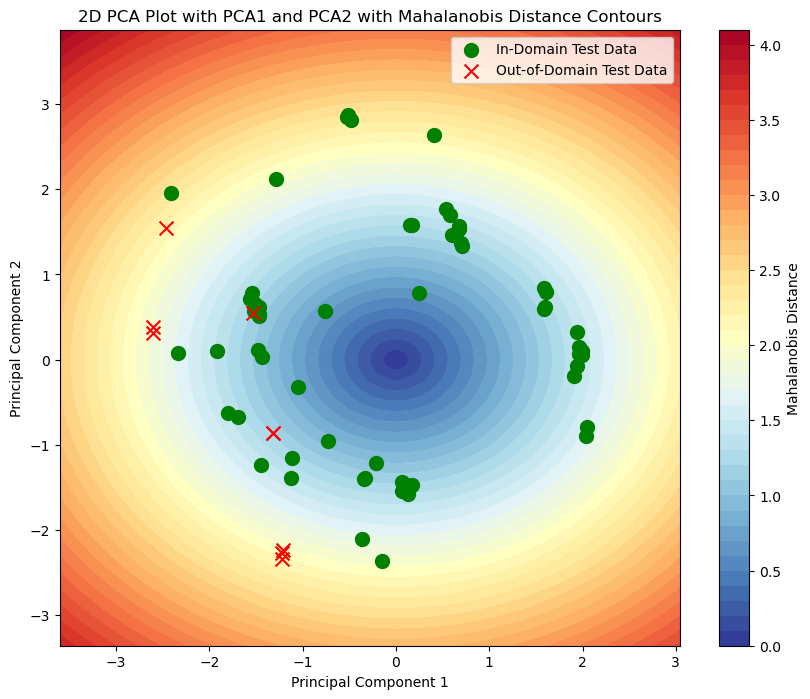

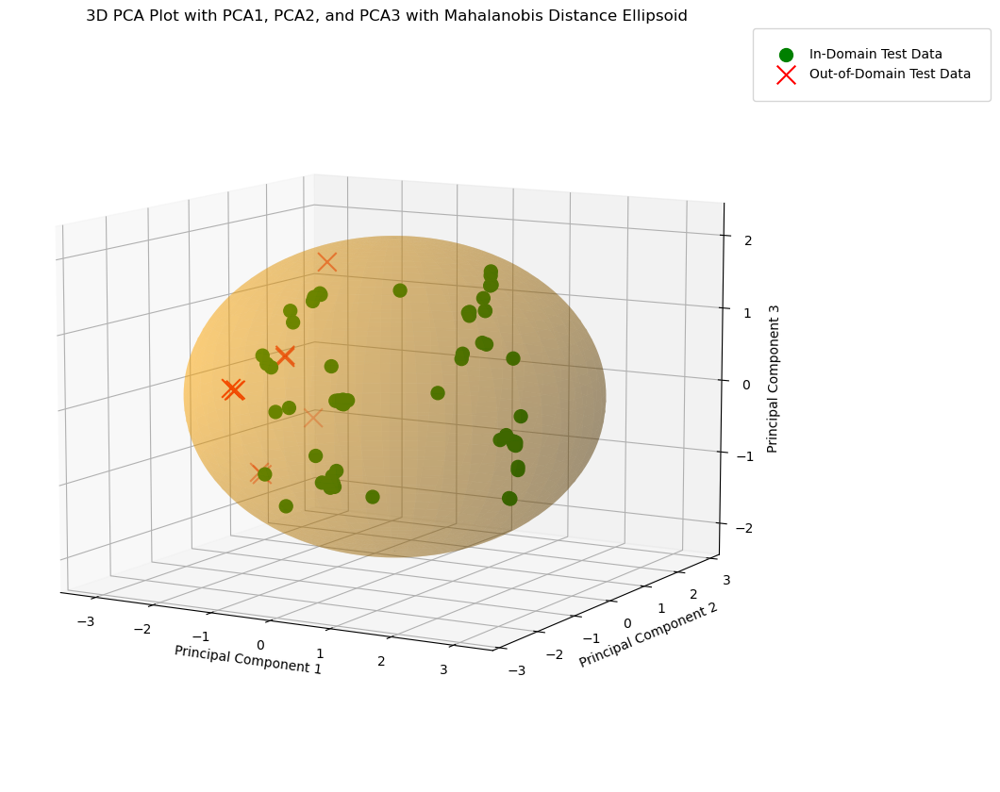

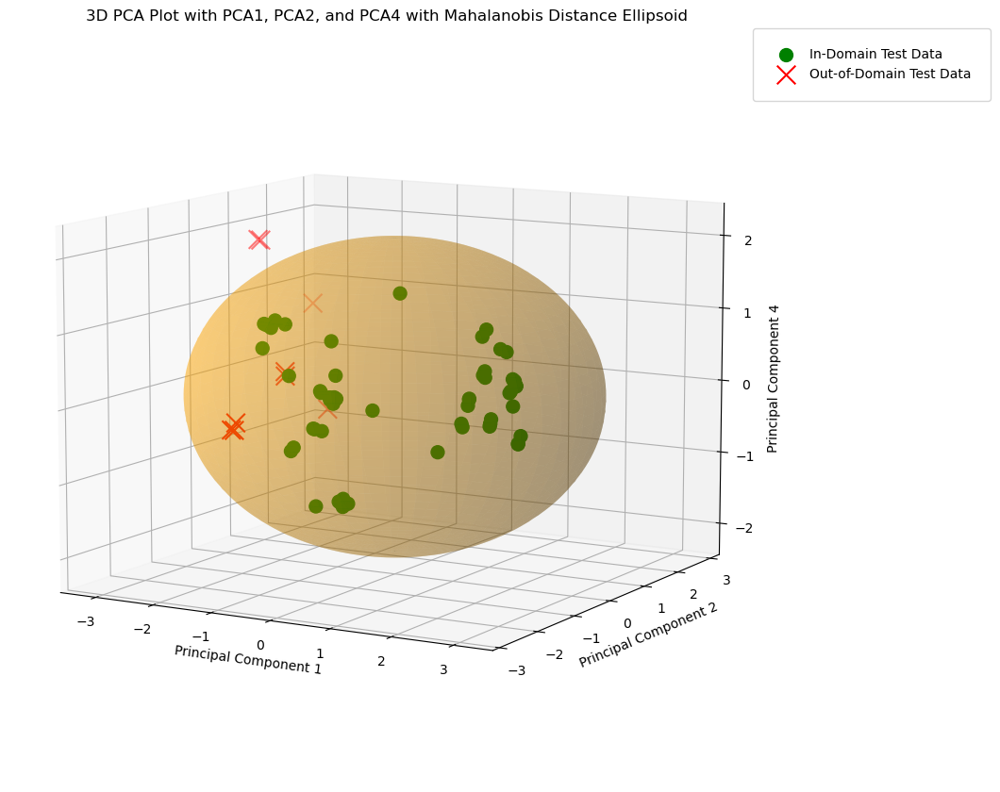

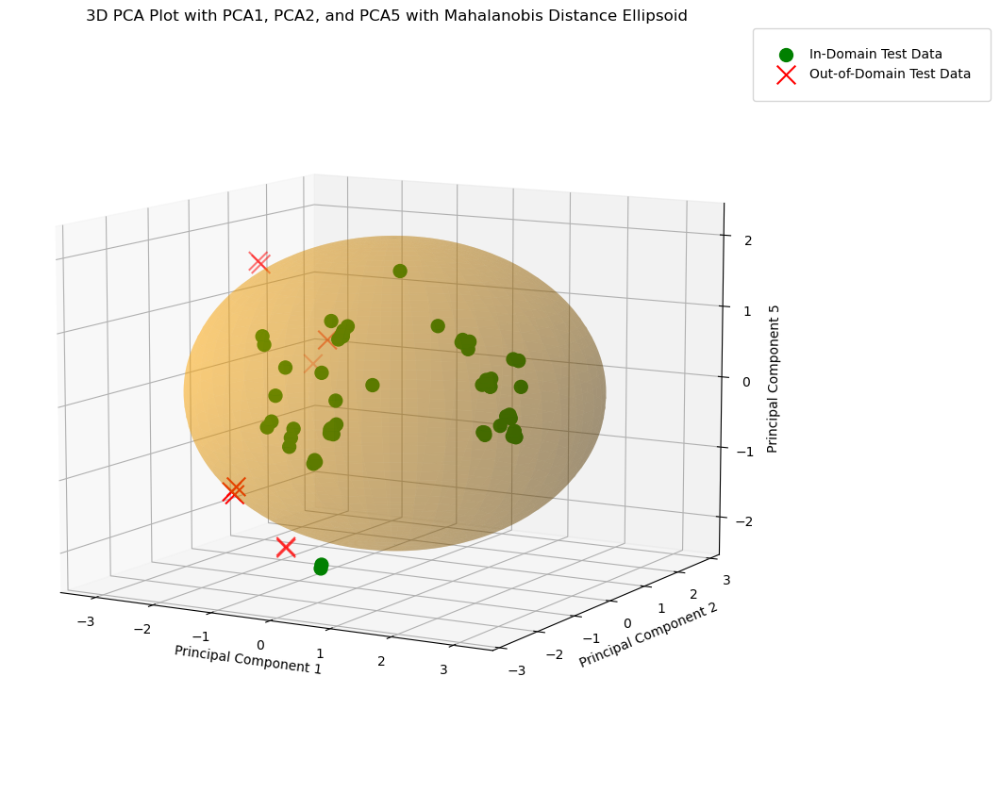

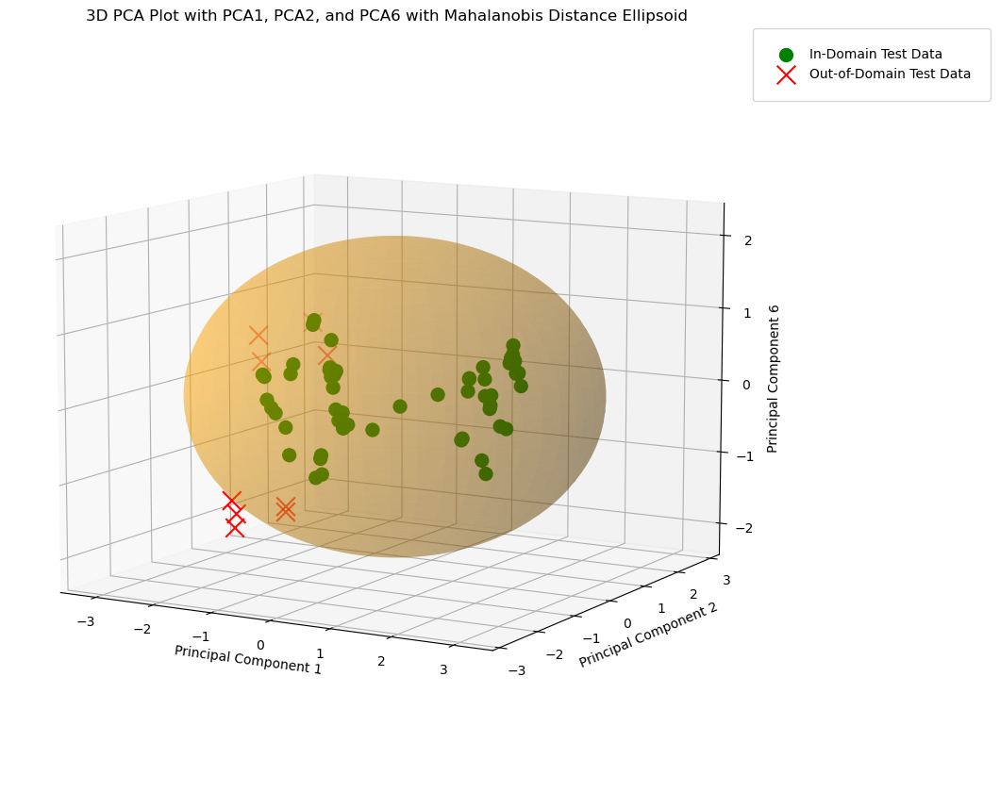

...

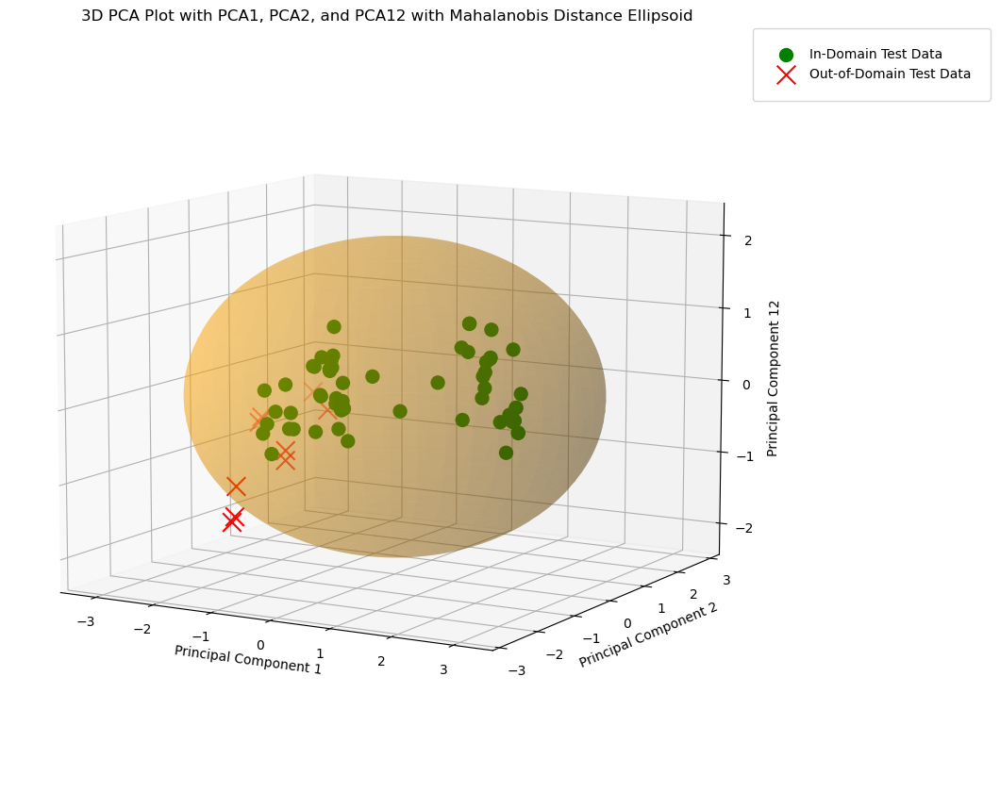

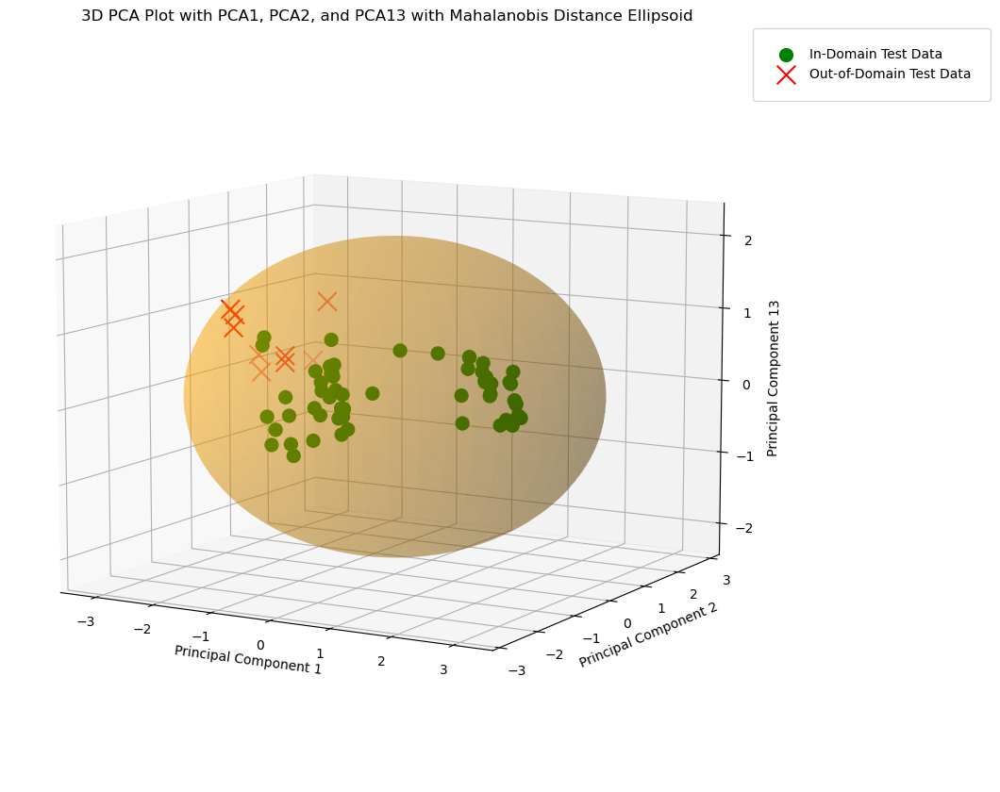

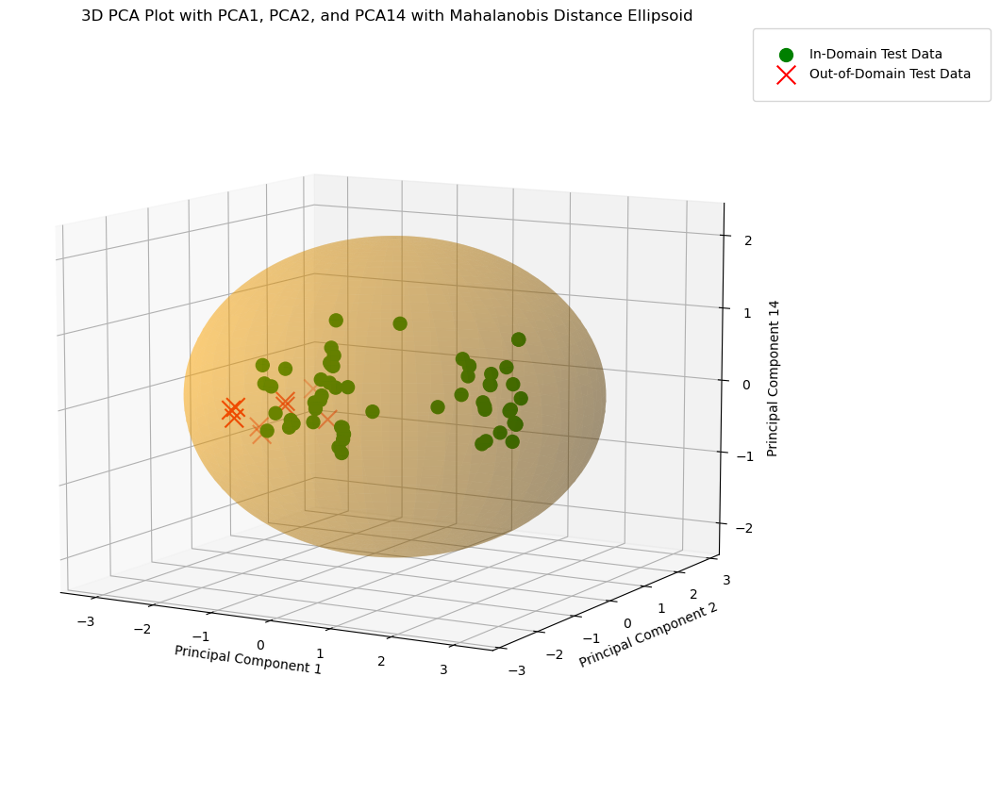

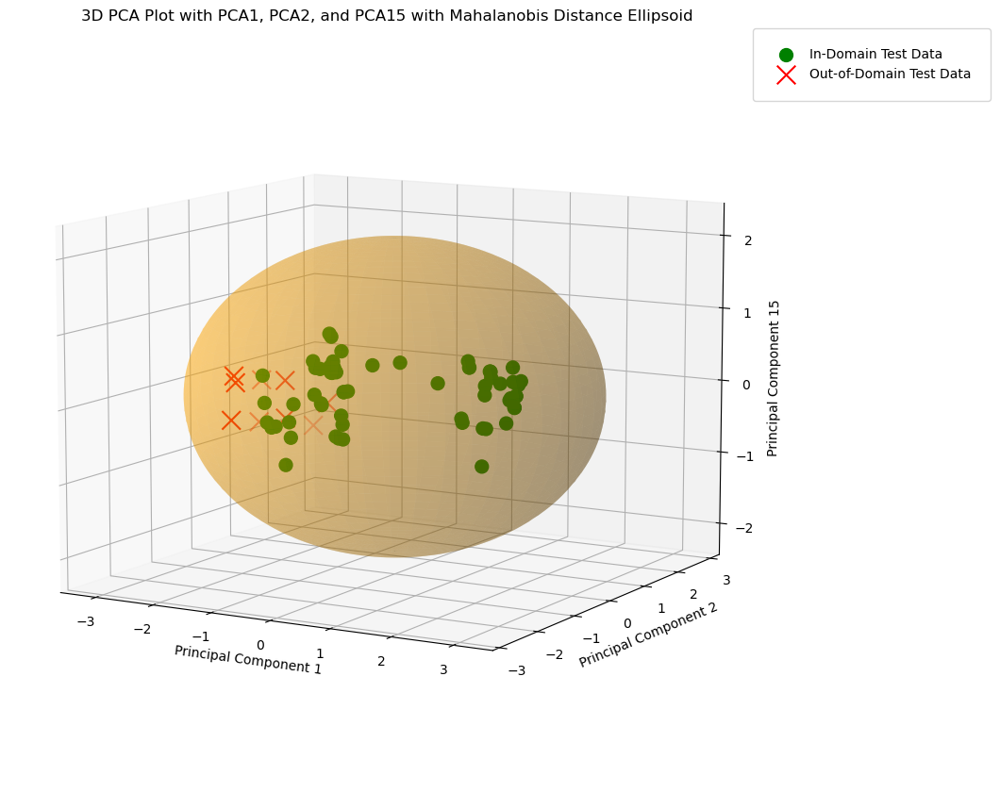

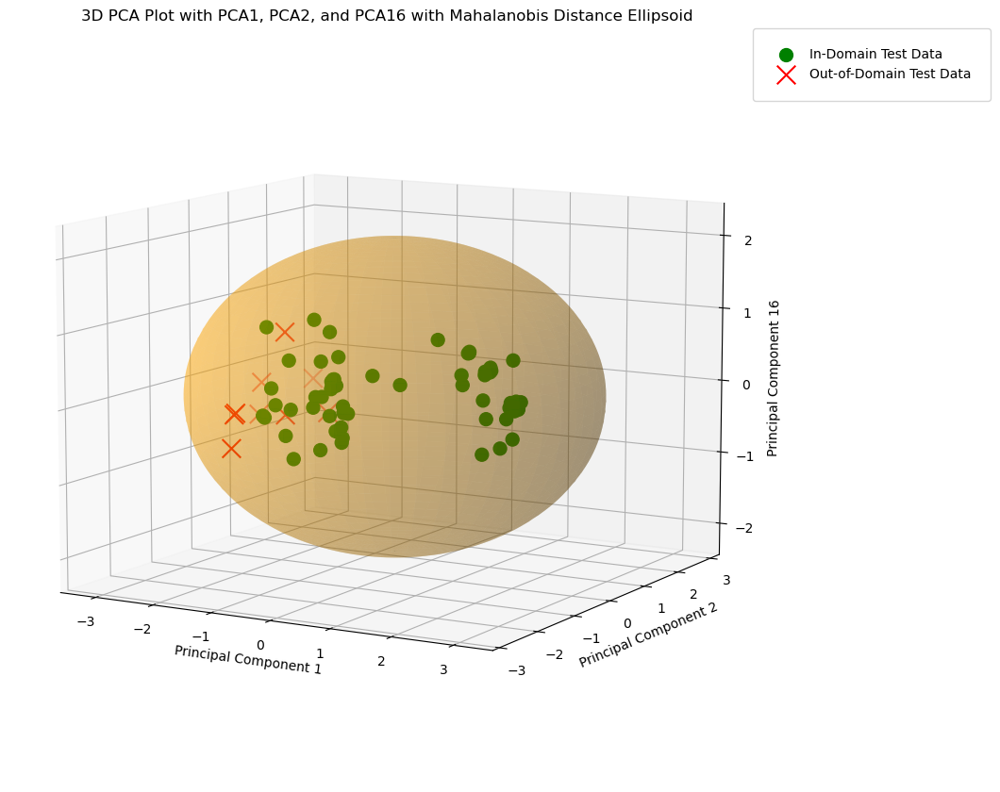

In [115]:
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
from sklearn.covariance import EmpiricalCovariance
from scipy.spatial.distance import mahalanobis
from scipy.stats import chi2
from scipy.linalg import eigh
from matplotlib.patches import Patch

def plot_ellipsoid(ax, mean, cov_matrix, threshold, color='orange', alpha=0.3):
    # Eigenvalue decomposition
    eigenvalues, eigenvectors = eigh(cov_matrix)
    
    # Sort eigenvalues and eigenvectors by descending eigenvalue
    order = eigenvalues.argsort()[::-1]
    eigenvalues = eigenvalues[order]
    eigenvectors = eigenvectors[:, order]
    
    # Create a grid of points representing the ellipsoid
    u = np.linspace(0, 2 * np.pi, 100)
    v = np.linspace(0, np.pi, 100)
    
    # The radii of the ellipsoid
    radii = np.sqrt(threshold) * np.sqrt(eigenvalues)
    
    # Cartesian coordinates in the ellipsoid's local coordinate system
    x = radii[0] * np.outer(np.cos(u), np.sin(v))
    y = radii[1] * np.outer(np.sin(u), np.sin(v))
    z = radii[2] * np.outer(np.ones(np.size(u)), np.cos(v))
    
    # Rotate the ellipsoid to align with the principal axes
    for i in range(len(x)):
        for j in range(len(x)):
            [x[i, j], y[i, j], z[i, j]] = np.dot([x[i, j], y[i, j], z[i, j]], eigenvectors.T) + mean
    
    # Plot the ellipsoid
    ax.plot_surface(x, y, z, color=color, alpha=alpha)

# Perform PCA on the training data to retain 90% of the variance
pca_cmax = PCA(n_components=0.90)
X_train_pca_cmax = pca_cmax.fit_transform(X_train_cmax)
X_test_pca_cmax = pca_cmax.transform(X_test_cmax)

# Calculate the mean and covariance matrix of the training data in PCA space
mean_pca_cmax = np.mean(X_train_pca_cmax, axis=0)
cov_estimator = EmpiricalCovariance().fit(X_train_pca_cmax)
cov_inv_pca_cmax = np.linalg.inv(cov_estimator.covariance_)

# Calculate Mahalanobis distance for the test data
mahalanobis_distances = np.array([
    mahalanobis(x, mean_pca_cmax, cov_inv_pca_cmax) for x in X_test_pca_cmax
])


# Set a threshold for the Mahalanobis distance (e.g., 95th percentile)
threshold_perc = np.percentile(mahalanobis_distances, 90)

# Set a threshold for the Mahalanobis distance based on the Chi-squared distribution for 95% confidence
df = X_train_pca_cmax.shape[1]  # degrees of freedom = number of retained components
threshold_chi2 = np.sqrt(chi2.ppf(0.95, df))

# Set a threshold based on mahalanobis train distance
mahalanobis_distances_train = np.array([
    mahalanobis(x, mean_pca_cmax, cov_inv_pca_cmax) for x in X_train_pca_cmax
])
threshold_mahalanobis = max(mahalanobis_distances_train)

# Set final threshold
threshold = threshold_chi2
threshold_ellips = threshold_chi2 # np.sqrt(chi2.ppf(0.95, 3))
# threshold = threshold_mahalanobis
# threshold_ellips = threshold_mahalanobis

# Identify outliers based on Mahalanobis distance
within_domain_cmax = mahalanobis_distances <= threshold

# Extract the outliers' characteristics from the original test set
outliers_mahalanobis_cmax = X_test_cmax[~within_domain_cmax]
num_outliers = outliers_mahalanobis_cmax.shape[0]

# Print the number of outliers and their characteristics
print(f'Number of outliers: {num_outliers}')
# print("Outliers' feature values:")
# print(outliers_cmax)

# 2D plot for PCA1 and PCA2 with Mahalanobis distance contours
plt.figure(figsize=(10, 8))

# Generate a grid of points in the PCA space for contour plotting
x_min, x_max = X_test_pca_cmax[:, 0].min() - 1, X_test_pca_cmax[:, 0].max() + 1
y_min, y_max = X_test_pca_cmax[:, 1].min() - 1, X_test_pca_cmax[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
grid_points = np.c_[xx.ravel(), yy.ravel()]
grid_distances = np.array([
    mahalanobis(x, mean_pca_cmax[:2], cov_inv_pca_cmax[:2, :2]) for x in grid_points
])
grid_distances = grid_distances.reshape(xx.shape)

# Plot the Mahalanobis distance contours
contour = plt.contourf(xx, yy, grid_distances, levels=50, cmap='RdYlBu_r')
plt.colorbar(contour, label='Mahalanobis Distance')

# Plot in-domain test data as green markers
plt.scatter(X_test_pca_cmax[within_domain_cmax, 0], X_test_pca_cmax[within_domain_cmax, 1], 
            color='green', alpha=1.0, s=100, marker='o', label='In-Domain Test Data')

# Plot out-of-domain test data as solid red 'x' markers
plt.scatter(X_test_pca_cmax[~within_domain_cmax, 0], X_test_pca_cmax[~within_domain_cmax, 1], 
            color='red', s=100, marker='x', label='Out-of-Domain Test Data')

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('2D PCA Plot with PCA1 and PCA2 with Mahalanobis Distance Contours')
plt.legend(loc='upper right')
plt.show()

# 3D plots for PCA1, PCA2, and varying the third component with Mahalanobis ellipsoids
for i in range(2, pca_cmax.n_components_):
    fig = plt.figure(figsize=(14, 10))
    ax = fig.add_subplot(111, projection='3d')

    # Plot in-domain test data as green markers
    in_domain_plot = ax.scatter(X_test_pca_cmax[within_domain_cmax, 0], X_test_pca_cmax[within_domain_cmax, 1], 
                                X_test_pca_cmax[within_domain_cmax, i], color='green', alpha=1.0, s=100, marker='o', label='In-Domain Test Data')
    
    # Plot out-of-domain test data as solid red 'x' markers
    out_domain_plot = ax.scatter(X_test_pca_cmax[~within_domain_cmax, 0], X_test_pca_cmax[~within_domain_cmax, 1], 
                                 X_test_pca_cmax[~within_domain_cmax, i], color='red', s=200, marker='x', label='Out-of-Domain Test Data')

    # Plot the ellipsoid representing the Mahalanobis distance threshold
    plot_ellipsoid(ax, mean_pca_cmax[:3], cov_estimator.covariance_[:3, :3], threshold_ellips)

    # Create a custom legend entry for the ellipsoid
    ellipsoid_patch = Patch(color='orange', alpha=0.3, label='Mahalanobis Threshold Ellipsoid')

    # Combine all legend handles
    handles = [in_domain_plot, out_domain_plot, ellipsoid_patch]

    # Labels and title
    ax.set_xlabel('Principal Component 1')
    ax.set_ylabel('Principal Component 2')
    ax.set_zlabel(f'Principal Component {i+1}')
    ax.set_title(f'3D PCA Plot with PCA1, PCA2, and PCA{i+1} with Mahalanobis Distance Ellipsoid')
    
    # Ensure the legend is fully visible
    ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1), borderaxespad=0., borderpad=1.5)

    # Adjust the plot layout to prevent cutting off parts of the plot
    plt.subplots_adjust(left=0.1, right=0.8, top=0.9, bottom=0.1)

    # Adjust the view angle for better visibility
    ax.view_init(elev=10., azim=-60)

    plt.show()


#### Last modification

In [116]:
# threshold_mahalanobis

In [117]:
# threshold_chi2

In [118]:
# np.sqrt(chi2.ppf(0.95, 3))

In [119]:
# max(mahalanobis_distances)

Number of outliers: 9
Indices of outliers in X_test_cmax based on Mahalanobis distance: [ 0  1  4 23 30 44 50 59 65]


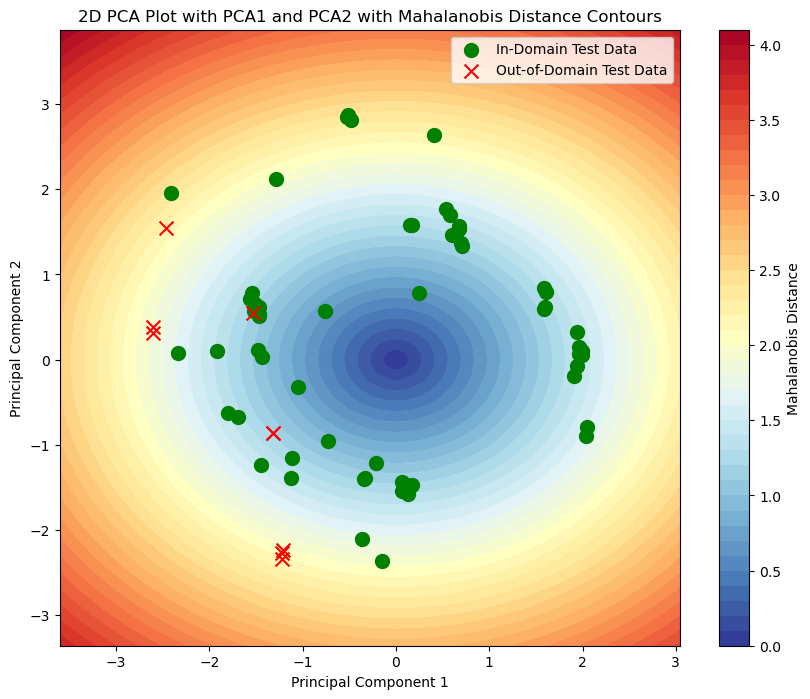

5.127984750841624


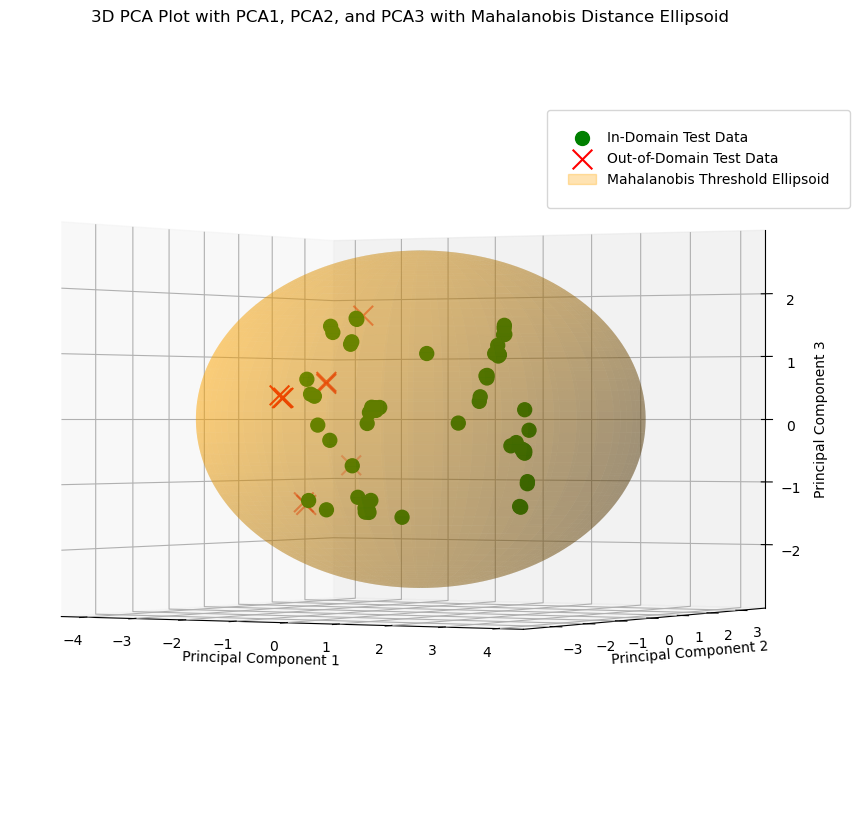

5.127984750841624


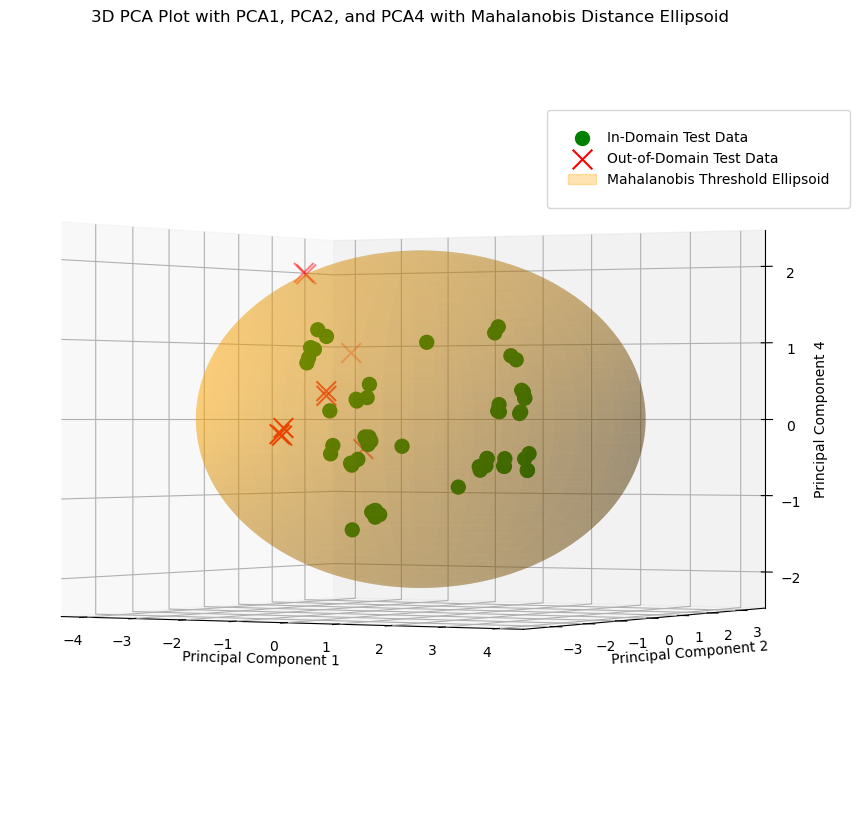

5.127984750841624


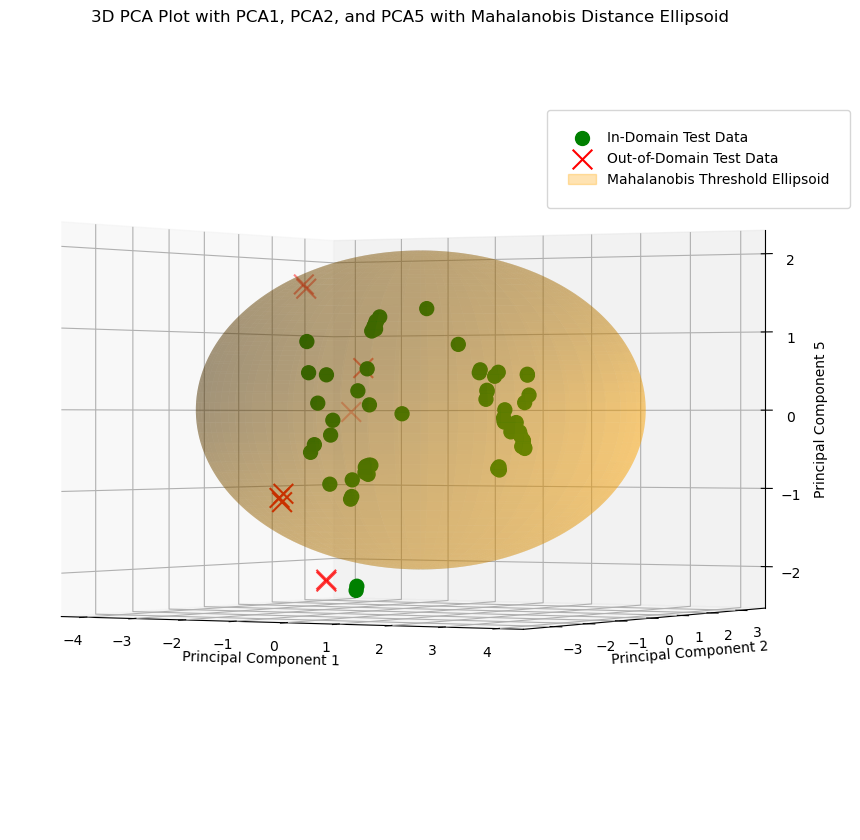

5.127984750841624


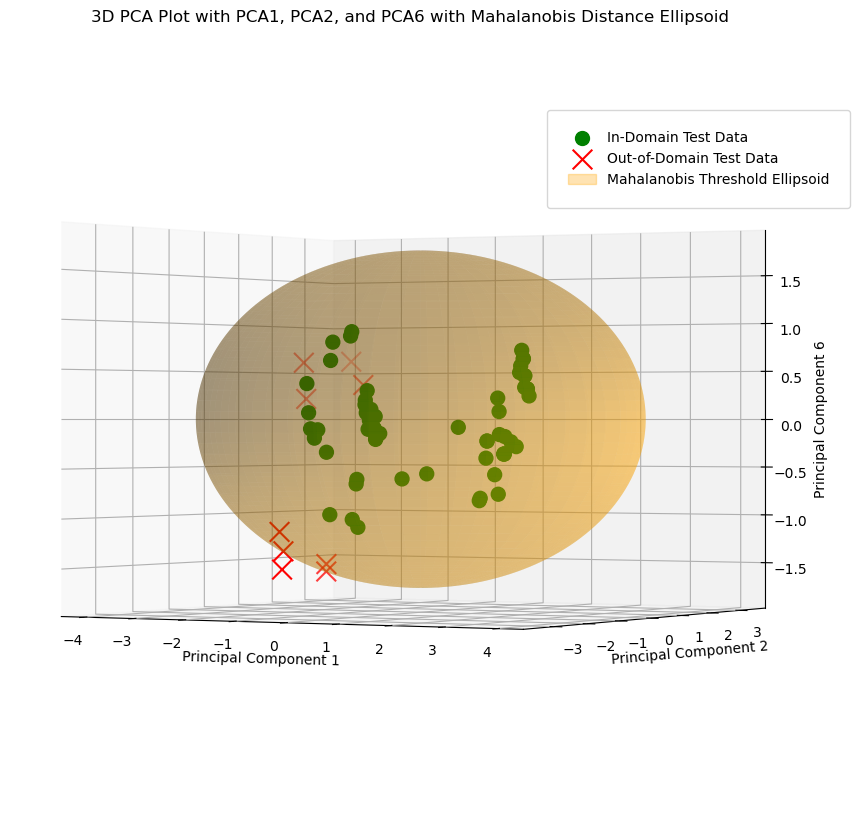

5.127984750841624


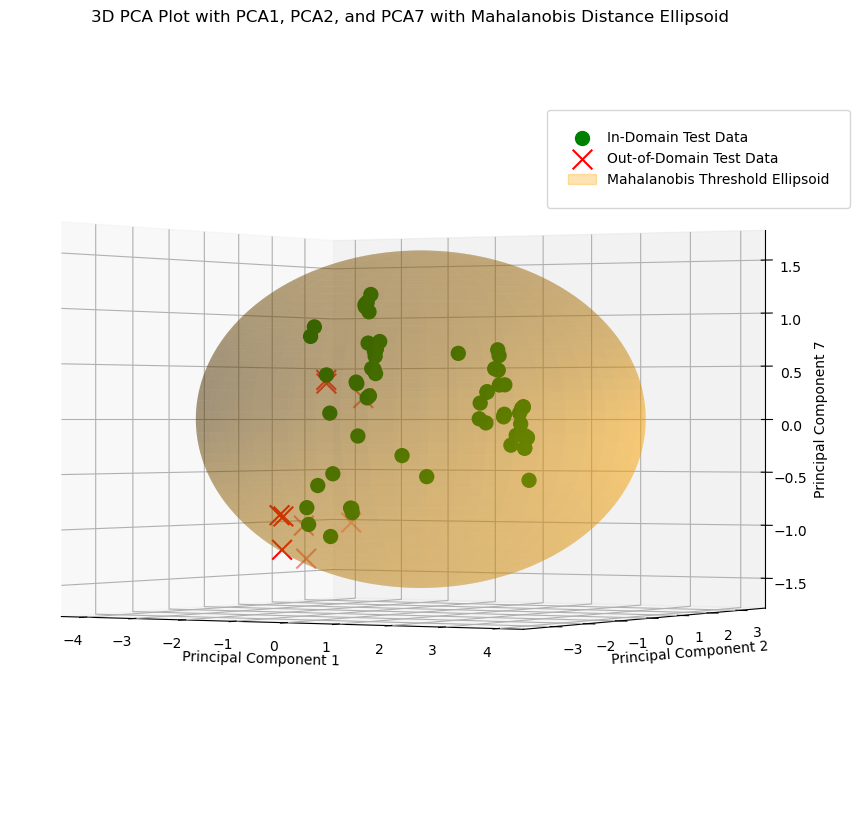

5.127984750841624


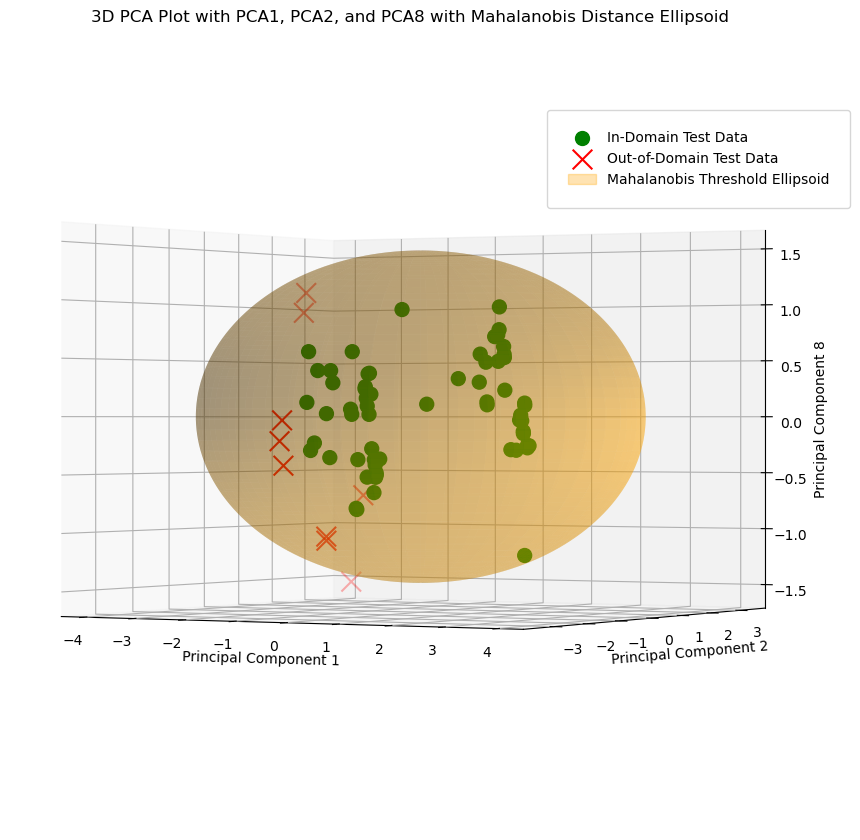

5.127984750841624


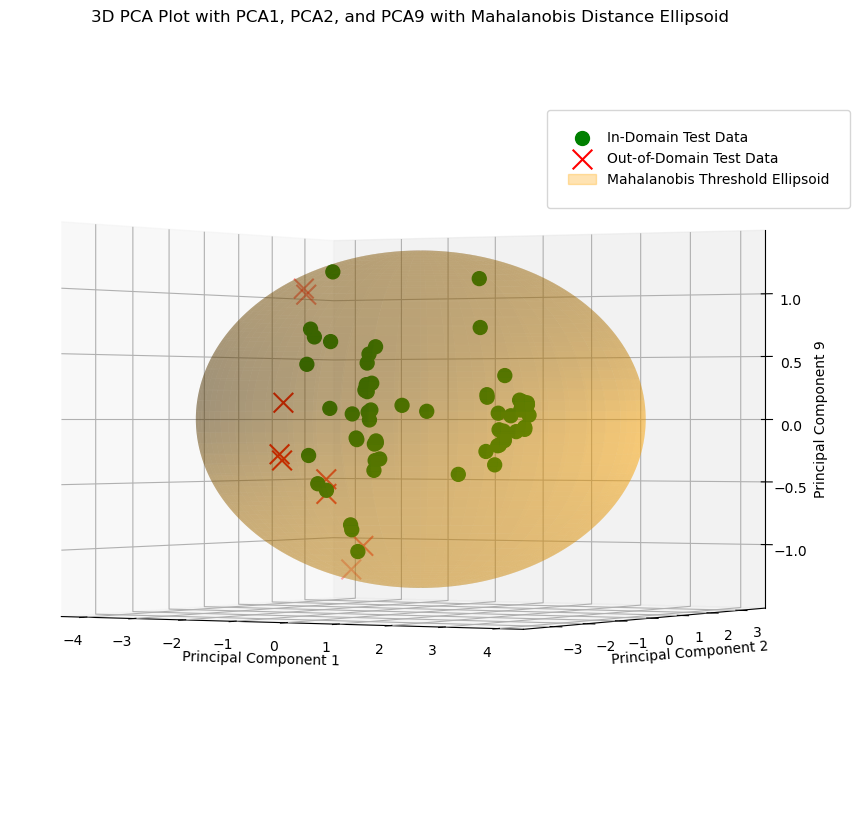

5.127984750841624


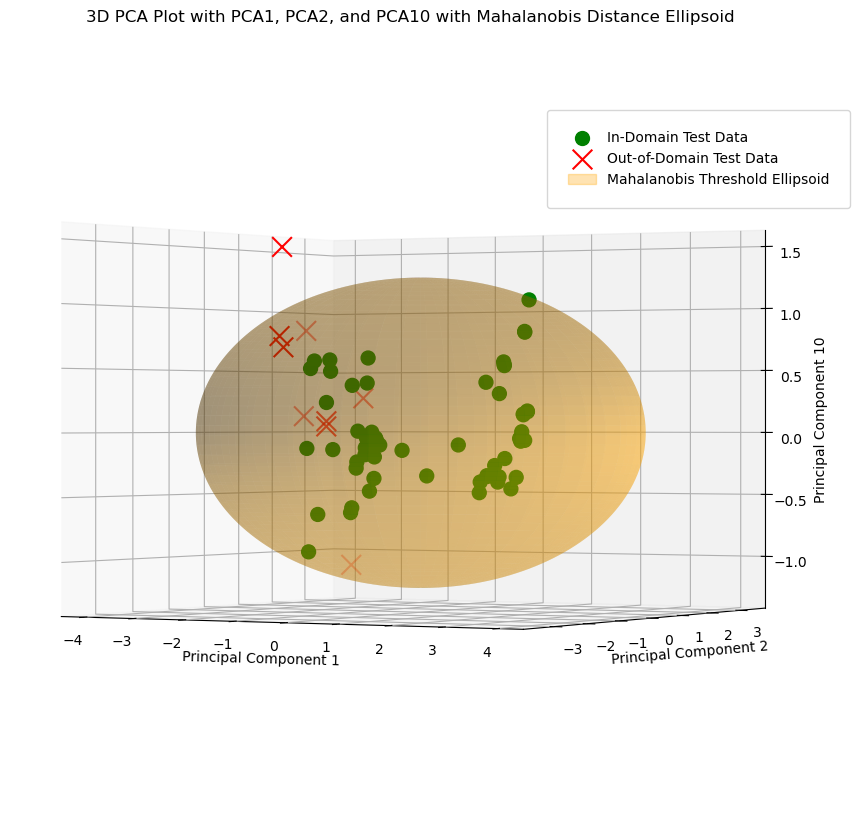

5.127984750841624


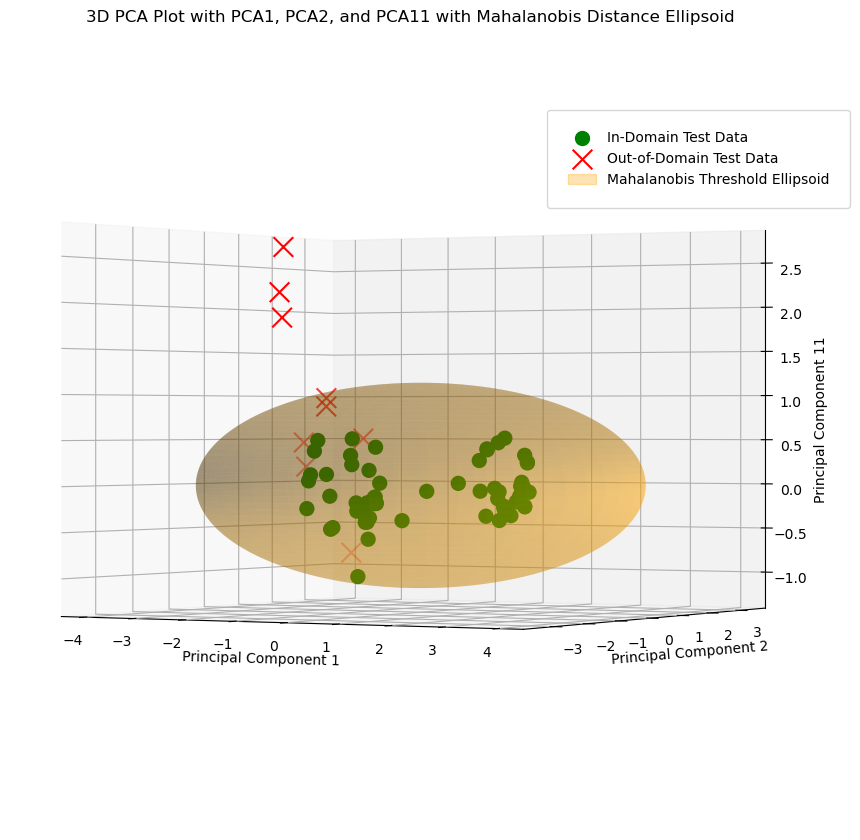

5.127984750841624


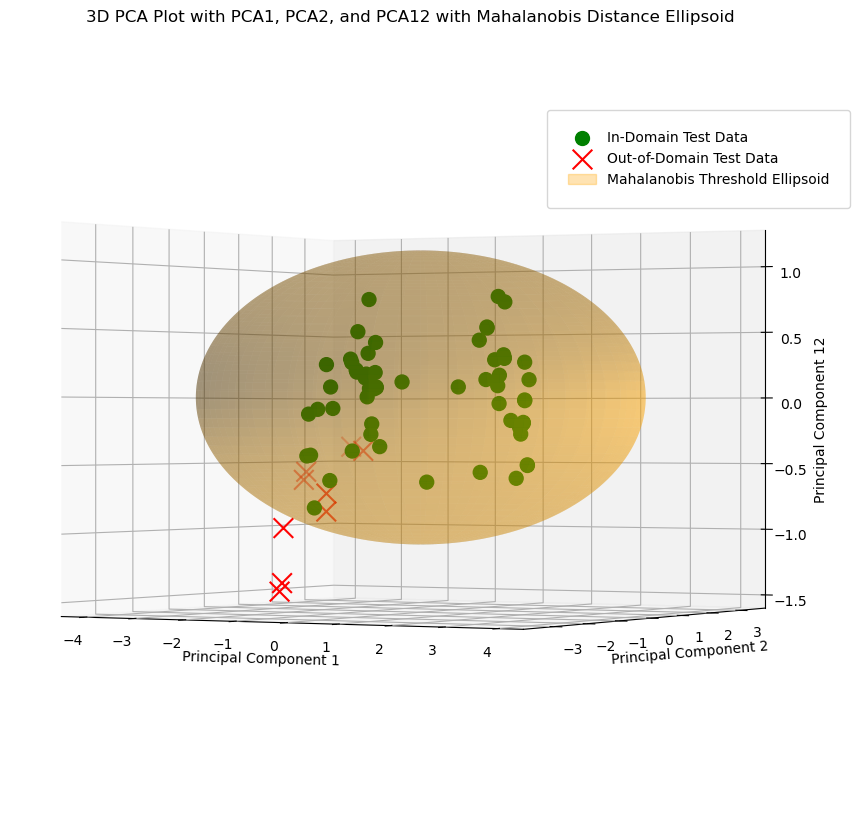

5.127984750841624


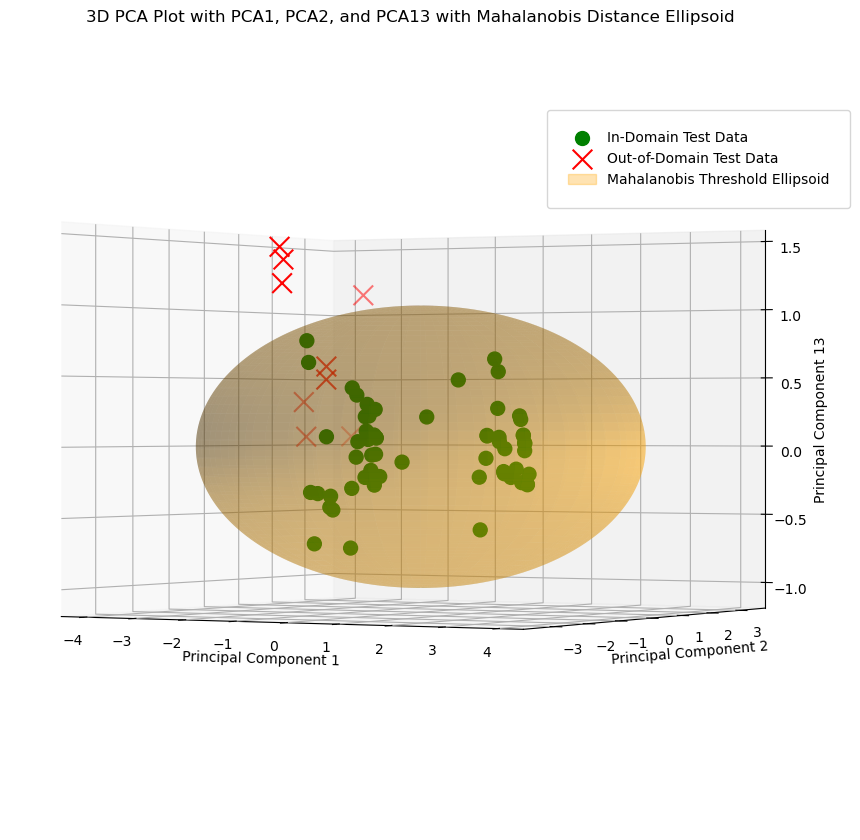

5.127984750841624


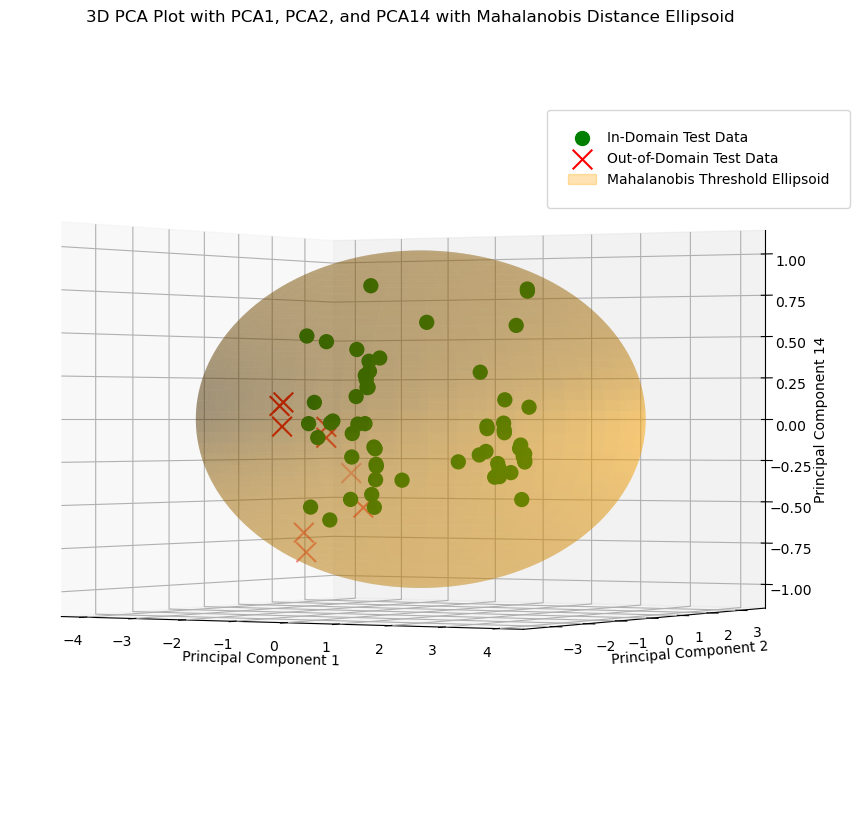

5.127984750841624


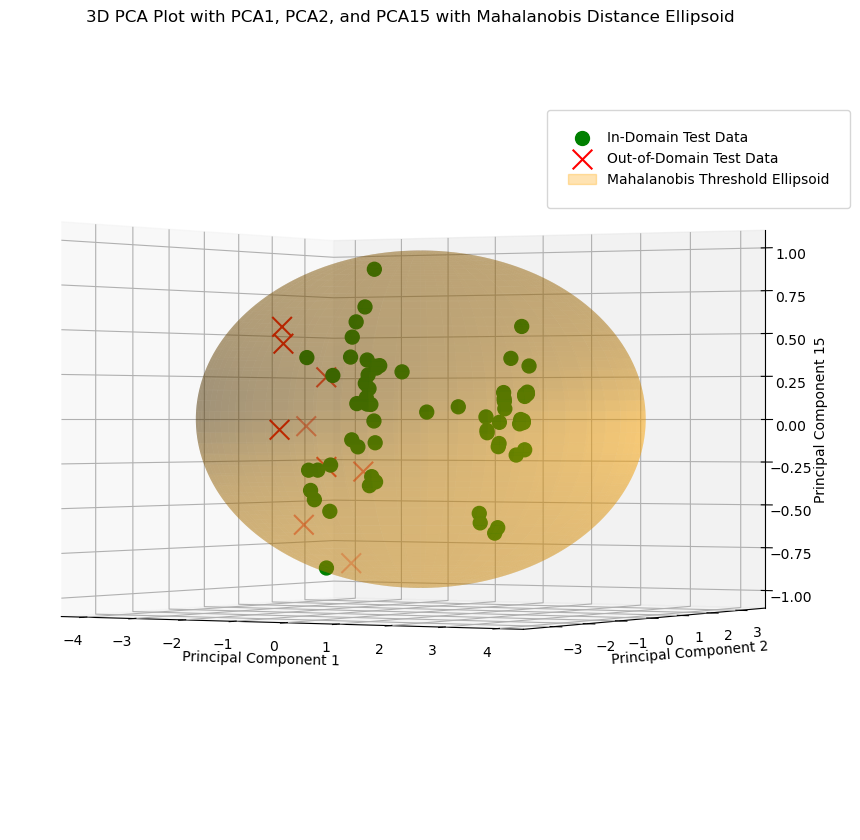

5.127984750841624


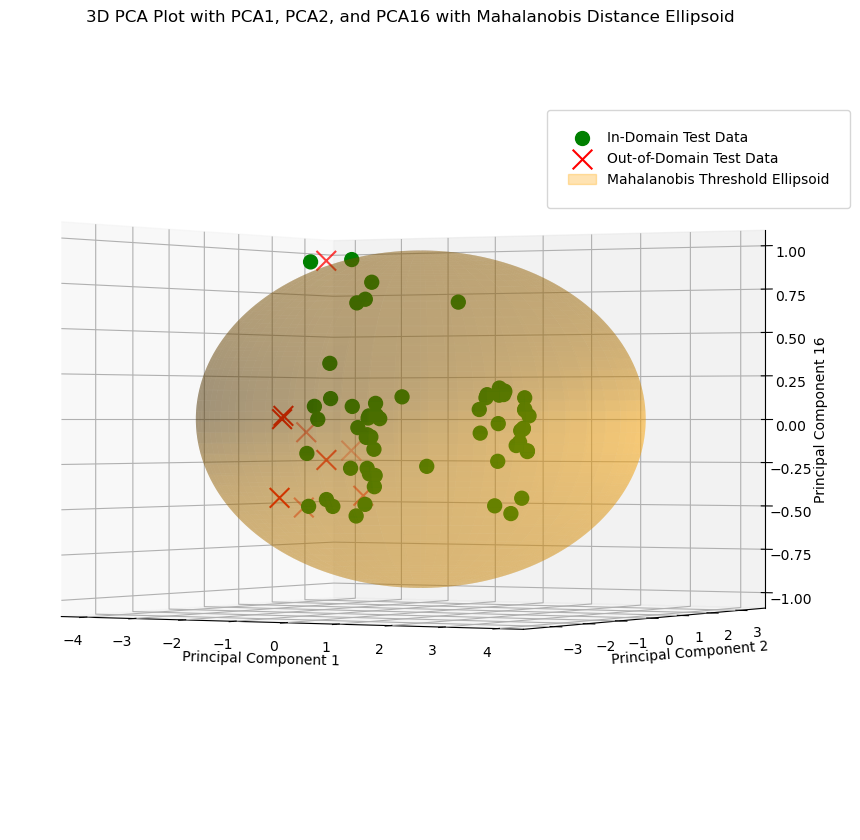

In [120]:
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
from sklearn.covariance import EmpiricalCovariance
from scipy.spatial.distance import mahalanobis
import numpy as np
import matplotlib.pyplot as plt
from scipy.linalg import eigh
from matplotlib.patches import Patch
from scipy.stats import chi2

def plot_ellipsoid(ax, mean, cov_matrix, chi2_val, color='orange', alpha=0.3):
    # Eigenvalue decomposition
    eigenvalues, eigenvectors = eigh(cov_matrix)
    
    # Sort eigenvalues and eigenvectors by descending eigenvalue
    order = eigenvalues.argsort()[::-1]
    eigenvalues = eigenvalues[order]
    eigenvectors = eigenvectors[:, order]
    
    # Create a grid of points representing the ellipsoid
    u = np.linspace(0, 2 * np.pi, 100)
    v = np.linspace(0, np.pi, 100)
    
    # The radii of the ellipsoid
    radii =  np.sqrt(eigenvalues*chi2_val)
    
    # Cartesian coordinates in the ellipsoid's local coordinate system
    x = radii[0] * np.outer(np.cos(u), np.sin(v))
    y = radii[1] * np.outer(np.sin(u), np.sin(v))
    z = radii[2] * np.outer(np.ones(np.size(u)), np.cos(v))
    
    # Rotate the ellipsoid to align with the principal axes
    for i in range(len(x)):
        for j in range(len(x)):
            [x[i, j], y[i, j], z[i, j]] = np.dot([x[i, j], y[i, j], z[i, j]], eigenvectors.T) + mean
    
    # Plot the ellipsoid
    ax.plot_surface(x, y, z, color=color, alpha=alpha)

# Perform PCA on the training data to retain 90% of the variance
pca_cmax = PCA(n_components=0.90)
X_train_pca_cmax = pca_cmax.fit_transform(X_train_cmax)
X_test_pca_cmax = pca_cmax.transform(X_test_cmax)

# Calculate the mean and covariance matrix of the training data in PCA space
mean_pca_cmax = np.mean(X_train_pca_cmax, axis=0)
cov_estimator = EmpiricalCovariance().fit(X_train_pca_cmax)
cov_inv_pca_cmax = np.linalg.inv(cov_estimator.covariance_)

# Calculate Mahalanobis distance for the test data
mahalanobis_distances = np.array([
    mahalanobis(x, mean_pca_cmax, cov_inv_pca_cmax) for x in X_test_pca_cmax
])

# Set a threshold for the Mahalanobis distance (e.g., 95th percentile)
threshold_perc = np.percentile(mahalanobis_distances, 90)

# Set a threshold for the Mahalanobis distance based on the Chi-squared distribution for 95% confidence
df = X_train_pca_cmax.shape[1]  # degrees of freedom = number of retained components
threshold_chi2 = np.sqrt(chi2.ppf(0.95, df))

# Set a threshold based on mahalanobis train distance
mahalanobis_distances_train = np.array([
    mahalanobis(x, mean_pca_cmax, cov_inv_pca_cmax) for x in X_train_pca_cmax
])
threshold_mahalanobis = max(mahalanobis_distances_train)

# Set final threshold
chi2_val = chi2.ppf(0.95, 3)
threshold = threshold_chi2

# Identify outliers based on Mahalanobis distance
within_domain_cmax = mahalanobis_distances <= threshold

# Extract the outliers' characteristics from the original test set
outliers_mahalanobis_cmax = X_test_cmax[~within_domain_cmax]
num_outliers = outliers_mahalanobis_cmax.shape[0]

# Print the number of outliers and their characteristics
print(f'Number of outliers: {num_outliers}')


# Find the indices of the outliers
outlier_indices = np.where(~within_domain_cmax)[0]

# Print the number of their indices

print(f'Indices of outliers in X_test_cmax based on Mahalanobis distance: {outlier_indices}')




# 2D plot for PCA1 and PCA2 with Mahalanobis distance contours
plt.figure(figsize=(10, 8))

# Generate a grid of points in the PCA space for contour plotting
x_min, x_max = X_test_pca_cmax[:, 0].min() - 1, X_test_pca_cmax[:, 0].max() + 1
y_min, y_max = X_test_pca_cmax[:, 1].min() - 1, X_test_pca_cmax[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
grid_points = np.c_[xx.ravel(), yy.ravel()]
grid_distances = np.array([
    mahalanobis(x, mean_pca_cmax[:2], cov_inv_pca_cmax[:2, :2]) for x in grid_points
])
grid_distances = grid_distances.reshape(xx.shape)

# Plot the Mahalanobis distance contours
contour = plt.contourf(xx, yy, grid_distances, levels=50, cmap='RdYlBu_r')
plt.colorbar(contour, label='Mahalanobis Distance')

# Plot in-domain test data as green markers
plt.scatter(X_test_pca_cmax[within_domain_cmax, 0], X_test_pca_cmax[within_domain_cmax, 1], 
            color='green', alpha=1.0, s=100, marker='o', label='In-Domain Test Data')

# Plot out-of-domain test data as solid red 'x' markers
plt.scatter(X_test_pca_cmax[~within_domain_cmax, 0], X_test_pca_cmax[~within_domain_cmax, 1], 
            color='red', s=100, marker='x', label='Out-of-Domain Test Data')

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('2D PCA Plot with PCA1 and PCA2 with Mahalanobis Distance Contours')
plt.legend(loc='upper right')
plt.show()

# 3D plots for PCA1, PCA2, and varying the third component with Mahalanobis ellipsoids
for i in range(2, pca_cmax.n_components_):
    # Calculate the covariance matrix for the selected principal components
    cov_submatrix = cov_estimator.covariance_[[0, 1, i], :][:, [0, 1, i]]
    
    # Calculate Mahalanobis distances for the selected components
    mahalanobis_distances_3d = np.array([
        mahalanobis(x[[0, 1, i]], mean_pca_cmax[[0, 1, i]], np.linalg.inv(cov_submatrix)) 
        for x in X_train_pca_cmax
    ])
    
    # Set the threshold to be the maximum Mahalanobis distance
    threshold_ellips = threshold_chi2     # max(mahalanobis_distances_3d), np.sqrt(chi2.ppf(0.95, 3))
    print(threshold_ellips)
    
    fig = plt.figure(figsize=(14, 10))
    ax = fig.add_subplot(111, projection='3d')

    # Plot in-domain test data as green markers
    in_domain_plot = ax.scatter(X_test_pca_cmax[within_domain_cmax, 0], 
                                X_test_pca_cmax[within_domain_cmax, 1], 
                                X_test_pca_cmax[within_domain_cmax, i], 
                                color='green', alpha=1.0, s=100, marker='o', label='In-Domain Test Data')
    
    # Plot out-of-domain test data as solid red 'x' markers
    out_domain_plot = ax.scatter(X_test_pca_cmax[~within_domain_cmax, 0], 
                                 X_test_pca_cmax[~within_domain_cmax, 1], 
                                 X_test_pca_cmax[~within_domain_cmax, i], 
                                 color='red', s=200, marker='x', label='Out-of-Domain Test Data')
    
    
    # Plot the ellipsoid representing the Mahalanobis distance threshold
    plot_ellipsoid(ax, mean_pca_cmax[[0, 1, i]], cov_submatrix, chi2_val)

    # Create a custom legend entry for the ellipsoid
    ellipsoid_patch = Patch(color='orange', alpha=0.3, label='Mahalanobis Threshold Ellipsoid')

    # Combine all legend handles
    handles = [in_domain_plot, out_domain_plot, ellipsoid_patch]

    # Labels and title
    ax.set_xlabel('Principal Component 1')
    ax.set_ylabel('Principal Component 2')
    ax.set_zlabel(f'Principal Component {i+1}')
    ax.set_title(f'3D PCA Plot with PCA1, PCA2, and PCA{i+1} with Mahalanobis Distance Ellipsoid')
    
    # Ensure the legend is fully visible
    ax.legend(handles=handles, loc='upper right', bbox_to_anchor=(1.05, 0.9), borderaxespad=0., borderpad=1.5)

    # Adjust the plot layout to prevent cutting off parts of the plot
    plt.subplots_adjust(left=0.1, right=0.8, top=0.9, bottom=0.1)

    # Adjust the view angle for better visibility
    ax.view_init(elev=0., azim=-60)

    plt.show()


#### Outliers predictions with Mahalanobis

In [121]:
# Get the predictions for the outliers in PCA space
y_mahalanobis_pred_cmax = best_rf_cmax.predict(outliers_mahalanobis_cmax)

# Get the corresponding actual values from y_test_cmax for the outliers
y_actual_cmax_outliers_mahal = y_test_cmax[~within_domain_cmax]

# Calculate the absolute error for each outlier
absolute_errors = np.abs(y_mahalanobis_pred_cmax - y_actual_cmax_outliers_mahal)

# Print the absolute errors
print("Absolute errors for the outliers:")
print(absolute_errors)

Absolute errors for the outliers:
302      7.811605
1748     1.541924
2173    16.730217
1491     1.383300
1122     5.562593
301      0.638045
1747     7.971505
304     17.674305
2175     3.306383
Name: Cmax, dtype: float64


In [122]:
# def mahalanobis_distance(X, mean, inv_cov_matrix):
#     """
#     Compute Mahalanobis distances for all points in X.
    
#     Parameters:
#     - X: 2-D array of shape (n_samples, n_features)
#     - mean: 1-D array of shape (n_features,)
#     - inv_cov_matrix: 2-D array of shape (n_features, n_features)
    
#     Returns:
#     - distances: 1-D array of Mahalanobis distances
#     """
#     X = np.array(X)  # Ensure X is a numpy array
#     mean = np.array(mean)  # Ensure mean is a numpy array
#     inv_cov_matrix = np.array(inv_cov_matrix)  # Ensure inv_cov_matrix is a numpy array
    
#     diff = X - mean
#     distances = np.sqrt(np.sum(np.dot(diff, inv_cov_matrix) * diff, axis=1))
#     return distances

In [123]:
# # Compute the mean and covariance matrix of the training data
# mean_cmax = np.mean(X_train_cmax, axis=0)
# cov_matrix_cmax = np.cov(X_train_cmax, rowvar=False)
# inv_cov_matrix_cmax = np.linalg.inv(cov_matrix_cmax)

# # Compute Mahalanobis distances for test data
# distances_cmax = mahalanobis_distance(X_test_cmax, mean_cmax, inv_cov_matrix_cmax)

# # Define a threshold for outliers
# threshold_cmax = np.percentile(distances_cmax, 95)  # Example: 95th percentile
# outliers_cmax = np.where(distances_cmax > threshold_cmax)[0]

# print("Outliers detected based on Mahalanobis distance:", outliers_cmax)

In [124]:
# # Identify outliers and their predictions
# outlier_predictions_cmax = y_test_pred_cmax[outliers_cmax]
# outlier_actuals_cmax = y_test_cmax.iloc[outliers_cmax]

# r2_outliers_cmax = r2_score(outlier_actuals_cmax, outlier_predictions_cmax)

# print("R^2 Score for Outliers:", r2_outliers_cmax)

In [125]:
# # Apply PCA to training data
# pca = PCA(n_components=2)
# X_train_cmax_2d = pca.fit_transform(X_train_cmax)  # Fit PCA and transform training data

# # Transform test data using the fitted PCA
# X_test_cmax_2d = pca.transform(X_test_cmax)  # Transform test data

# # Compute the mean and covariance matrix of the PCA-reduced training data
# mean_cmax_2d = np.mean(X_train_cmax_2d, axis=0)
# cov_matrix_cmax_2d = np.cov(X_train_cmax_2d, rowvar=False)
# inv_cov_matrix_cmax_2d = np.linalg.inv(cov_matrix_cmax_2d)

# # Compute Mahalanobis distances for test data in PCA space
# distances_cmax_2d = mahalanobis_distance(X_test_cmax_2d, mean_cmax_2d, inv_cov_matrix_cmax_2d)

# # Define a threshold for outliers
# threshold_cmax_2d = np.percentile(distances_cmax_2d, 90)  # Example: 95th percentile
# outliers_cmax_2d = distances_cmax_2d > threshold_cmax_2d

# # # Set a threshold for outliers
# # threshold = np.percentile(density_scores, 10)  # Example: 5th percentile
# # outliers_indices = np.where(density_scores < threshold)[0]

# # Create a grid for contour plot
# x_min, x_max = X_test_cmax_2d[:, 0].min() - 1, X_test_cmax_2d[:, 0].max() + 1
# y_min, y_max = X_test_cmax_2d[:, 1].min() - 1, X_test_cmax_2d[:, 1].max() + 1
# xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))

# # Flatten the grid for distance computation
# grid_points = np.c_[xx.ravel(), yy.ravel()]

# # Compute Mahalanobis distances for the grid points in PCA space
# distances_grid = mahalanobis_distance(grid_points, mean_cmax_2d, inv_cov_matrix_cmax_2d)

# # Reshape distances back to the grid shape
# distances_grid = distances_grid.reshape(xx.shape)

# # Plotting the contour plot
# plt.figure(figsize=(12, 10))

# # Contour plot for Mahalanobis distances in PCA space with shades of red
# contour = plt.contourf(xx, yy, distances_grid, cmap='Reds', levels=20)
# plt.colorbar(contour, label='Mahalanobis Distance')

# # Scatter plot of PCA-reduced training data in blue
# # plt.scatter(X_train_cmax_2d[:, 0], X_train_cmax_2d[:, 1], color='blue', edgecolors='k', s=50, label='Training Data')

# # Scatter plot of PCA-reduced test data in green
# plt.scatter(X_test_cmax_2d[:, 0], X_test_cmax_2d[:, 1], color='green', edgecolors='k', s=50, label='Test Data')

# # Highlight outliers in yellow
# plt.scatter(X_test_cmax_2d[outliers_cmax_2d, 0], X_test_cmax_2d[outliers_cmax_2d, 1], 
#             color='yellow', edgecolors='k', s=100, label='Outliers')

# plt.title('Contour Plot of Mahalanobis Distances in PCA Space')
# plt.xlabel('Feature 1 (PCA)')
# plt.ylabel('Feature 2 (PCA)')
# plt.legend()
# plt.grid(True)
# plt.show()
# malh_outliers = np.where(outliers_cmax_2d)[0]
# print("Outliers detected at indices:", malh_outliers)

### Leverage points detection on test data

In [126]:
# Calculate pairwise distances
distances_cmax = pairwise_distances(X_test_cmax, X_train_cmax)
mean_distances_cmax = np.mean(distances_cmax, axis=1)

# Define a threshold for high leverage
threshold_leverage_cmax = np.percentile(mean_distances_cmax, 95)  # Example: 95th percentile
high_leverage_points_cmax = np.where(mean_distances_cmax > threshold_leverage_cmax)[0]
leverage_outliers = high_leverage_points_cmax
print("High leverage points detected:", high_leverage_points_cmax)

High leverage points detected: [ 0 44 59 65]


In [127]:
# Identify leverage points and their predictions
leverage_predictions_cmax = y_test_pred_cmax[high_leverage_points_cmax]
leverage_actuals_cmax = y_test_cmax.iloc[high_leverage_points_cmax]

# Metrics for Cmax
r2_leverage_cmax = r2_score(leverage_actuals_cmax, leverage_predictions_cmax)

print("R^2 Score for Outliers:", r2_leverage_cmax)

R^2 Score for Outliers: 0.9288425089413493


### Visualization of applicability domain

/Users/alexangelo/anaconda3/lib/python3.10/site-packages/threadpoolctl.py:1214: RuntimeWarning: 
Found Intel OpenMP ('libiomp') and LLVM OpenMP ('libomp') loaded at
the same time. Both libraries are known to be incompatible and this
can cause random crashes or deadlocks on Linux when loaded in the
same Python program.
Using threadpoolctl may cause crashes or deadlocks. For more
information and possible workarounds, please see
    https://github.com/joblib/threadpoolctl/blob/master/multiple_openmp.md

  warnings.warn(msg, RuntimeWarning)


IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

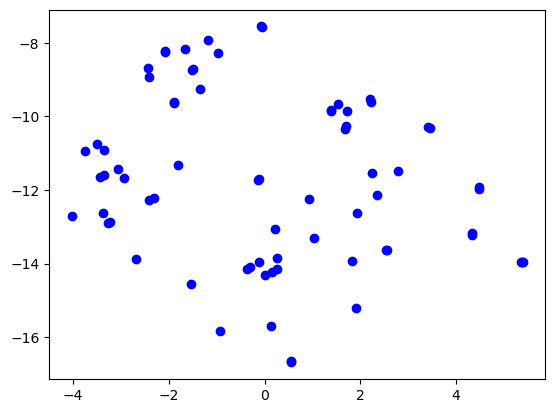

In [128]:
# Reduce dimensions for visualization
tsne_cmax = TSNE(n_components=2, random_state=42)
X_test_tsne_cmax = tsne_cmax.fit_transform(X_test_cmax)

# Plot the data
plt.scatter(X_test_tsne_cmax[:, 0], X_test_tsne_cmax[:, 1], c='blue', label='Test Data')
plt.scatter(X_test_tsne_cmax[outliers_cmax, 0], X_test_tsne_cmax[outliers_cmax, 1], c='red', label='Outliers')
plt.scatter(X_test_tsne_cmax[high_leverage_points_cmax, 0], X_test_tsne_cmax[high_leverage_points_cmax, 1], c='green', label='Leverage points')
plt.legend()
plt.title('t-SNE visualization of test data and outliers')
plt.xlabel('t-SNE component 1')
plt.ylabel('t-SNE component 2')
plt.show()

In [ ]:
# Apply PCA
pca_cmax = PCA(n_components=2)  # Reduce to 2 dimensions for visualization
X_train_pca_cmax = pca_cmax.fit_transform(X_train_cmax)
X_test_pca_cmax = pca_cmax.transform(X_test_cmax)

# Create scatter plot
plt.figure(figsize=(12, 8))

# Plot training data
plt.scatter(X_train_pca_cmax[:, 0], X_train_pca_cmax[:, 1], label='Training Data', alpha=0.5, color='blue')

# Plot test data
plt.scatter(X_test_pca_cmax[:, 0], X_test_pca_cmax[:, 1], label='Test Data', alpha=0.5, color='green')

# Highlight high leverage points in test data
plt.scatter(X_test_pca_cmax[high_leverage_points_cmax, 0], X_test_pca_cmax[high_leverage_points_cmax, 1], color='red', label='High Leverage Points', edgecolor='k')

# Highlight outliers in test data
plt.scatter(X_test_pca_cmax[outliers_cmax, 0], X_test_pca_cmax[outliers_cmax, 1], color='yellow', label='Outliers', edgecolor='k')

# Add labels and legend
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Visualization of Training and Test Data with High Leverage Points and Outliers')
plt.legend()
plt.grid(True)
plt.show()

### Probability density estimation

In [ ]:
# Reduce dimensions to 2D using PCA
pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train_cmax)
X_test_pca = pca.transform(X_test_cmax)

# Fit KDE with automatic bandwidth selection (Scott's method by default)
kde = KernelDensity(kernel='gaussian', bandwidth='scott')
kde.fit(X_train_pca)

# Create grid points for density estimation visualization based on training data
x_min, x_max = X_train_pca[:, 0].min() - 1, X_train_pca[:, 0].max() + 1
y_min, y_max = X_train_pca[:, 1].min() - 1, X_train_pca[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
grid_points = np.vstack([xx.ravel(), yy.ravel()]).T

# Compute KDE on the grid points
log_grid_density_scores = kde.score_samples(grid_points)
grid_density_scores = np.exp(log_grid_density_scores)
zz = grid_density_scores.reshape(xx.shape)

# Compute density scores for the test data
log_density_scores = kde.score_samples(X_test_pca)
density_scores = np.exp(log_density_scores)

# Set a threshold for outliers
threshold = np.percentile(density_scores, 10)  # Example: 5th percentile
outliers_indices = np.where(density_scores < threshold)[0]

# Plot results
plt.figure(figsize=(14, 6))

# Plot KDE density with correct colorbar scaling
plt.subplot(1, 2, 1)
contour = plt.contourf(xx, yy, zz, levels=10, cmap='Reds', alpha=1)
plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c='blue', s=30, edgecolor='k', label='Training Data')
plt.scatter(X_test_pca[:, 0], X_test_pca[:, 1], c='green', s=30, edgecolor='k', label='Test Data')
plt.scatter(X_test_pca[outliers_indices, 0], X_test_pca[outliers_indices, 1], c='yellow', s=50, edgecolor='k', label='Outliers')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('KDE Density Plot')
plt.colorbar(contour, label='Density')
plt.legend()

# Plot outliers with KDE density contours
plt.subplot(1, 2, 2)
contour = plt.contourf(xx, yy, zz, levels=10, cmap='Reds', alpha=0.6)
plt.scatter(X_test_pca[:, 0], X_test_pca[:, 1], c='green', s=30, label='Test Data', edgecolor='k')
plt.scatter(X_test_pca[outliers_indices, 0], X_test_pca[outliers_indices, 1], c='yellow', s=50, edgecolor='k', label='Outliers')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Outlier Detection')
plt.colorbar(contour, label='Density')
plt.legend()

plt.tight_layout()
plt.show()
kde_outliers = outliers_indices
print("Outliers detected at indices:", kde_outliers)

### City block distance

In [ ]:
def city_block_distance(X, mean):
    """
    Compute City Block distances for all points in X from the mean.
    
    Parameters:
    - X: 2-D array of shape (n_samples, n_features)
    - mean: 1-D array of shape (n_features,)
    
    Returns:
    - distances: 1-D array of City Block distances
    """
    X = np.array(X)  # Ensure X is a numpy array
    mean = np.array(mean)  # Ensure mean is a numpy array
    
    distances = np.sum(np.abs(X - mean), axis=1)
    return distances

# Apply PCA to training and test data
pca = PCA(n_components=2)
X_train_cmax_2d = pca.fit_transform(X_train_cmax)  # Fit PCA and transform training data
X_test_cmax_2d = pca.transform(X_test_cmax)        # Transform test data

# Compute the mean of the PCA-reduced training data
mean_cmax_2d = np.mean(X_train_cmax_2d, axis=0)

# Compute City Block distances for test data in PCA space
distances_cmax_2d = city_block_distance(X_test_cmax_2d, mean_cmax_2d)

# Define a threshold for outliers
threshold_cmax_2d = np.percentile(distances_cmax_2d, 90)  # Example: 90th percentile
outliers_cmax_2d = distances_cmax_2d > threshold_cmax_2d

# Create a grid for contour plot
x_min, x_max = X_test_cmax_2d[:, 0].min() - 1, X_test_cmax_2d[:, 0].max() + 1
y_min, y_max = X_test_cmax_2d[:, 1].min() - 1, X_test_cmax_2d[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))

# Flatten the grid for distance computation
grid_points = np.c_[xx.ravel(), yy.ravel()]

# Compute City Block distances for the grid points
distances_grid = city_block_distance(grid_points, mean_cmax_2d)

# Reshape distances back to the grid shape
distances_grid = distances_grid.reshape(xx.shape)

# Plotting the contour plot
plt.figure(figsize=(12, 10))

# Contour plot for City Block distances with shades of red
contour = plt.contourf(xx, yy, distances_grid, cmap='Reds', levels=20)
plt.colorbar(contour, label='City Block Distance')

# Scatter plot of PCA-reduced training data in blue
# plt.scatter(X_train_cmax_2d[:, 0], X_train_cmax_2d[:, 1], color='blue', edgecolors='k', s=50, label='Training Data')

# Scatter plot of PCA-reduced test data in green
plt.scatter(X_test_cmax_2d[:, 0], X_test_cmax_2d[:, 1], color='green', edgecolors='k', s=50, label='Test Data')

# Highlight outliers in yellow
plt.scatter(X_test_cmax_2d[outliers_cmax_2d, 0], X_test_cmax_2d[outliers_cmax_2d, 1], 
            color='yellow', edgecolors='k', s=100, label='Outliers')

plt.title('Contour Plot of City Block Distances in PCA Space')
plt.xlabel('Feature 1 (PCA)')
plt.ylabel('Feature 2 (PCA)')
plt.legend()
plt.grid(True)
plt.show()
# Print outlier indices
city_block_outliers = np.where(outliers_cmax_2d)[0]
print("Outliers detected at indices:", city_block_outliers)

### Plot AD outliers

In [ ]:
# Convert numpy array indices to list
malh_outliers_list = malh_outliers.tolist()
kde_outliers_list = kde_outliers.tolist()
city_block_outliers_list = city_block_outliers.tolist()
leverage_outliers_list = high_leverage_points_cmax.tolist()

# Plot predicted vs. observed for test set
plt.figure(figsize=(12, 8))

# Plot all data points
plt.scatter(y_test_cmax, y_test_pred_cmax, color='green', label='Predicted vs. Observed (Test)', alpha=0.7)

# Plot the ideal line
plt.plot([min(y_test_cmax), max(y_test_cmax)], 
         [min(y_test_cmax), max(y_test_cmax)], 
         linestyle='--', color='red', label='Ideal Line')

# Plot Mahalanobis outliers
plt.scatter(y_test_cmax.iloc[malh_outliers_list], 
            y_test_pred_cmax[malh_outliers_list],
            marker='^', color='orange', s=100, label='Mahalanobis Outliers')

# Plot KDE outliers
plt.scatter(y_test_cmax.iloc[kde_outliers_list], 
            y_test_pred_cmax[kde_outliers_list],
            marker='s', color='yellow', s=100, label='KDE Outliers')

# Plot City Block outliers
plt.scatter(y_test_cmax.iloc[city_block_outliers_list], 
            y_test_pred_cmax[city_block_outliers_list],
            marker='*', color='purple', s=100, label='City Block Outliers')

# Plot leverage outliers
plt.scatter(y_test_cmax.iloc[leverage_outliers_list], 
            y_test_pred_cmax[leverage_outliers_list],
            marker='+', color='red', s=100, label='High leverage outliers')

# Labeling and title
plt.xlabel('Observed')
plt.ylabel('Predicted')
plt.title('AUC Predicted vs. Observed (Test Set)')
plt.legend()
plt.grid(True)
plt.show()

# Print the indices of the outliers
print("Mahalanobis outliers indices:", malh_outliers_list)
print("KDE outliers indices:", kde_outliers_list)
print("City Block outliers indices:", city_block_outliers_list)
print("High leverage indices:", leverage_outliers_list)

# Model auc prediction

### Select numerical features

In [ ]:
numerical_features_auc = ['Dose', 'Weight_g', 'Experiment_duration', 'Hydrodynamic_size_nm']

## ANOVA test

In [ ]:
# Define ANOVA test (for a categorical feature against a numerical target)
def anova(df, feature):
    groups = df.groupby(feature)[target2].apply(list) # AUC is the target value
    f_value, p_value = stats.f_oneway(*groups)
    return pd.DataFrame({'PR(>F)': [p_value]}, index=[feature])

In [ ]:
# Test for statistical importance of categoricals
anova_for_categoricals = []
for i in all_categorical_features:
    anova_for_categoricals.append([i,anova(X_IQR, i).loc[i,'PR(>F)']])

anova_for_categoricals = pd.DataFrame(anova_for_categoricals, columns=['feature','anova pvalue'])
anova_for_categoricals.columns = [str(column) for column in anova_for_categoricals.columns]

# show results
anova_for_categoricals

In [ ]:
cateforical_drop_lst_auc = []

### Plot to visualize ANOVA results

In [ ]:
for feature in all_categorical_features:
  # Create the boxplot
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=feature, y=target2, data=X_IQR)
    plt.title(f'Boxplot of {target1} vs {feature}')
    plt.xlabel(f'{feature}')
    plt.ylabel(target1)
    plt.show()

### Select categorical features

In [ ]:
encode_features = ['Material_type', 'Coating', 'Cancer_presence', 'Dose_units']
onehot_features = ['Material', 'Shape', 'Z-potential', 'Sex', 'Organs', 'Method_analysis']
categorical_features_auc = [col for col in all_categorical_features if col not in cateforical_drop_lst_auc]

## Define X data (features) and Y data (target)

In [ ]:
outlier_indices_cmax

In [ ]:
# X_outlier = X_IQR.drop(1766)
X_outlier = X_IQR.drop(index=outlier_indices_cmax)
X_data_new = X_outlier[numerical_features_auc + categorical_features_auc]
y_data_auc = X_outlier[target2]

In [ ]:
# Initialize Dose_MBq and Dose_mg with zeros
X_data_new = X_data_new.copy()

X_data_new.loc[:, 'Dose_MBq'] = 0
X_data_new.loc[:, 'Dose_mg'] = 0

# Assign values based on Dose_units
X_data_new.loc[X_data_new['Dose_units'] == 'MBq', 'Dose_MBq'] = X_data_new['Dose']
X_data_new.loc[X_data_new['Dose_units'] == 'mg', 'Dose_mg'] = X_data_new['Dose']

# Drop unnecessary columns
X_data_new = X_data_new.drop(columns=['Dose_units', 'Dose'])

In [ ]:
# Handle Dose for numerical and categorical features
numerical_features_auc.remove('Dose')
numerical_features_auc.append('Dose_MBq')
numerical_features_auc.append('Dose_mg')
categorical_features_auc.remove('Dose_units')

### Onehot encoding

In [ ]:
# Define categorical features which need onehot encoding
features_to_onehot_lst_auc = [col for col in categorical_features_auc if col in onehot_features]

# One-hot encode categorical features
X_categorical_onehot_auc = pd.get_dummies(X_data_new[features_to_onehot_lst_auc]).astype('int64')
one_hot_columns_lst_auc = X_categorical_onehot_auc.columns.values.tolist() # Create a list with new onehot columns
X_categorical_onehot_auc.columns

### Label encoding

In [ ]:
# Define categorical features which need onehot encoding
features_to_encode_lst_auc = [col for col in categorical_features_auc if col in encode_features]

# Initialize LabelEncoder
label_encoder_auc = LabelEncoder()

# Apply label encoding to each column in features_to_encode_lst
for feature in features_to_encode_lst_auc:
    X_data_new[feature] = label_encoder_auc.fit_transform(X_data_new[feature])

X_data_new[features_to_encode_lst_auc].head()

### Create final X data

In [ ]:
# Seperate numerical data from X_data
X_numerical_auc = X_data_new.drop(features_to_encode_lst_auc+features_to_onehot_lst_auc, axis=1)

# Join numerical, onehot and label encoded data
X_data_auc = pd.concat([X_numerical_auc, X_data_new[features_to_encode_lst_auc], X_categorical_onehot_auc], axis=1)

# Check the final dataframe
X_data_auc.info()

In [ ]:
# Create column Cmax from model Cmax predictions
y_cmax_train_df = pd.DataFrame(y_train_pred_cmax, columns=[target1], index=X_train_cmax.index)
y_cmax_test_df = pd.DataFrame(y_test_pred_cmax, columns=[target1], index=X_test_cmax.index)
X_cmax = pd.concat([y_cmax_train_df, y_cmax_test_df])
X_cmax = X_cmax.sort_index()
print(X_cmax.shape)

In [ ]:
# Create final X data
X_data_auc = pd.concat([X_data_auc, X_cmax], axis=1)
X_data_auc.shape

In [ ]:
X_data_auc.shape

### Train, Test split

In [ ]:
# Shuffle the data
X_data_auc_shuf, y_data_auc_shuf = shuffle(X_data_auc, y_data_auc, random_state=42)

In [ ]:
X_data_auc.shape

#### Kennard-stone

In [ ]:
# Split with Kennard stone
X_train_auc, X_test_auc, y_train_auc, y_test_auc = ks_split(X_data_auc_shuf, y_data_auc_shuf, test_size=0.2)

In [ ]:
X_train_auc.shape

In [ ]:
X_test_auc.shape

In [ ]:
# Plotting histograms
plt.figure(figsize=(12, 6))

# Plot histogram for y_train
plt.hist(y_train_auc, bins=30, alpha=0.7, label='Training Set', color='blue')

# Plot histogram for y_test
plt.hist(y_test_auc, bins=30, alpha=0.7, label='Test Set', color='yellow')

# Adding labels and title
plt.xlabel('auc')
plt.ylabel('Frequency')
plt.title(f'Distribution of Target Variable ({target2}) in Training and Test Sets')
plt.legend()

# # Save the plot to a file
plt.savefig('kn_AUC_hist.png', dpi=300, bbox_inches='tight')

# Show plot
plt.show()

In [ ]:
# y_data_auc_shuf.describe()

In [ ]:
# percentiles = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
# description_auc = y_data_auc_shuf.describe(percentiles=percentiles)
# print(description_auc)

In [ ]:
# # Define custom bins
# bins = [description_auc['10%'], description_auc['20%'], description_auc['30%'], description_auc['40%'], description_auc['50%'], description_auc['60%'], description_auc['70%'], description_auc['80%'], description_auc['90%'],  np.inf]  # Custom bins
# y_binned_auc = np.digitize(y_data_auc_shuf, bins)

# # Check the distribution of instances in each bin
# bin_counts_auc = np.bincount(y_binned_auc)
# print("Bin counts:", bin_counts_auc)

In [ ]:
# # Perform stratified train-test split
# X_train_auc, X_test_auc, y_train_auc, y_test_auc = train_test_split(X_data_auc_shuf, y_data_auc_shuf, stratify=y_binned_auc, test_size=0.2, random_state=42)

# # Display the shapes of the resulting datasets
# print("X_train shape:", X_train_auc.shape)
# print("X_test shape:", X_test_auc.shape)
# print("y_train shape:", y_train_auc.shape)
# print("y_test shape:", y_test_auc.shape)
# print()
# print(f'y_train description: {y_train_auc.describe()}')
# print()
# print(f'y_test description: {y_test_auc.describe()}')

In [ ]:
# print(X_data_new['Material'].nunique())
# print(X_data_new['Material'][X_train_auc.index].nunique())
# print(X_data_new['Material'][X_test_auc.index].nunique())
# print(X_data_new['Material'][X_train_auc.index].value_counts())
# print(X_data_new['Material'][X_test_auc.index].value_counts())

### Scale numerical features

In [ ]:
# Make dataframes with the numerical features of X_train and X_test
numerical_features_auc.append('Cmax')
X_train_num_auc = X_train_auc[numerical_features_auc]
X_test_num_auc = X_test_auc[numerical_features_auc]

In [ ]:
# Define scaler
feature_scaler_auc = StandardScaler()

# Fit scaler on training features
feature_scaler_auc.fit(X_train_num_auc)

# Transform features
X_train_num_scaled_auc = feature_scaler_auc.transform(X_train_num_auc)
X_test_num_scaled_auc = feature_scaler_auc.transform(X_test_num_auc)

# Convert scaled features back to DataFrames
X_train_num_scaled_auc_df = pd.DataFrame(X_train_num_scaled_auc, columns=X_train_num_auc.columns, index=X_train_num_auc.index)
X_test_num_scaled_auc_df = pd.DataFrame(X_test_num_scaled_auc, columns=X_test_num_auc.columns, index=X_test_num_auc.index)

In [ ]:
# Define non numerical features
non_numerical_features_auc = [col for col in X_train_auc.columns if col not in numerical_features_auc]

# Define train data
X_train_auc = pd.concat([X_train_num_scaled_auc_df, X_train_auc[non_numerical_features_auc]], axis=1)
X_test_auc = pd.concat([X_test_num_scaled_auc_df, X_test_auc[non_numerical_features_auc]], axis=1)


In [ ]:
X_train_auc.describe()

In [ ]:
# Calculate Z-scores for the features
z_scores = np.abs(X_train_auc[numerical_features_auc])

# Define the threshold for identifying outliers
threshold = 3

# Identify outliers
outliers = (z_scores > threshold)

# Create a dataframe showing which data points are outliers
outlier_df = pd.DataFrame(outliers, columns=X_train_auc[numerical_features_auc].columns)

# Display outliers
outliers_summary = outlier_df.sum(axis=0).sort_values(ascending=False)
print(outliers_summary)

# Optionally, you can get the indices of rows that are outliers in any feature
outlier_indices = np.where(outliers.any(axis=1))[0]

# Display the indices of outlier rows
print("Indices of outlier rows:", outlier_indices)

In [ ]:
# Define the threshold for identifying outliers
threshold = 3

# Identify outliers (rows where any scaled value > threshold or < -threshold)
outlier_indices_auc = X_train_auc[(X_train_auc > threshold).any(axis=1) | (X_train_auc < -threshold).any(axis=1)].index

# Display the indices of the outliers
print("Indices of outliers:", outlier_indices_auc)

In [ ]:
# Remove the rows with outliers from both X_train_cmax and y_train_cmax using DataFrame indices
X_train_auc = X_train_auc.drop(index=outlier_indices_auc)
y_train_auc = y_train_auc.drop(index=outlier_indices_auc)

# Display the shape of the filtered datasets
print("Filtered X_train_cmax shape:", X_train_auc.shape)
print("Filtered y_train_cmax shape:", y_train_auc.shape)

In [ ]:
# Define test data
y_train_auc_log = np.log(y_train_auc)
y_test_auc_log = np.log(y_test_auc)

# Check train and test dimensions
print(f'Train dimensions: {X_train_auc.shape}')
print(f'Test dimensions: {X_test_auc.shape}')

In [ ]:
# # Find leverage points in training data
# from sklearn.metrics import pairwise_distances

# # Compute pairwise distances between training data points
# distances_train = pairwise_distances(X_train_auc, X_train_auc)

# # Calculate the mean distance to other training points for each point
# mean_distances_train = np.mean(distances_train, axis=1)

# # Define a threshold for high leverage (e.g., 95th percentile)
# threshold_leverage_train = np.percentile(mean_distances_train, 95)

# # Identify high leverage points
# high_leverage_points_train = np.where(mean_distances_train > threshold_leverage_train)[0]

# print("High leverage points detected:", high_leverage_points_train)


In [ ]:
# # Drop leverage points from training data and target variable
# X_train_auc = X_train_auc.drop(X_train_auc.iloc[high_leverage_points_train].index)
# y_train_auc_log = y_train_auc_log.drop(y_train_auc_log.iloc[high_leverage_points_train].index)

In [ ]:
y_data_auc.describe()

## Random Forest Regression for Model AUC

In [ ]:
# Define the model
rf_auc =RandomForestRegressor(n_estimators=100, random_state=42)

# Fit the model to training data
rf_auc.fit(X_train_auc, y_train_auc_log)

In [ ]:
# Get predictions
y_train_pred_auc = rf_auc.predict(X_train_auc)
y_test_pred_auc = rf_auc.predict(X_test_auc)

# Metrics for Cmax
r2_train_auc = r2_score(y_train_auc_log, y_train_pred_auc)
r2_test_auc = r2_score(y_test_auc_log, y_test_pred_auc)

# R^2 score using cross-validation
folds=10
cv_scores_auc = cross_val_score(rf_auc, X_train_auc, y_train_auc_log, cv=folds, scoring='r2')
mean_cv_r2_auc = np.mean(cv_scores_auc)

print(f'R^2 score on training set: {r2_train_auc}')
print(f'R^2 score on test set: {r2_test_auc}')
print(f'Mean R^2 score (CV): {mean_cv_r2_auc}')
print(f'R^2 scores (CV): {cv_scores_auc} for {folds} folds')

In [ ]:
# Define the parameter grid
param_grid = {
    'n_estimators': [30, 50, 100, 200, 300],  # Number of trees in the forest
    'max_depth': [None, 10, 20, 30],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split an internal node
}

# Initialize the Grid Search with Random Forest
grid_search_auc = GridSearchCV(estimator=rf_auc, param_grid=param_grid, cv=10, scoring='r2', n_jobs=-1, verbose=2)

# Fit the Grid Search model
grid_search_auc.fit(X_train_auc, y_train_auc_log)

# Extract the best parameters and best score
best_params_auc = grid_search_auc.best_params_
best_score_auc = grid_search_auc.best_score_

# Print the best parameters and the best score
print(f"Best parameters found: {best_params_auc}")
print(f"Best R^2 score from Grid Search (CV): {best_score_auc}")

# Use the best estimator to make predictions
best_rf_auc = grid_search_auc.best_estimator_

# Get predictions on training and test sets using the best estimator
y_train_pred_auc = best_rf_auc.predict(X_train_auc)
y_test_pred_auc = best_rf_auc.predict(X_test_auc)

# Metrics for AUC
r2_train_auc = r2_score(y_train_auc_log, y_train_pred_auc)
r2_test_auc = r2_score(y_test_auc_log, y_test_pred_auc)

# Cross-Validation R^2 Score with the best model
cv_scores_r2_auc = cross_val_score(best_rf_auc, X_train_auc, y_train_auc_log, cv=10, scoring='r2')
mean_cv_r2_auc = np.mean(cv_scores_r2_auc)

# Print the R^2 scores
print(f'R^2 score on training set: {r2_train_auc}')
print(f'R^2 score on test set: {r2_test_auc}')
print(f'Mean R^2 score (CV): {mean_cv_r2_auc}')
print(f'R^2 scores (CV): {cv_scores_r2_auc} for {folds} folds')

In [ ]:
# Convert the logarithmic values back to the original scale
y_train_true = np.exp(y_train_auc_log)
y_train_pred = np.exp(y_train_pred_auc)
y_test_true = np.exp(y_test_auc_log)
y_test_pred = np.exp(y_test_pred_auc)

# Calculate RMSE on the original scale
rmse_train_auc = root_mean_squared_error(y_train_true, y_train_pred)
rmse_test_auc = root_mean_squared_error(y_test_true, y_test_pred)

# Cross-validation RMSE on the original scale
cv_scores_rmse_auc = cross_val_score(best_rf_auc, X_train_auc, y_train_auc_log, cv=10,
                                     scoring=make_scorer(lambda y_true, y_pred: np.sqrt(mean_squared_error(np.exp(y_true), np.exp(y_pred)))))
mean_cv_rmse_auc = np.mean(cv_scores_rmse_auc)

# Print the RMSE scores
print(f'RMSE on training set: {rmse_train_auc}')
print(f'RMSE on test set: {rmse_test_auc}')
print(f'Mean RMSE score (CV): {mean_cv_rmse_auc}')
print(f'RMSE scores (CV): {cv_scores_rmse_auc} for {folds} folds')

In [ ]:
y_data_auc.describe()

### Plot results

In [ ]:
# Plot predicted vs. observed for training set auc
plt.figure(figsize=(8, 6))
plt.scatter(np.exp(y_train_auc_log), np.exp(y_train_pred_auc), color='blue', label='Predicted vs. Observed (Train)')
plt.plot([min(np.exp(y_train_auc_log)), max(np.exp(y_train_auc_log))], [min(np.exp(y_train_auc_log)), max(np.exp(y_train_auc_log))], linestyle='--', color='red', label='Ideal Line')
plt.xlabel('Observed AUC')
plt.ylabel('Predicted AUC')
plt.title('AUC Predicted vs. Observed (Training Set)')
plt.legend()
plt.grid(True)
plt.savefig('AUC_ypred_training_set', dpi=300)  
plt.show()

# Plot predicted vs. observed for test set
plt.figure(figsize=(8, 6))
plt.scatter(np.exp(y_test_auc_log), np.exp(y_test_pred_auc), color='green', label='Predicted vs. Observed (Test)')
plt.plot([min(np.exp(y_test_auc_log)), max(np.exp(y_test_auc_log))], [min(np.exp(y_test_auc_log)), max(np.exp(y_test_auc_log))], linestyle='--', color='red', label='Ideal Line')
plt.xlabel('Observed AUC')
plt.ylabel('Predicted AUC')
plt.title('AUC Predicted vs. Observed (Test Set)')
plt.legend()
plt.grid(True)
plt.savefig('AUC_ypred_test_set', dpi=300)  
plt.show()

## Feature Importances

In [ ]:
# Create a dataframe for feature importances
df_feature_importances_auc = pd.DataFrame({
    'Feature': best_rf_auc.feature_names_in_,
    'Importance': best_rf_auc.feature_importances_
})

# Sort by 'Importance' in descending order
df_feature_importances_auc = df_feature_importances_auc.sort_values(by='Importance', ascending=False)

# Reset the index
df_feature_importances_auc = df_feature_importances_auc.reset_index(drop=True)

# Display the DataFrame
print(df_feature_importances_auc.shape)
print(df_feature_importances_auc)

In [ ]:
df_feature_importances_auc.to_excel('feature_importances_auc.xlsx', index=False)

## Applicability domain (AD)

### Range

#### Train set

In [ ]:
X_train_auc_pca = X_data_auc.loc[X_train_auc.index]
X_train_auc_pca[numerical_features_auc].describe()

In [ ]:
column_name_train_pca_auc = X_train_auc_pca.columns
print(column_name_train_pca_auc)

#### Test set

In [ ]:
X_test_auc_pca = X_data_auc.loc[X_test_auc.index]

# Filter out the zero values and find the minimum of the remaining values
smallest_non_zero_value_MBq = X_test_auc_pca['Dose_MBq'][X_test_auc_pca['Dose_MBq'] > 0].min()

# Display the result
print(f'The smallest non-zero value in Dose_MBq: {smallest_non_zero_value_MBq}')


# Filter out the zero values and find the minimum of the remaining values
smallest_non_zero_value_mg = X_test_auc_pca['Dose_mg'][X_test_auc_pca['Dose_mg'] > 0].min()

# Display the result
print(f'The smallest non-zero value in Dose_mg: {smallest_non_zero_value_mg}')


X_test_auc_pca[numerical_features_auc].describe()




In [ ]:
column_name_test_pca_auc = X_test_auc_pca.columns
print(column_name_test_pca_auc)

#### Check range

In [ ]:
# Initialize a boolean Series to store whether each row has values out of bounds
out_of_bounds = pd.Series(False, index=X_test_auc_pca.index)

# Iterate over each numerical feature
for col in numerical_features_auc:
    # Check for values larger than the maximum in the training set
    larger = X_test_auc_pca[col] > X_train_auc_pca[col].max()
    # Check for values smaller than the minimum in the training set
    smaller = X_test_auc_pca[col] < X_train_auc_pca[col].min()
    # Update the out_of_bounds Series
    out_of_bounds = out_of_bounds | larger | smaller

# Count the number of rows that have at least one out-of-bounds value
out_of_bounds_count = out_of_bounds.sum()

# Display the result
print(f'Number of rows in test set with at least one feature value out of bounds: {out_of_bounds_count}')


### PCA method

In [ ]:
# upper_bounds_auc

In [ ]:
# upper_bounds_auc.shape

In [ ]:
# outliers_auc_pca

In [ ]:
# lower_bounds_auc

In [ ]:
# X_test_pca_auc[~within_domain_auc]

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.lines import Line2D
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt

# Perform PCA on the training data to retain 90% of the variance
pca_auc = PCA(n_components=0.90)
X_train_pca_auc = pca_auc.fit_transform(X_train_auc)
X_test_pca_auc = pca_auc.transform(X_test_auc)

# Determine the number of components (n) that explain 90% of the variance
n_components = pca_auc.n_components_
print(f'Number of components explaining 90% of variance: {n_components}')

# Define the bounds for the PCA space (bounding box for the training data)
lower_bounds_auc = np.min(X_train_pca_auc, axis=0)
upper_bounds_auc = np.max(X_train_pca_auc, axis=0)

# Check if test data points fall within the defined bounds (bounding box)
within_domain_auc = np.all(
    (X_test_pca_auc > lower_bounds_auc) & (X_test_pca_auc < upper_bounds_auc),
    axis=1
)

# Identify outliers based on the PCA bounding box
outliers_auc_pca = X_test_auc[~within_domain_auc]
num_outliers = outliers_auc_pca.shape[0]
print(f'Number of outliers: {num_outliers}')

# 2D plot for PCA1 and PCA2
plt.figure(figsize=(10, 8))

# Plot in-domain test data as green markers
plt.scatter(X_test_pca_auc[within_domain_auc, 0], X_test_pca_auc[within_domain_auc, 1], 
            color='green', alpha=1.0, s=100, marker='o', label='In-Domain Test Data')

# Plot out-of-domain test data as solid red 'x' markers
plt.scatter(X_test_pca_auc[~within_domain_auc, 0], X_test_pca_auc[~within_domain_auc, 1], 
            color='red', s=100, marker='x', label='Out-of-Domain Test Data')

# Draw bounding box in 2D (only the sides for PCA1 and PCA2)
plt.plot([lower_bounds_auc[0], upper_bounds_auc[0]], [lower_bounds_auc[1], lower_bounds_auc[1]], 'orange', linestyle="--")
plt.plot([lower_bounds_auc[0], upper_bounds_auc[0]], [upper_bounds_auc[1], upper_bounds_auc[1]], 'orange', linestyle="--")
plt.plot([lower_bounds_auc[0], lower_bounds_auc[0]], [lower_bounds_auc[1], upper_bounds_auc[1]], 'orange', linestyle="--")
plt.plot([upper_bounds_auc[0], upper_bounds_auc[0]], [lower_bounds_auc[1], upper_bounds_auc[1]], 'orange', linestyle="--")

# Custom legend entry for the bounding box lines
legend_lines = [Line2D([0], [0], color='orange', linestyle='--', lw=2, label='Bounding Box')]

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('2D PCA Plot with PCA1 and PCA2')
plt.legend(handles=plt.gca().get_legend_handles_labels()[0] + legend_lines, loc='upper right')
plt.show()

# 3D plots for PCA1, PCA2, and varying the third component
for i in range(2, n_components):
    fig = plt.figure(figsize=(14, 10))  # Increase figure size for more space
    ax = fig.add_subplot(111, projection='3d')
    
    # Plot in-domain test data as green markers
    ax.scatter(X_test_pca_auc[within_domain_auc, 0], X_test_pca_auc[within_domain_auc, 1], 
               X_test_pca_auc[within_domain_auc, i], color='green', alpha=1.0, s=100, marker='o', label='In-Domain Test Data', zorder=1)
    
    # Plot out-of-domain test data as solid red 'x' markers with increased size and zorder
    ax.scatter(X_test_pca_auc[~within_domain_auc, 0], X_test_pca_auc[~within_domain_auc, 1], 
               X_test_pca_auc[~within_domain_auc, i], color='red', s=200, marker='x', label='Out-of-Domain Test Data', zorder=2)
    
    # Plot the bounding box (in-domain region)
    corners = np.array([
        [lower_bounds_auc[0], lower_bounds_auc[1], lower_bounds_auc[i]],
        [lower_bounds_auc[0], lower_bounds_auc[1], upper_bounds_auc[i]],
        [lower_bounds_auc[0], upper_bounds_auc[1], lower_bounds_auc[i]],
        [lower_bounds_auc[0], upper_bounds_auc[1], upper_bounds_auc[i]],
        [upper_bounds_auc[0], lower_bounds_auc[1], lower_bounds_auc[i]],
        [upper_bounds_auc[0], lower_bounds_auc[1], upper_bounds_auc[i]],
        [upper_bounds_auc[0], upper_bounds_auc[1], lower_bounds_auc[i]],
        [upper_bounds_auc[0], upper_bounds_auc[1], upper_bounds_auc[i]],
    ])

    # Define pairs of corners that need to be connected to form the bounding box
    edges = [
        (0, 1), (0, 2), (0, 4),
        (1, 3), (1, 5),
        (2, 3), (2, 6),
        (3, 7),
        (4, 5), (4, 6),
        (5, 7),
        (6, 7),
    ]

    # Plot the edges of the bounding box
    for edge in edges:
        ax.plot3D(*corners[list(edge)].T, color="orange", linestyle="--", label='Bounding Box' if edge == edges[0] else "")
    
    # Labels and title
    ax.set_xlabel('Principal Component 1')
    ax.set_ylabel('Principal Component 2')
    ax.set_zlabel(f'Principal Component {i+1}')
    ax.set_title(f'3D PCA Plot with PCA1, PCA2, and PCA{i+1}')
    
    # Ensure the legend is fully visible
    ax.legend(loc='upper right', bbox_to_anchor=(1.05, 0.9), borderaxespad=0., borderpad=1.5)
    
    # Adjust the plot layout to prevent cutting off parts of the plot
    plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)
    
    # Adjust the view angle for better visibility
    ax.view_init(elev=20., azim=-35)
    
    plt.show()


#### Outliers predictions with PCA

In [ ]:
# Get the predictions for the outliers in PCA space
y_pca_pred_auc = best_rf_auc.predict(outliers_auc_pca)

# Get the corresponding actual values from y_test_auc for the outliers
y_actual_auc_outliers = y_test_auc_log[~within_domain_auc]

# Calculate the absolute error for each outlier
absolute_errors = np.abs(np.exp(y_pca_pred_auc) - np.exp(y_actual_auc_outliers))

# Print the absolute errors
print("Absolute errors for the outliers:")
print(absolute_errors)


In [ ]:
# # Perform PCA on the training data
# pca_auc = PCA(n_components=2)  # Choose the number of components for visualization
# X_train_pca_auc = pca_auc.fit_transform(X_train_auc)
# X_test_pca_auc = pca_auc.transform(X_test_auc)

# # Calculate statistical measures for setting thresholds
# mean_pca_auc = np.mean(X_train_pca_auc, axis=0)
# std_pca_auc = np.std(X_train_pca_auc, axis=0)

# # Set thresholds as ±3 standard deviations 
# thresholds_std_auc = 3 * std_pca_auc

# # Define the bounds for the PCA space
# lower_bounds_auc = mean_pca_auc - thresholds_std_auc
# upper_bounds_auc = mean_pca_auc + thresholds_std_auc

# # Check if test data points fall within the defined bounds
# within_domain_auc = np.all(
#     (X_test_pca_auc >= lower_bounds_auc) & (X_test_pca_auc <= upper_bounds_auc),
#     axis=1
# )

# # Visualize the training data and test data in PCA space
# plt.figure(figsize=(10, 6))

# # Plot training data
# plt.scatter(X_train_pca_auc[:, 0], X_train_pca_auc[:, 1], color='blue', alpha=0.5, label='Training Data')

# # Plot test data
# plt.scatter(
#     X_test_pca_auc[within_domain_auc, 0], X_test_pca_auc[within_domain_auc, 1], color='green', label='In-Domain Test Data'
# )
# plt.scatter(
#     X_test_pca_auc[~within_domain_auc, 0], X_test_pca_auc[~within_domain_auc, 1], color='red', label='Out-of-Domain Test Data'
# )

# # Plot thresholds (for reference)
# plt.axvline(x=mean_pca_auc[0] + thresholds_std_auc[0], color='gray', linestyle='--')
# plt.axvline(x=mean_pca_auc[0] - thresholds_std_auc[0], color='gray', linestyle='--')
# plt.axhline(y=mean_pca_auc[1] + thresholds_std_auc[1], color='gray', linestyle='--')
# plt.axhline(y=mean_pca_auc[1] - thresholds_std_auc[1], color='gray', linestyle='--')

# plt.xlabel('Principal Component 1')
# plt.ylabel('Principal Component 2')
# plt.title('Test Data Applicability Domain for Model AUC')
# plt.legend()
# plt.show()

### Mahalanobis distance

In [ ]:
# max(mahalanobis_distances)

In [ ]:
# np.sqrt(chi2.ppf(0.95, 16))

In [ ]:
# threshold_chi2

In [ ]:
# from mpl_toolkits.mplot3d import Axes3D
# from sklearn.decomposition import PCA
# from sklearn.covariance import EmpiricalCovariance
# from scipy.spatial.distance import mahalanobis
# import numpy as np
# import matplotlib.pyplot as plt
# from scipy.linalg import eigh
# from matplotlib.patches import Patch

# def plot_ellipsoid(ax, mean, cov_matrix, threshold, color='orange', alpha=0.3):
#     # Eigenvalue decomposition
#     eigenvalues, eigenvectors = eigh(cov_matrix)
    
#     # Sort eigenvalues and eigenvectors by descending eigenvalue
#     order = eigenvalues.argsort()[::-1]
#     eigenvalues = eigenvalues[order]
#     eigenvectors = eigenvectors[:, order]
    
#     # Create a grid of points representing the ellipsoid
#     u = np.linspace(0, 2 * np.pi, 100)
#     v = np.linspace(0, np.pi, 100)
    
#     # The radii of the ellipsoid
#     radii = np.sqrt(threshold) * np.sqrt(eigenvalues)
    
#     # Cartesian coordinates in the ellipsoid's local coordinate system
#     x = radii[0] * np.outer(np.cos(u), np.sin(v))
#     y = radii[1] * np.outer(np.sin(u), np.sin(v))
#     z = radii[2] * np.outer(np.ones(np.size(u)), np.cos(v))
    
#     # Rotate the ellipsoid to align with the principal axes
#     for i in range(len(x)):
#         for j in range(len(x)):
#             [x[i, j], y[i, j], z[i, j]] = np.dot([x[i, j], y[i, j], z[i, j]], eigenvectors.T) + mean
    
#     # Plot the ellipsoid
#     ax.plot_surface(x, y, z, color=color, alpha=alpha)

# # Perform PCA on the training data to retain 90% of the variance
# pca_auc = PCA(n_components=0.90)
# X_train_pca_auc = pca_auc.fit_transform(X_train_auc)
# X_test_pca_auc = pca_auc.transform(X_test_auc)

# # Calculate the mean and covariance matrix of the training data in PCA space
# mean_pca_auc = np.mean(X_train_pca_auc, axis=0)
# cov_estimator = EmpiricalCovariance().fit(X_train_pca_auc)
# cov_inv_pca_auc = np.linalg.inv(cov_estimator.covariance_)

# # Calculate Mahalanobis distance for the test data
# mahalanobis_distances = np.array([
#     mahalanobis(x, mean_pca_auc, cov_inv_pca_auc) for x in X_test_pca_auc
# ])



# # Set a threshold for the Mahalanobis distance (e.g., 95th percentile)
# threshold_perc = np.percentile(mahalanobis_distances, 90)

# # Set a threshold for the Mahalanobis distance based on the Chi-squared distribution for 95% confidence
# df = X_train_pca_auc.shape[1]  # degrees of freedom = number of retained components
# threshold_chi2 = np.sqrt(chi2.ppf(0.95, df))

# # Set a threshold based on mahalanobis train distance
# mahalanobis_distances_train = np.array([
#     mahalanobis(x, mean_pca_auc, cov_inv_pca_auc) for x in X_train_pca_auc
# ])
# threshold_mahalanobis = max(mahalanobis_distances_train)

# # Set final threshold
# # threshold = threshold_chi2
# # threshold_ellips = threshold_chi2 # np.sqrt(chi2.ppf(0.95, 3))
# threshold = threshold_mahalanobis
# # threshold_ellips = threshold_mahalanobis


# # Identify outliers based on Mahalanobis distance
# within_domain_auc = mahalanobis_distances <= threshold

# # Extract the outliers' characteristics from the original test set
# outliers_mahalanobis_auc = X_test_auc[~within_domain_auc]
# num_outliers = outliers_mahalanobis_auc.shape[0]

# # Print the number of outliers and their characteristics
# print(f'Number of outliers: {num_outliers}')



# # 2D plot for PCA1 and PCA2 with Mahalanobis distance contours
# plt.figure(figsize=(10, 8))

# # Generate a grid of points in the PCA space for contour plotting
# x_min, x_max = X_test_pca_auc[:, 0].min() - 1, X_test_pca_auc[:, 0].max() + 1
# y_min, y_max = X_test_pca_auc[:, 1].min() - 1, X_test_pca_auc[:, 1].max() + 1
# xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
# grid_points = np.c_[xx.ravel(), yy.ravel()]
# grid_distances = np.array([
#     mahalanobis(x, mean_pca_auc[:2], cov_inv_pca_auc[:2, :2]) for x in grid_points
# ])
# grid_distances = grid_distances.reshape(xx.shape)

# # Plot the Mahalanobis distance contours
# contour = plt.contourf(xx, yy, grid_distances, levels=50, cmap='RdYlBu_r')
# plt.colorbar(contour, label='Mahalanobis Distance')

# # Plot in-domain test data as green markers
# plt.scatter(X_test_pca_auc[within_domain_auc, 0], X_test_pca_auc[within_domain_auc, 1], 
#             color='green', alpha=1.0, s=100, marker='o', label='In-Domain Test Data')

# # Plot out-of-domain test data as solid red 'x' markers
# plt.scatter(X_test_pca_auc[~within_domain_auc, 0], X_test_pca_auc[~within_domain_auc, 1], 
#             color='red', s=100, marker='x', label='Out-of-Domain Test Data')

# plt.xlabel('Principal Component 1')
# plt.ylabel('Principal Component 2')
# plt.title('2D PCA Plot with PCA1 and PCA2 with Mahalanobis Distance Contours')
# plt.legend(loc='upper right')
# plt.show()

# # 3D plots for PCA1, PCA2, and varying the third component with Mahalanobis ellipsoids
# for i in range(2, pca_auc.n_components_):
#     fig = plt.figure(figsize=(14, 10))
#     ax = fig.add_subplot(111, projection='3d')

#     # Plot in-domain test data as green markers
#     in_domain_plot = ax.scatter(X_test_pca_auc[within_domain_auc, 0], X_test_pca_auc[within_domain_auc, 1], 
#                                 X_test_pca_auc[within_domain_auc, i], color='green', alpha=1.0, s=100, marker='o', label='In-Domain Test Data')
    
#     # Plot out-of-domain test data as solid red 'x' markers
#     out_domain_plot = ax.scatter(X_test_pca_auc[~within_domain_auc, 0], X_test_pca_auc[~within_domain_auc, 1], 
#                                  X_test_pca_auc[~within_domain_auc, i], color='red', s=200, marker='x', label='Out-of-Domain Test Data')
    
    
    
    
#     # Plot the ellipsoid representing the Mahalanobis distance threshold
#     plot_ellipsoid(ax, mean_pca_auc[:3], cov_estimator.covariance_[:3, :3], threshold_ellips)

#     # Create a custom legend entry for the ellipsoid
#     ellipsoid_patch = Patch(color='orange', alpha=0.3, label='Mahalanobis Threshold Ellipsoid')

#     # Combine all legend handles
#     handles = [in_domain_plot, out_domain_plot, ellipsoid_patch]

#     # Labels and title
#     ax.set_xlabel('Principal Component 1')
#     ax.set_ylabel('Principal Component 2')
#     ax.set_zlabel(f'Principal Component {i+1}')
#     ax.set_title(f'3D PCA Plot with PCA1, PCA2, and PCA{i+1} with Mahalanobis Distance Ellipsoid')
    
#     # Ensure the legend is fully visible
#     ax.legend(handles=handles, loc='upper right', bbox_to_anchor=(1.05, 0.9), borderaxespad=0., borderpad=1.5)

#     # Adjust the plot layout to prevent cutting off parts of the plot
#     plt.subplots_adjust(left=0.1, right=0.8, top=0.9, bottom=0.1)

#     # Adjust the view angle for better visibility
#     ax.view_init(elev=0., azim=-10)

#     # plt.show()


#### Last modification

In [ ]:
# threshold_mahalanobis

In [ ]:
# threshold_chi2

In [ ]:
# max(mahalanobis_distances)

In [ ]:
# np.sqrt(chi2.ppf(0.95, 3))

In [ ]:
# cov_inv_pca_auc

In [ ]:
# np.sqrt(chi2.ppf(0.95, 2))

In [ ]:
# threshold_chi2

In [ ]:
# max(mahalanobis_distances)

In [ ]:
# max(mahalanobis_distances_train)

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
from sklearn.covariance import EmpiricalCovariance
from scipy.spatial.distance import mahalanobis
import numpy as np
import matplotlib.pyplot as plt
from scipy.linalg import eigh
from matplotlib.patches import Patch

def plot_ellipsoid(ax, mean, cov_matrix, threshold, color='orange', alpha=0.3):
    # Eigenvalue decomposition
    eigenvalues, eigenvectors = eigh(cov_matrix)
    
    # Sort eigenvalues and eigenvectors by descending eigenvalue
    order = eigenvalues.argsort()[::-1]
    eigenvalues = eigenvalues[order]
    eigenvectors = eigenvectors[:, order]
    
    # Create a grid of points representing the ellipsoid
    u = np.linspace(0, 2 * np.pi, 100)
    v = np.linspace(0, np.pi, 100)
    
    # The radii of the ellipsoid
    radii =  np.sqrt(eigenvalues*threshold)
    
    # Cartesian coordinates in the ellipsoid's local coordinate system
    x = radii[0] * np.outer(np.cos(u), np.sin(v))
    y = radii[1] * np.outer(np.sin(u), np.sin(v))
    z = radii[2] * np.outer(np.ones(np.size(u)), np.cos(v))
    
    # Rotate the ellipsoid to align with the principal axes
    for i in range(len(x)):
        for j in range(len(x)):
            [x[i, j], y[i, j], z[i, j]] = np.dot([x[i, j], y[i, j], z[i, j]], eigenvectors.T) + mean
    
    # Plot the ellipsoid
    ax.plot_surface(x, y, z, color=color, alpha=alpha)

# def plot_ellipsoid(ax, mean, cov_matrix, chi2_val, color='orange', alpha=0.3):
#     # Eigenvalue decomposition
#     eigenvalues, eigenvectors = eigh(cov_matrix)
    
#     # Sort eigenvalues and eigenvectors by descending eigenvalue
#     order = eigenvalues.argsort()[::-1]
#     eigenvalues = eigenvalues[order]
#     eigenvectors = eigenvectors[:, order]
    
#     # Radii of the ellipsoid are proportional to the square root of the eigenvalues
#     radii = np.sqrt(eigenvalues * chi2_val)
    
#     # Create a grid of points representing the ellipsoid
#     u = np.linspace(0, 2 * np.pi, 100)
#     v = np.linspace(0, np.pi, 100)
#     x = radii[0] * np.outer(np.cos(u), np.sin(v))
#     y = radii[1] * np.outer(np.sin(u), np.sin(v))
#     z = radii[2] * np.outer(np.ones_like(u), np.cos(v))
    
#     # Rotate the ellipsoid to align with the principal axes
#     ellipsoid_points = np.array([x.ravel(), y.ravel(), z.ravel()])
#     ellipsoid_points = eigenvectors @ ellipsoid_points
#     x = ellipsoid_points[0, :].reshape(x.shape) + mean[0]
#     y = ellipsoid_points[1, :].reshape(y.shape) + mean[1]
#     z = ellipsoid_points[2, :].reshape(z.shape) + mean[2]
    
#     # Plot the ellipsoid
#     ax.plot_surface(x, y, z, color=color, alpha=alpha)



# Perform PCA on the training data to retain 90% of the variance
pca_auc = PCA(n_components=0.90)
X_train_pca_auc = pca_auc.fit_transform(X_train_auc)
X_test_pca_auc = pca_auc.transform(X_test_auc)

# Calculate the mean and covariance matrix of the training data in PCA space
mean_pca_auc = np.mean(X_train_pca_auc, axis=0)
cov_estimator = EmpiricalCovariance().fit(X_train_pca_auc)
cov_inv_pca_auc = np.linalg.inv(cov_estimator.covariance_)

# Calculate Mahalanobis distance for the test data
mahalanobis_distances = np.array([
    mahalanobis(x, mean_pca_auc, cov_inv_pca_auc) for x in X_test_pca_auc
])

# Set a threshold for the Mahalanobis distance (e.g., 95th percentile)
threshold_perc = np.percentile(mahalanobis_distances, 90)

# Set a threshold for the Mahalanobis distance based on the Chi-squared distribution for 95% confidence
df = X_train_pca_auc.shape[1]  # degrees of freedom = number of retained components
chi2_val = chi2.ppf(0.95, 3)
threshold_chi2 = np.sqrt(chi2.ppf(0.95, df))

# Set a threshold based on mahalanobis train distance
mahalanobis_distances_train = np.array([
    mahalanobis(x, mean_pca_auc, cov_inv_pca_auc) for x in X_train_pca_auc
])
threshold_mahalanobis = max(mahalanobis_distances_train)

# Set final threshold
# threshold = threshold_chi2
# threshold_ellips = threshold_chi2 # np.sqrt(chi2.ppf(0.95, 3))
threshold = threshold_chi2
# threshold_ellips = threshold_mahalanobis


# Identify outliers based on Mahalanobis distance
within_domain_auc = mahalanobis_distances <= threshold

# Extract the outliers' characteristics from the original test set
outliers_mahalanobis_auc = X_test_auc[~within_domain_auc]
num_outliers = outliers_mahalanobis_auc.shape[0]

# Print the number of outliers and their characteristics
print(f'Number of outliers: {num_outliers}')

# 2D plot for PCA1 and PCA2 with Mahalanobis distance contours
plt.figure(figsize=(10, 8))

# Generate a grid of points in the PCA space for contour plotting
x_min, x_max = X_test_pca_auc[:, 0].min() - 1, X_test_pca_auc[:, 0].max() + 1
y_min, y_max = X_test_pca_auc[:, 1].min() - 1, X_test_pca_auc[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
grid_points = np.c_[xx.ravel(), yy.ravel()]
grid_distances = np.array([
    mahalanobis(x, mean_pca_auc[:2], cov_inv_pca_auc[:2, :2]) for x in grid_points
])
grid_distances = grid_distances.reshape(xx.shape)

# Plot the Mahalanobis distance contours
contour = plt.contourf(xx, yy, grid_distances, levels=50, cmap='RdYlBu_r')
plt.colorbar(contour, label='Mahalanobis Distance')

# Plot in-domain test data as green markers
plt.scatter(X_test_pca_auc[within_domain_auc, 0], X_test_pca_auc[within_domain_auc, 1], 
            color='green', alpha=1.0, s=100, marker='o', label='In-Domain Test Data')

# Plot out-of-domain test data as solid red 'x' markers
plt.scatter(X_test_pca_auc[~within_domain_auc, 0], X_test_pca_auc[~within_domain_auc, 1], 
            color='red', s=100, marker='x', label='Out-of-Domain Test Data')

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('2D PCA Plot with PCA1 and PCA2 with Mahalanobis Distance Contours')
plt.legend(loc='upper right')
plt.show()

# 3D plots for PCA1, PCA2, and varying the third component with Mahalanobis ellipsoids
for i in range(2, pca_auc.n_components_):
    # Calculate the covariance matrix for the selected principal components
    cov_submatrix = cov_estimator.covariance_[[0, 1, i], :][:, [0, 1, i]]
    
    # Calculate Mahalanobis distances for the selected components
    mahalanobis_distances_3d = np.array([
        mahalanobis(x[[0, 1, i]], mean_pca_auc[[0, 1, i]], np.linalg.inv(cov_submatrix)) 
        for x in X_train_pca_auc
    ])
    
    # # Set the threshold to be the maximum Mahalanobis distance
    # threshold_ellips = max(mahalanobis_distances_3d)     # max(mahalanobis_distances_3d), np.sqrt(chi2.ppf(0.95, 3))
    # print(threshold_ellips)
    
    fig = plt.figure(figsize=(14, 10))
    ax = fig.add_subplot(111, projection='3d')

    # Plot in-domain test data as green markers
    in_domain_plot = ax.scatter(X_test_pca_auc[within_domain_auc, 0], 
                                X_test_pca_auc[within_domain_auc, 1], 
                                X_test_pca_auc[within_domain_auc, i], 
                                color='green', alpha=1.0, s=100, marker='o', label='In-Domain Test Data')
    
    # Plot out-of-domain test data as solid red 'x' markers
    out_domain_plot = ax.scatter(X_test_pca_auc[~within_domain_auc, 0], 
                                 X_test_pca_auc[~within_domain_auc, 1], 
                                 X_test_pca_auc[~within_domain_auc, i], 
                                 color='red', s=200, marker='x', label='Out-of-Domain Test Data')
    
    
    # Plot the ellipsoid representing the Mahalanobis distance threshold
    plot_ellipsoid(ax, mean_pca_auc[[0, 1, i]], cov_submatrix, chi2_val)

    # Create a custom legend entry for the ellipsoid
    ellipsoid_patch = Patch(color='orange', alpha=0.3, label='Mahalanobis Threshold Ellipsoid')

    # Combine all legend handles
    handles = [in_domain_plot, out_domain_plot, ellipsoid_patch]

    # Labels and title
    ax.set_xlabel('Principal Component 1')
    ax.set_ylabel('Principal Component 2')
    ax.set_zlabel(f'Principal Component {i+1}')
    ax.set_title(f'3D PCA Plot with PCA1, PCA2, and PCA{i+1} with Mahalanobis Distance Ellipsoid')
    
    # Ensure the legend is fully visible
    ax.legend(handles=handles, loc='upper right', bbox_to_anchor=(1.05, 0.9), borderaxespad=0., borderpad=1.5)

    # Adjust the plot layout to prevent cutting off parts of the plot
    plt.subplots_adjust(left=0.1, right=0.8, top=0.9, bottom=0.1)

    # Adjust the view angle for better visibility
    ax.view_init(elev=0., azim=20)

    plt.show()


In [ ]:
# max(mahalanobis_distances)

In [ ]:
# outliers_auc_pca

In [ ]:
# outliers_mahalanobis_auc

In [ ]:
# from mpl_toolkits.mplot3d import Axes3D
# from sklearn.decomposition import PCA
# from sklearn.covariance import EmpiricalCovariance
# from scipy.spatial.distance import mahalanobis
# import numpy as np
# import matplotlib.pyplot as plt
# from scipy.linalg import eigh
# from matplotlib.patches import Patch
# from scipy.stats import chi2

# def plot_ellipsoid(ax, mean, cov_matrix, threshold, color='orange', alpha=0.3):
#     # Eigenvalue decomposition
#     eigenvalues, eigenvectors = eigh(cov_matrix)
    
#     # Sort eigenvalues and eigenvectors by descending eigenvalue
#     order = eigenvalues.argsort()[::-1]
#     eigenvalues = eigenvalues[order]
#     eigenvectors = eigenvectors[:, order]
    
#     # Create a grid of points representing the ellipsoid
#     u = np.linspace(0, 2 * np.pi, 100)
#     v = np.linspace(0, np.pi, 100)
    
#     # The radii of the ellipsoid
#     radii = np.sqrt(threshold) * np.sqrt(eigenvalues)
    
#     # Cartesian coordinates in the ellipsoid's local coordinate system
#     x = radii[0] * np.outer(np.cos(u), np.sin(v))
#     y = radii[1] * np.outer(np.sin(u), np.sin(v))
#     z = radii[2] * np.outer(np.ones(np.size(u)), np.cos(v))
    
#     # Rotate the ellipsoid to align with the principal axes
#     for i in range(len(x)):
#         for j in range(len(x)):
#             [x[i, j], y[i, j], z[i, j]] = np.dot([x[i, j], y[i, j], z[i, j]], eigenvectors.T) + mean
    
#     # Plot the ellipsoid
#     ax.plot_surface(x, y, z, color=color, alpha=alpha)

# # Perform PCA on the training data to retain 90% of the variance
# pca_auc = PCA(n_components=0.90)
# X_train_pca_auc = pca_auc.fit_transform(X_train_auc)
# X_test_pca_auc = pca_auc.transform(X_test_auc)

# # Calculate the mean and covariance matrix of the training data in PCA space
# mean_pca_auc = np.mean(X_train_pca_auc, axis=0)
# cov_estimator = EmpiricalCovariance().fit(X_train_pca_auc)
# cov_inv_pca_auc = np.linalg.inv(cov_estimator.covariance_)

# # Calculate Mahalanobis distance for the test data
# mahalanobis_distances = np.array([
#     mahalanobis(x, mean_pca_auc, cov_inv_pca_auc) for x in X_test_pca_auc
# ])

# # Set a threshold for the Mahalanobis distance based on the Chi-squared distribution for 95% confidence
# df = X_train_pca_auc.shape[1]  # degrees of freedom = number of retained components
# threshold_chi2 = np.sqrt(chi2.ppf(0.95, df))

# # Set a threshold based on mahalanobis train distance
# mahalanobis_distances_train = np.array([
#     mahalanobis(x, mean_pca_auc, cov_inv_pca_auc) for x in X_train_pca_auc
# ])
# threshold_mahalanobis = max(mahalanobis_distances_train)

# # Set final threshold
# threshold = threshold_chi2
# threshold_ellips = chi2.ppf(0.95, 3)

# # Identify outliers based on Mahalanobis distance
# within_domain_auc = mahalanobis_distances <= threshold

# # Extract the outliers' characteristics from the original test set
# outliers_mahalanobis_auc = X_test_auc[~within_domain_auc]
# num_outliers = outliers_mahalanobis_auc.shape[0]

# # Print the number of outliers and their characteristics
# print(f'Number of outliers: {num_outliers}')

# # 2D plot for PCA1 and PCA2 with Mahalanobis distance contours
# plt.figure(figsize=(10, 8))

# # Generate a grid of points in the PCA space for contour plotting
# x_min, x_max = X_test_pca_auc[:, 0].min() - 1, X_test_pca_auc[:, 0].max() + 1
# y_min, y_max = X_test_pca_auc[:, 1].min() - 1, X_test_pca_auc[:, 1].max() + 1
# xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
# grid_points = np.c_[xx.ravel(), yy.ravel()]
# grid_distances = np.array([
#     mahalanobis(x, mean_pca_auc[:2], cov_inv_pca_auc[:2, :2]) for x in grid_points
# ])
# grid_distances = grid_distances.reshape(xx.shape)

# # Plot the Mahalanobis distance contours
# contour = plt.contourf(xx, yy, grid_distances, levels=50, cmap='RdYlBu_r')
# plt.colorbar(contour, label='Mahalanobis Distance')

# # Plot in-domain test data as green markers
# plt.scatter(X_test_pca_auc[within_domain_auc, 0], X_test_pca_auc[within_domain_auc, 1], 
#             color='green', alpha=1.0, s=100, marker='o', label='In-Domain Test Data')

# # Plot out-of-domain test data as solid red 'x' markers
# plt.scatter(X_test_pca_auc[~within_domain_auc, 0], X_test_pca_auc[~within_domain_auc, 1], 
#             color='red', s=100, marker='x', label='Out-of-Domain Test Data')

# plt.xlabel('Principal Component 1')
# plt.ylabel('Principal Component 2')
# plt.title('2D PCA Plot with PCA1 and PCA2 with Mahalanobis Distance Contours')
# plt.legend(loc='upper right')
# plt.show()

# # 3D plots for PCA1, PCA2, and varying the third component with Mahalanobis ellipsoids
# for i in range(2, pca_auc.n_components_):
#     fig = plt.figure(figsize=(14, 10))
#     ax = fig.add_subplot(111, projection='3d')

#     # Plot in-domain test data as green markers
#     in_domain_plot = ax.scatter(X_test_pca_auc[within_domain_auc, 0], X_test_pca_auc[within_domain_auc, 1], 
#                                 X_test_pca_auc[within_domain_auc, i], color='green', alpha=1.0, s=100, marker='o', label='In-Domain Test Data')
    
#     # Plot out-of-domain test data as solid red 'x' markers
#     out_domain_plot = ax.scatter(X_test_pca_auc[~within_domain_auc, 0], X_test_pca_auc[~within_domain_auc, 1], 
#                                  X_test_pca_auc[~within_domain_auc, i], color='red', s=200, marker='x', label='Out-of-Domain Test Data')

#     # Plot the ellipsoid representing the Mahalanobis distance threshold
#     plot_ellipsoid(ax, 
#                    mean_pca_auc[[0, 1, i]],  # Use PCA1, PCA2, and the i-th component
#                    cov_estimator.covariance_[[0, 1, i]][:, [0, 1, i]],  # Adjust covariance matrix accordingly
#                    threshold_ellips)

#     # Create a custom legend entry for the ellipsoid
#     ellipsoid_patch = Patch(color='orange', alpha=0.3, label='Mahalanobis Threshold Ellipsoid')

#     # Combine all legend handles
#     handles = [in_domain_plot, out_domain_plot, ellipsoid_patch]

#     # Labels and title
#     ax.set_xlabel('Principal Component 1')
#     ax.set_ylabel('Principal Component 2')
#     ax.set_zlabel(f'Principal Component {i+1}')
#     ax.set_title(f'3D PCA Plot with PCA1, PCA2, and PCA{i+1} with Mahalanobis Distance Ellipsoid')
    
#     # Ensure the legend is fully visible
#     ax.legend(handles=handles, loc='upper right', bbox_to_anchor=(1.3, 1), borderaxespad=0., borderpad=1.5)

#     # Adjust the plot layout to prevent cutting off parts of the plot
#     plt.subplots_adjust(left=0.1, right=0.8, top=0.9, bottom=0.1)

#     # Adjust the view angle for better visibility
#     ax.view_init(elev=0., azim=-10)

#     plt.show()


#### Outliers predictions Mahalanobis

In [ ]:
# Get the predictions for the outliers in PCA space
y_mahalanobis_pred_auc = best_rf_auc.predict(outliers_mahalanobis_auc)

# Get the corresponding actual values from y_test_auc for the outliers
y_actual_auc_outliers_mahal = y_test_auc_log[~within_domain_auc]

# Calculate the absolute error for each outlier
absolute_errors = np.abs(np.exp(y_mahalanobis_pred_auc) - np.exp(y_actual_auc_outliers_mahal))

# Print the absolute errors
print("Absolute errors for the outliers:")
print(absolute_errors)


In [ ]:
def mahalanobis_distance(X, mean, inv_cov_matrix):
    """
    Compute Mahalanobis distances for all points in X.
    
    Parameters:
    - X: 2-D array of shape (n_samples, n_features)
    - mean: 1-D array of shape (n_features,)
    - inv_cov_matrix: 2-D array of shape (n_features, n_features)
    
    Returns:
    - distances: 1-D array of Mahalanobis distances
    """
    X = np.array(X)  # Ensure X is a numpy array
    mean = np.array(mean)  # Ensure mean is a numpy array
    inv_cov_matrix = np.array(inv_cov_matrix)  # Ensure inv_cov_matrix is a numpy array
    
    diff = X - mean
    distances = np.sqrt(np.sum(np.dot(diff, inv_cov_matrix) * diff, axis=1))
    return distances

In [ ]:
# Compute the mean and covariance matrix of the training data
mean_auc = np.mean(X_train_auc, axis=0)
cov_matrix_auc = np.cov(X_train_auc, rowvar=False)
inv_cov_matrix_auc = np.linalg.inv(cov_matrix_auc)

# Compute Mahalanobis distances for test data
distances_auc = mahalanobis_distance(X_test_auc, mean_auc, inv_cov_matrix_auc)

# Define a threshold for outliers
threshold_auc = np.percentile(distances_auc, 95)  # Example: 95th percentile
outliers_auc = np.where(distances_auc > threshold_auc)[0]
no_pca_outliers = outliers_auc
print("Outliers detected based on Mahalanobis distance:", outliers_auc)

In [ ]:
if len(outliers_auc)!=0:
    # Identify outliers and their predictions
    outlier_predictions_auc = y_test_pred_auc[outliers_auc]
    outlier_actuals_auc = y_test_auc_log.iloc[outliers_auc]

    r2_outliers_auc = r2_score(outlier_actuals_auc, outlier_predictions_auc)

    print("R^2 Score for Outliers:", r2_outliers_auc)

In [ ]:
# Apply PCA to training data
pca = PCA(n_components=2)
X_train_auc_2d = pca.fit_transform(X_train_auc)  # Fit PCA and transform training data

# Transform test data using the fitted PCA
X_test_auc_2d = pca.transform(X_test_auc)  # Transform test data

# Compute the mean and covariance matrix of the PCA-reduced training data
mean_auc_2d = np.mean(X_train_auc_2d, axis=0)
cov_matrix_auc_2d = np.cov(X_train_auc_2d, rowvar=False)
inv_cov_matrix_auc_2d = np.linalg.inv(cov_matrix_auc_2d)

# Compute Mahalanobis distances for test data in PCA space
distances_auc_2d = mahalanobis_distance(X_test_auc_2d, mean_auc_2d, inv_cov_matrix_auc_2d)

# Define a threshold for outliers
threshold_auc_2d = np.percentile(distances_auc_2d, 90)  # Example: 95th percentile
outliers_auc_2d = distances_auc_2d > threshold_auc_2d

# Create a grid for contour plot
x_min, x_max = X_test_auc_2d[:, 0].min() - 1, X_test_auc_2d[:, 0].max() + 1
y_min, y_max = X_test_auc_2d[:, 1].min() - 1, X_test_auc_2d[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))

# Flatten the grid for distance computation
grid_points = np.c_[xx.ravel(), yy.ravel()]

# Compute Mahalanobis distances for the grid points in PCA space
distances_grid = mahalanobis_distance(grid_points, mean_auc_2d, inv_cov_matrix_auc_2d)

# Reshape distances back to the grid shape
distances_grid = distances_grid.reshape(xx.shape)

# Plotting the contour plot
plt.figure(figsize=(12, 10))

# Contour plot for Mahalanobis distances in PCA space with shades of red
contour = plt.contourf(xx, yy, distances_grid, cmap='Reds', levels=20)
plt.colorbar(contour, label='Mahalanobis Distance')

# Scatter plot of PCA-reduced training data in blue
# plt.scatter(X_train_auc_2d[:, 0], X_train_auc_2d[:, 1], color='blue', edgecolors='k', s=50, label='Training Data')

# Scatter plot of PCA-reduced test data in green
plt.scatter(X_test_auc_2d[:, 0], X_test_auc_2d[:, 1], color='green', edgecolors='k', s=50, label='Test Data')

# Highlight outliers in yellow
plt.scatter(X_test_auc_2d[outliers_auc_2d, 0], X_test_auc_2d[outliers_auc_2d, 1], 
            color='yellow', edgecolors='k', s=100, label='Outliers')

plt.title('Contour Plot of Mahalanobis Distances in PCA Space')
plt.xlabel('Feature 1 (PCA)')
plt.ylabel('Feature 2 (PCA)')
plt.legend()
plt.grid(True)
plt.show()
malh_outliers = np.where(outliers_auc_2d)[0]
print("Outliers detected at indices:", malh_outliers)

### Leverage points detection on test data

In [ ]:
# Calculate pairwise distances
distances_auc = pairwise_distances(X_test_auc, X_train_auc)
mean_distances_auc = np.mean(distances_auc, axis=1)

# Define a threshold for high leverage
threshold_leverage_auc = np.percentile(mean_distances_auc, 95)  # Example: 95th percentile
high_leverage_points_auc = np.where(mean_distances_auc > threshold_leverage_auc)[0]

print("High leverage points detected:", high_leverage_points_auc)

In [ ]:
if len(high_leverage_points_auc)!=0:
    # Identify leverage points and their predictions
    leverage_predictions_auc = y_test_pred_auc[high_leverage_points_auc]
    leverage_actuals_auc = y_test_auc_log.iloc[high_leverage_points_auc]

    # Metrics for Cmax
    r2_leverage_auc = r2_score(leverage_actuals_auc, leverage_predictions_auc)

    print("R^2 Score for Outliers:", r2_leverage_auc)

### Visualization of applicability domain for test data 

In [ ]:
# Reduce dimensions for visualization
tsne_auc = TSNE(n_components=2, random_state=42)
X_test_tsne_auc = tsne_auc.fit_transform(X_test_auc)

# Plot the data
plt.scatter(X_test_tsne_auc[:, 0], X_test_tsne_auc[:, 1], c='green', label='Test Data')
plt.scatter(X_test_tsne_auc[outliers_auc, 0], X_test_tsne_auc[outliers_auc, 1], c='yellow', label='Outliers')
plt.scatter(X_test_tsne_auc[high_leverage_points_auc, 0], X_test_tsne_auc[high_leverage_points_auc, 1], c='red', label='Leverage points')
plt.legend()
plt.title('t-SNE visualization of test data and outliers')
plt.xlabel('t-SNE component 1')
plt.ylabel('t-SNE component 2')
plt.show()

In [ ]:
# Apply PCA
pca_auc = PCA(n_components=2)  # Reduce to 2 dimensions for visualization
X_train_pca_auc = pca_auc.fit_transform(X_train_auc)
X_test_pca_auc = pca_auc.transform(X_test_auc)

# Create scatter plot
plt.figure(figsize=(12, 8))

# Plot training data
plt.scatter(X_train_pca_auc[:, 0], X_train_pca_auc[:, 1], label='Training Data', alpha=0.5, color='blue')

# Plot test data
plt.scatter(X_test_pca_auc[:, 0], X_test_pca_auc[:, 1], label='Test Data', alpha=0.5, color='green')

# Highlight high leverage points in test data
plt.scatter(X_test_pca_auc[high_leverage_points_auc, 0], X_test_pca_auc[high_leverage_points_auc, 1], color='red', label='High Leverage Points', edgecolor='k')

# Highlight outliers in test data
plt.scatter(X_test_pca_auc[outliers_auc, 0], X_test_pca_auc[outliers_auc, 1], color='yellow', label='Outliers', edgecolor='k')

# Add labels and legend
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Visualization of Training and Test Data with High Leverage Points and Outliers')
plt.legend()
plt.grid(True)
plt.show()

### Probability density estimation

In [ ]:
# Calculate Scott's rule bandwidth manually
n = X_train_pca.shape[0]
d = X_train_pca.shape[1]
sigma = np.std(X_train_pca, axis=0)
h_scott = 1.06 * sigma * n**(-1 / (d + 4))

print("Scott's rule bandwidth:", h_scott)

In [ ]:
X_train_pca.shape

In [ ]:
X_train_auc.shape

In [ ]:
# Reduce dimensions to 2D using PCA
pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train_auc)
X_test_pca = pca.transform(X_test_auc)

# Fit KDE with automatic bandwidth selection (Scott's method by default)
kde = KernelDensity(kernel='gaussian', bandwidth='scott')
kde.fit(X_train_pca)

# Create grid points for density estimation visualization based on training data
x_min, x_max = X_train_pca[:, 0].min() - 1, X_train_pca[:, 0].max() + 1
y_min, y_max = X_train_pca[:, 1].min() - 1, X_train_pca[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
grid_points = np.vstack([xx.ravel(), yy.ravel()]).T

# Compute KDE on the grid points
log_grid_density_scores = kde.score_samples(grid_points)
grid_density_scores = np.exp(log_grid_density_scores)
zz = grid_density_scores.reshape(xx.shape)

# Compute density scores for the test data
log_density_scores = kde.score_samples(X_test_pca)
density_scores = np.exp(log_density_scores)

# Set a threshold for outliers
threshold = np.percentile(density_scores, 10)  # Example: 5th percentile
outliers_indices = np.where(density_scores < threshold)[0]

# Plot results
plt.figure(figsize=(14, 6))

# Plot KDE density with correct colorbar scaling
plt.subplot(1, 2, 1)
contour = plt.contourf(xx, yy, zz, levels=10, cmap='Reds', alpha=0.6)
plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c='blue', s=30, edgecolor='k', label='Training Data')
plt.scatter(X_test_pca[:, 0], X_test_pca[:, 1], c='green', s=30, edgecolor='k', label='Test Data')
plt.scatter(X_test_pca[outliers_indices, 0], X_test_pca[outliers_indices, 1], c='yellow', s=50, edgecolor='k', label='Outliers')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('KDE Density Plot')
plt.colorbar(contour, label='Density')
plt.legend()

# Plot outliers with KDE density contours
plt.subplot(1, 2, 2)
contour = plt.contourf(xx, yy, zz, levels=10, cmap='Reds', alpha=0.6)
plt.scatter(X_test_pca[:, 0], X_test_pca[:, 1], c='green', s=30, label='Test Data', edgecolor='k')
plt.scatter(X_test_pca[outliers_indices, 0], X_test_pca[outliers_indices, 1], c='yellow', s=50, edgecolor='k', label='Outliers')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Outlier Detection')
plt.colorbar(contour, label='Density')
plt.legend()

plt.tight_layout()
plt.show()
kde_outliers = outliers_indices
print("Outliers detected at indices:", kde_outliers)

In [ ]:
# Explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)

print("Explained variance ratio for each component:", explained_variance_ratio)
print("Cumulative explained variance ratio:", cumulative_variance_ratio)

In [ ]:
0.21129838+0.15571248+0.11528079

In [ ]:
# # Use PCA to reduce dimensions while retaining 90% of variance
# pca = PCA(n_components=0.9, svd_solver='full')
# X_train_pca = pca.fit_transform(X_train_auc)
# X_test_pca = pca.transform(X_test_auc)

# print(f"Number of components retained: {pca.n_components_}")
# print(f"Total variance explained: {sum(pca.explained_variance_ratio_):.2%}")

# # Fit KDE with automatic bandwidth selection
# kde = KernelDensity(kernel='gaussian', bandwidth='scott')
# kde.fit(X_train_pca)

# # Compute density scores for the test data
# log_density_scores = kde.score_samples(X_test_pca)
# density_scores = np.exp(log_density_scores)

# # Set a threshold for outliers (e.g., 5th percentile)
# threshold = scoreatpercentile(density_scores, 5)
# outliers_indices = np.where(density_scores < threshold)[0]

# # For visualization, we'll use only the first two components
# X_train_pca_2d = X_train_pca[:, :2]
# X_test_pca_2d = X_test_pca[:, :2]

# # Create grid for density estimation visualization
# x_min, x_max = X_train_pca_2d[:, 0].min() - 1, X_train_pca_2d[:, 0].max() + 1
# y_min, y_max = X_train_pca_2d[:, 1].min() - 1, X_train_pca_2d[:, 1].max() + 1
# xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
# grid_points = np.vstack([xx.ravel(), yy.ravel()]).T

# # Compute KDE on the grid points (for visualization only)
# kde_2d = KernelDensity(kernel='gaussian', bandwidth='scott')
# kde_2d.fit(X_train_pca_2d)
# log_grid_density_scores = kde_2d.score_samples(grid_points)
# grid_density_scores = np.exp(log_grid_density_scores)
# zz = grid_density_scores.reshape(xx.shape)

# # Plot results
# plt.figure(figsize=(12, 10))

# # Plot density contours
# contour = plt.contourf(xx, yy, zz, levels=10, cmap='Blues', alpha=0.6)
# plt.colorbar(contour, label='2D Density Estimate')

# # Plot all points with color representing high-dimensional density
# scatter = plt.scatter(X_test_pca_2d[:, 0], X_test_pca_2d[:, 1], 
#                       c=density_scores, cmap='viridis', 
#                       s=30, edgecolor='k', alpha=0.7)
# plt.colorbar(scatter, label='High-dimensional Density Score')

# # Highlight the outliers
# plt.scatter(X_test_pca_2d[outliers_indices, 0], X_test_pca_2d[outliers_indices, 1], 
#             facecolors='none', edgecolors='r', s=100, linewidth=2, label='Outliers')

# plt.xlabel('Principal Component 1')
# plt.ylabel('Principal Component 2')
# plt.title('PCA Projection with Density Contours and High-dimensional Outlier Detection')
# plt.legend()

# plt.tight_layout()
# plt.show()

# print("Outliers detected at indices:", outliers_indices)
# print(f"Number of outliers detected: {len(outliers_indices)}")

In [ ]:
from scipy.stats import scoreatpercentile

# Assume X_train_auc and X_test_auc are your input data

# Use PCA to reduce dimensions while retaining 90% of variance
pca = PCA(n_components=0.9, svd_solver='auto')
X_train_pca = pca.fit_transform(X_train_auc)
X_test_pca = pca.transform(X_test_auc)

# Print information about retained variance
print(f"Number of components retained: {pca.n_components_}")
print(f"Total variance explained: {sum(pca.explained_variance_ratio_):.2%}")

# Fit KDE with automatic bandwidth selection
kde = KernelDensity(kernel='gaussian', bandwidth='scott')
kde.fit(X_train_pca)

# Compute density scores for the test data
log_density_scores = kde.score_samples(X_test_pca)
density_scores = np.exp(log_density_scores)

# Set a threshold for outliers (e.g., 5th percentile)
threshold = scoreatpercentile(density_scores, 5)
outliers_indices = np.where(density_scores < threshold)[0]

# For visualization, we'll use only the first two components
X_train_pca_2d = X_train_pca[:, :2]
X_test_pca_2d = X_test_pca[:, :2]

# Create grid points for density estimation visualization
x_min, x_max = X_train_pca_2d[:, 0].min() - 1, X_train_pca_2d[:, 0].max() + 1
y_min, y_max = X_train_pca_2d[:, 1].min() - 1, X_train_pca_2d[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
grid_points = np.vstack([xx.ravel(), yy.ravel()]).T

# Compute KDE on the grid points (for visualization only)
kde_2d = KernelDensity(kernel='gaussian', bandwidth='scott')
kde_2d.fit(X_train_pca_2d)
log_grid_density_scores = kde_2d.score_samples(grid_points)
grid_density_scores = np.exp(log_grid_density_scores)
zz = grid_density_scores.reshape(xx.shape)

# Plot results
plt.figure(figsize=(14, 6))

# Plot KDE density with correct colorbar scaling
plt.subplot(1, 2, 1)
contour = plt.contourf(xx, yy, zz, levels=10, cmap='Reds', alpha=0.6)
plt.scatter(X_train_pca_2d[:, 0], X_train_pca_2d[:, 1], c='blue', s=30, edgecolor='k', label='Training Data')
plt.scatter(X_test_pca_2d[:, 0], X_test_pca_2d[:, 1], c='green', s=30, edgecolor='k', label='Test Data')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('KDE Density Plot (2D Projection)')
plt.colorbar(contour, label='Density')
plt.legend()

# Plot outliers with KDE density contours
plt.subplot(1, 2, 2)
contour = plt.contourf(xx, yy, zz, levels=10, cmap='Reds', alpha=0.6)
plt.scatter(X_test_pca_2d[:, 0], X_test_pca_2d[:, 1], c='green', s=30, label='Test Data', edgecolor='k')
plt.scatter(X_test_pca_2d[outliers_indices, 0], X_test_pca_2d[outliers_indices, 1], c='yellow', s=50, edgecolor='k', label='Outliers')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Outlier Detection (2D Projection)')
plt.colorbar(contour, label='Density')
plt.legend()

plt.tight_layout()
plt.show()
kde_outliers = outliers_indices
print("Outliers detected at indices:", outliers_indices)
print(f"Number of outliers detected: {len(outliers_indices)}")

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.neighbors import KernelDensity
from scipy.stats import scoreatpercentile

# Assuming X_train_auc and X_test_auc are your input data
# Use PCA to reduce dimensions while retaining 90% of variance
pca = PCA(n_components=0.9, svd_solver='auto')
X_train_pca = pca.fit_transform(X_train_auc)
X_test_pca = pca.transform(X_test_auc)

# Print information about retained variance
print(f"Number of components retained: {pca.n_components_}")
print(f"Total variance explained: {sum(pca.explained_variance_ratio_):.2%}")

# Fit KDE with automatic bandwidth selection on the training data
kde = KernelDensity(kernel='gaussian', bandwidth='scott')
kde.fit(X_train_pca)

# Compute density scores for the training data
log_density_train = kde.score_samples(X_train_pca)
density_train = np.exp(log_density_train)

# Use training data to set the threshold for outliers
threshold = scoreatpercentile(density_train, 5)

# Compute density scores for the test data
log_density_scores = kde.score_samples(X_test_pca)
density_scores = np.exp(log_density_scores)

# Identify outliers based on the new threshold
outliers_indices = np.where(density_scores < threshold)[0]

# For visualization, use only the first two components of PCA
X_train_pca_2d = X_train_pca[:, :2]
X_test_pca_2d = X_test_pca[:, :2]

# Compute KDE for grid points in 2D PCA space for contour plot
x_min, x_max = X_train_pca_2d[:, 0].min() - 1, X_train_pca_2d[:, 0].max() + 1
y_min, y_max = X_train_pca_2d[:, 1].min() - 1, X_train_pca_2d[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
grid_points = np.vstack([xx.ravel(), yy.ravel()]).T

# Compute KDE on the grid points
kde_2d = KernelDensity(kernel='gaussian', bandwidth='scott')
kde_2d.fit(X_train_pca_2d)
log_grid_density_scores = kde_2d.score_samples(grid_points)
grid_density_scores = np.exp(log_grid_density_scores)
zz = grid_density_scores.reshape(xx.shape)

# Plot results
plt.figure(figsize=(12, 6))
# Plot KDE density with training data density and test data
plt.subplot(1, 1, 1)
contour = plt.contourf(xx, yy, zz, levels=10, cmap='Reds', alpha=0.6)
scatter_train = plt.scatter(X_train_pca_2d[:, 0], X_train_pca_2d[:, 1], 
                            c=density_train, s=30, edgecolor='k', cmap='plasma', label='Training Data')
plt.scatter(X_test_pca_2d[:, 0], X_test_pca_2d[:, 1], c='lime', s=40, edgecolor='k', marker='s', label='Test Data')
plt.scatter(X_test_pca_2d[outliers_indices, 0], X_test_pca_2d[outliers_indices, 1], 
            c='red', s=50, edgecolor='k', marker='^', label='Outliers')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('KDE Density Plot (2D Projection)')

# Colorbar for density (2D KDE)
cb_contour = plt.colorbar(contour, label='Density (2D)')
cb_contour.ax.tick_params(labelsize=10)

# Colorbar for training data density
cb_density_train = plt.colorbar(scatter_train, label='Density in all PCA dimensions (Training Data)')
cb_density_train.ax.tick_params(labelsize=10)

plt.legend()
plt.tight_layout()
plt.show()
kde_outliers = outliers_indices
# Output the indices and number of outliers
print("Outliers detected at indices:", outliers_indices)
print(f"Number of outliers detected: {len(outliers_indices)}")


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.neighbors import KernelDensity
from sklearn.model_selection import GridSearchCV
from scipy.stats import scoreatpercentile

# Assuming X_train_auc and X_test_auc are your input data
# Use PCA to reduce dimensions while retaining 90% of variance
pca = PCA(n_components=0.9, svd_solver='auto')
X_train_pca = pca.fit_transform(X_train_auc)
X_test_pca = pca.transform(X_test_auc)

# Print information about retained variance
print(f"Number of components retained: {pca.n_components_}")
print(f"Total variance explained: {sum(pca.explained_variance_ratio_):.2%}")

# Cross-validation to find optimal bandwidth for KDE
params = {'bandwidth': np.logspace(-1, 1, 20)}
grid = GridSearchCV(KernelDensity(kernel='gaussian'), params, cv=5)
grid.fit(X_train_pca)
best_bandwidth = grid.best_estimator_.bandwidth
print(f"Optimal bandwidth: {best_bandwidth}")

# Fit KDE with the optimal bandwidth on the training data
kde = KernelDensity(kernel='gaussian', bandwidth=best_bandwidth)
kde.fit(X_train_pca)

# Compute density scores for the training data
log_density_train = kde.score_samples(X_train_pca)
density_train = np.exp(log_density_train)

# Compute density scores for the test data
log_density_test = kde.score_samples(X_test_pca)
density_test = np.exp(log_density_test)

# Use training data to set the threshold for outliers
threshold = scoreatpercentile(density_train, 5)

# Identify outliers based on the new threshold
outliers_indices = np.where(density_test < threshold)[0]

# For visualization, use only the first two components of PCA
X_train_pca_2d = X_train_pca[:, :2]
X_test_pca_2d = X_test_pca[:, :2]

# Compute KDE for grid points in 2D PCA space for contour plot
x_min, x_max = X_train_pca_2d[:, 0].min() - 1, X_train_pca_2d[:, 0].max() + 1
y_min, y_max = X_train_pca_2d[:, 1].min() - 1, X_train_pca_2d[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
grid_points = np.vstack([xx.ravel(), yy.ravel()]).T

# Compute KDE on the grid points
kde_2d = KernelDensity(kernel='gaussian', bandwidth=best_bandwidth)
kde_2d.fit(X_train_pca_2d)
log_grid_density_scores = kde_2d.score_samples(grid_points)
grid_density_scores = np.exp(log_grid_density_scores)
zz = grid_density_scores.reshape(xx.shape)

# Plot results
plt.figure(figsize=(12, 6))
# Plot KDE density with training data density and test data
plt.subplot(1, 1, 1)
contour = plt.contourf(xx, yy, zz, levels=10, cmap='Reds', alpha=0.6)
scatter_train = plt.scatter(X_train_pca_2d[:, 0], X_train_pca_2d[:, 1], 
                            c=density_train, s=30, edgecolor='k', cmap='plasma', label='Training Data')
plt.scatter(X_test_pca_2d[:, 0], X_test_pca_2d[:, 1], c='lime', s=40, edgecolor='k', marker='s', label='Test Data')
plt.scatter(X_test_pca_2d[outliers_indices, 0], X_test_pca_2d[outliers_indices, 1], 
            c='red', s=50, edgecolor='k', marker='^', label='Outliers')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('KDE Density Plot (2D Projection)')

# Colorbar for density (2D KDE)
cb_contour = plt.colorbar(contour, label='Density (2D)')
cb_contour.ax.tick_params(labelsize=10)

# Colorbar for training data density
cb_density_train = plt.colorbar(scatter_train, label='Density in all PCA dimensions (Training Data)')
cb_density_train.ax.tick_params(labelsize=10)

plt.legend()
plt.tight_layout()
plt.show()
kde_outliers = outliers_indices
# Output the indices and number of outliers
print("Outliers detected at indices:", outliers_indices)
print(f"Number of outliers detected: {len(outliers_indices)}")


In [ ]:
from sklearn.decomposition import PCA
from sklearn.neighbors import KernelDensity
from scipy.stats import scoreatpercentile

# Assume X_train_auc and X_test_auc are your input data
# Use PCA to reduce dimensions while retaining 90% of variance
pca = PCA(n_components=0.9, svd_solver='auto')
X_train_pca = pca.fit_transform(X_train_auc)
X_test_pca = pca.transform(X_test_auc)

# Print information about retained variance
print(f"Number of components retained: {pca.n_components_}")
print(f"Total variance explained: {sum(pca.explained_variance_ratio_):.2%}")

# Fit KDE with automatic bandwidth selection
kde = KernelDensity(kernel='gaussian', bandwidth='scott')
kde.fit(X_train_pca)

# Compute density scores for the test data
log_density_scores = kde.score_samples(X_test_pca)
density_scores = np.exp(log_density_scores)

# Set a threshold for outliers (e.g., 5th percentile)
threshold = scoreatpercentile(density_scores, 5)
outliers_indices = np.where(density_scores < threshold)[0]

# For visualization, we'll use components 2 and 3
X_train_pca_2d = X_train_pca[:, 1:3]  # Changed from [:, :2] to [:, 1:3]
X_test_pca_2d = X_test_pca[:, 1:3]    # Changed from [:, :2] to [:, 1:3]

# Create grid points for density estimation visualization
x_min, x_max = X_train_pca_2d[:, 0].min() - 1, X_train_pca_2d[:, 0].max() + 1
y_min, y_max = X_train_pca_2d[:, 1].min() - 1, X_train_pca_2d[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
grid_points = np.vstack([xx.ravel(), yy.ravel()]).T

# Compute KDE on the grid points (for visualization only)
kde_2d = KernelDensity(kernel='gaussian', bandwidth='scott')
kde_2d.fit(X_train_pca_2d)
log_grid_density_scores = kde_2d.score_samples(grid_points)
grid_density_scores = np.exp(log_grid_density_scores)
zz = grid_density_scores.reshape(xx.shape)

# Plot results
plt.figure(figsize=(14, 6))

# Plot KDE density with correct colorbar scaling
plt.subplot(1, 2, 1)
contour = plt.contourf(xx, yy, zz, levels=10, cmap='Reds', alpha=0.6)
plt.scatter(X_train_pca_2d[:, 0], X_train_pca_2d[:, 1], c='blue', s=30, edgecolor='k', label='Training Data')
plt.scatter(X_test_pca_2d[:, 0], X_test_pca_2d[:, 1], c='green', s=30, edgecolor='k', label='Test Data')
plt.xlabel('Principal Component 2')  # Changed from 1 to 2
plt.ylabel('Principal Component 3')  # Changed from 2 to 3
plt.title('KDE Density Plot (PC2 vs PC3)')  # Updated title
plt.colorbar(contour, label='Density')
plt.legend()

# Plot outliers with KDE density contours
plt.subplot(1, 2, 2)
contour = plt.contourf(xx, yy, zz, levels=10, cmap='Reds', alpha=0.6)
plt.scatter(X_test_pca_2d[:, 0], X_test_pca_2d[:, 1], c='green', s=30, label='Test Data', edgecolor='k')
plt.scatter(X_test_pca_2d[outliers_indices, 0], X_test_pca_2d[outliers_indices, 1], c='yellow', s=50, edgecolor='k', label='Outliers')
plt.xlabel('Principal Component 2')  # Changed from 1 to 2
plt.ylabel('Principal Component 3')  # Changed from 2 to 3
plt.title('Outlier Detection (PC2 vs PC3)')  # Updated title
plt.colorbar(contour, label='Density')
plt.legend()

plt.tight_layout()
plt.show()

kde_outliers = outliers_indices
print("Outliers detected at indices:", outliers_indices)
print(f"Number of outliers detected: {len(outliers_indices)}")

### City block distance

In [ ]:
def city_block_distance(X, mean):
    """
    Compute City Block distances for all points in X from the mean.
    
    Parameters:
    - X: 2-D array of shape (n_samples, n_features)
    - mean: 1-D array of shape (n_features,)
    
    Returns:
    - distances: 1-D array of City Block distances
    """
    X = np.array(X)  # Ensure X is a numpy array
    mean = np.array(mean)  # Ensure mean is a numpy array
    
    distances = np.sum(np.abs(X - mean), axis=1)
    return distances

# Apply PCA to training and test data
pca = PCA(n_components=2)
X_train_auc_2d = pca.fit_transform(X_train_auc)  # Fit PCA and transform training data
X_test_auc_2d = pca.transform(X_test_auc)         # Transform test data

# Compute the mean of the PCA-reduced training data
mean_auc_2d = np.mean(X_train_auc_2d, axis=0)

# Compute City Block distances for test data in PCA space
distances_auc_2d = city_block_distance(X_test_auc_2d, mean_auc_2d)

# Define a threshold for outliers
threshold_auc_2d = np.percentile(distances_auc_2d, 90)  # Example: 90th percentile
outliers_auc_2d = distances_auc_2d > threshold_auc_2d

# Create a grid for contour plot
x_min, x_max = X_test_auc_2d[:, 0].min() - 1, X_test_auc_2d[:, 0].max() + 1
y_min, y_max = X_test_auc_2d[:, 1].min() - 1, X_test_auc_2d[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))

# Flatten the grid for distance computation
grid_points = np.c_[xx.ravel(), yy.ravel()]

# Compute City Block distances for the grid points
distances_grid = city_block_distance(grid_points, mean_auc_2d)

# Reshape distances back to the grid shape
distances_grid = distances_grid.reshape(xx.shape)

# Plotting the contour plot
plt.figure(figsize=(12, 10))

# Contour plot for City Block distances with shades of red
contour = plt.contourf(xx, yy, distances_grid, cmap='Reds', levels=20)
plt.colorbar(contour, label='City Block Distance')

# Scatter plot of PCA-reduced training data in blue
# plt.scatter(X_train_auc_2d[:, 0], X_train_auc_2d[:, 1], color='blue', edgecolors='k', s=50, label='Training Data')

# Scatter plot of PCA-reduced test data in green
plt.scatter(X_test_auc_2d[:, 0], X_test_auc_2d[:, 1], color='green', edgecolors='k', s=50, label='Test Data')

# Highlight outliers in yellow
plt.scatter(X_test_auc_2d[outliers_auc_2d, 0], X_test_auc_2d[outliers_auc_2d, 1], 
            color='yellow', edgecolors='k', s=100, label='Outliers')

plt.title('Contour Plot of City Block Distances in PCA Space')
plt.xlabel('Feature 1 (PCA)')
plt.ylabel('Feature 2 (PCA)')
plt.legend()
plt.grid(True)
plt.show()
city_block_outliers = np.where(outliers_cmax_2d)[0]
print("Outliers detected at indices:", city_block_outliers)

In [ ]:
def city_block_distance(X, mean):
    """
    Compute City Block distances for all points in X from the mean.
    
    Parameters:
    - X: 2-D array of shape (n_samples, n_features)
    - mean: 1-D array of shape (n_features,)
    
    Returns:
    - distances: 1-D array of City Block distances
    """
    X = np.array(X)  # Ensure X is a numpy array
    mean = np.array(mean)  # Ensure mean is a numpy array
    
    distances = np.sum(np.abs(X - mean), axis=1)
    return distances

# Assume X_train_auc and X_test_auc are your input data

# Use PCA to reduce dimensions while retaining 90% of variance
pca = PCA(n_components=0.9, svd_solver='full')
X_train_pca = pca.fit_transform(X_train_auc)
X_test_pca = pca.transform(X_test_auc)

print(f"Number of components retained: {pca.n_components_}")
print(f"Total variance explained: {sum(pca.explained_variance_ratio_):.2%}")

# Compute the mean of the PCA-reduced training data
mean_pca = np.mean(X_train_pca, axis=0)

# Compute City Block distances for test data in PCA space
distances_pca = city_block_distance(X_test_pca, mean_pca)

# Define a threshold for outliers using City Block distance
threshold_cityblock = np.percentile(distances_pca, 90)  # 90th percentile
outliers_cityblock = distances_pca > threshold_cityblock

# For visualization, we'll use only the first two components
X_train_pca_2d = X_train_pca[:, :2]
X_test_pca_2d = X_test_pca[:, :2]

# Create a grid for contour plot
x_min, x_max = X_test_pca_2d[:, 0].min() - 1, X_test_pca_2d[:, 0].max() + 1
y_min, y_max = X_test_pca_2d[:, 1].min() - 1, X_test_pca_2d[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))

# Flatten the grid for distance computation
grid_points = np.c_[xx.ravel(), yy.ravel()]

# Compute City Block distances for the grid points
mean_pca_2d = np.mean(X_train_pca_2d, axis=0)
distances_grid = city_block_distance(grid_points, mean_pca_2d)

# Reshape distances back to the grid shape
distances_grid = distances_grid.reshape(xx.shape)

# Plotting the contour plot
plt.figure(figsize=(12, 10))

# Contour plot for City Block distances with shades of red
contour = plt.contourf(xx, yy, distances_grid, cmap='Reds', levels=20)
plt.colorbar(contour, label='City Block Distance')

# Scatter plot of PCA-reduced test data, colored by their full-dimensional distance
scatter = plt.scatter(X_test_pca_2d[:, 0], X_test_pca_2d[:, 1], 
                      c=distances_pca, cmap='viridis', 
                      s=50, edgecolor='k', alpha=0.7)
plt.colorbar(scatter, label='Full-dimensional City Block Distance')

# Highlight outliers in yellow
plt.scatter(X_test_pca_2d[outliers_cityblock, 0], X_test_pca_2d[outliers_cityblock, 1], 
            facecolors='none', edgecolors='yellow', s=100, linewidth=2, label='Outliers')

plt.title('Contour Plot of City Block Distances in PCA Space')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.grid(True)
plt.show()

city_block_outliers = np.where(outliers_cityblock)[0]
print("Outliers detected at indices:", city_block_outliers)
print(f"Number of outliers detected: {len(city_block_outliers)}")

In [ ]:
# from mpl_toolkits.mplot3d import Axes3D

# def city_block_distance(X, mean):
#     """
#     Compute City Block distances for all points in X from the mean.
    
#     Parameters:
#     - X: 2-D array of shape (n_samples, n_features)
#     - mean: 1-D array of shape (n_features,)
    
#     Returns:
#     - distances: 1-D array of City Block distances
#     """
#     X = np.array(X)  # Ensure X is a numpy array
#     mean = np.array(mean)  # Ensure mean is a numpy array
    
#     distances = np.sum(np.abs(X - mean), axis=1)
#     return distances

# # Assume X_train_auc and X_test_auc are your input data

# # Use PCA to reduce dimensions to 3 components
# pca = PCA(n_components=3)
# X_train_pca = pca.fit_transform(X_train_auc)
# X_test_pca = pca.transform(X_test_auc)

# print(f"Number of components retained: {pca.n_components_}")
# print(f"Total variance explained: {sum(pca.explained_variance_ratio_):.2%}")

# # Compute the mean of the PCA-reduced training data
# mean_pca = np.mean(X_train_pca, axis=0)

# # Compute City Block distances for test data in PCA space
# distances_pca = city_block_distance(X_test_pca, mean_pca)

# # Define a threshold for outliers using City Block distance
# threshold_cityblock = np.percentile(distances_pca, 90)  # 90th percentile
# outliers_cityblock = distances_pca > threshold_cityblock

# # Create a grid for contour plot in 3D space
# x_min, x_max = X_test_pca[:, 0].min() - 1, X_test_pca[:, 0].max() + 1
# y_min, y_max = X_test_pca[:, 1].min() - 1, X_test_pca[:, 1].max() + 1
# z_min, z_max = X_test_pca[:, 2].min() - 1, X_test_pca[:, 2].max() + 1
# xx, yy, zz = np.meshgrid(np.linspace(x_min, x_max, 30),
#                          np.linspace(y_min, y_max, 30),
#                          np.linspace(z_min, z_max, 30))

# # Flatten the grid for distance computation
# grid_points = np.c_[xx.ravel(), yy.ravel(), zz.ravel()]

# # Compute City Block distances for the grid points
# mean_pca_3d = np.mean(X_train_pca, axis=0)
# distances_grid = city_block_distance(grid_points, mean_pca_3d)

# # Reshape distances back to the grid shape
# distances_grid = distances_grid.reshape(xx.shape)

# # Plotting the 3D contour plot
# fig = plt.figure(figsize=(18, 12))

# # Plotting the 3D scatter plot
# ax1 = fig.add_subplot(121, projection='3d')
# sc = ax1.scatter(X_test_pca[:, 0], X_test_pca[:, 1], X_test_pca[:, 2],
#                   c=distances_pca, cmap='viridis', s=50, edgecolor='k', alpha=0.7)
# ax1.scatter(X_test_pca[outliers_cityblock, 0], X_test_pca[outliers_cityblock, 1], X_test_pca[outliers_cityblock, 2],
#             facecolors='none', edgecolors='yellow', s=100, linewidth=2, label='Outliers')
# ax1.set_xlabel('Principal Component 1')
# ax1.set_ylabel('Principal Component 2')
# ax1.set_zlabel('Principal Component 3')
# ax1.set_title('City Block Distances in PCA Space')
# fig.colorbar(sc, ax=ax1, label='City Block Distance')
# ax1.legend()

# # Plotting the 3D grid distances
# ax2 = fig.add_subplot(122, projection='3d')
# contour = ax2.contourf(xx[:, :, 0], yy[:, :, 0], distances_grid[:, :, 0], cmap='Reds', alpha=0.8)
# ax2.set_xlabel('Principal Component 1')
# ax2.set_ylabel('Principal Component 2')
# ax2.set_zlabel('Principal Component 3')
# ax2.set_title('City Block Distance Contour Plot')
# fig.colorbar(contour, ax=ax2, label='City Block Distance')

# plt.show()

# # Output the indices of the outliers
# city_block_outliers = np.where(outliers_cityblock)[0]
# print("Outliers detected at indices:", city_block_outliers)
# print(f"Number of outliers detected: {len(city_block_outliers)}")

### Plot AD outliers

In [ ]:
# Convert numpy array indices to list
malh_outliers_list = malh_outliers.tolist()
kde_outliers_list = kde_outliers.tolist()
city_block_outliers_list = city_block_outliers.tolist()
leverage_outliers_list = high_leverage_points_auc.tolist()
no_pca_outliers_list = no_pca_outliers.tolist()

# Plot predicted vs. observed for test set
plt.figure(figsize=(12, 8))

# Plot all data points
plt.scatter(np.exp(y_test_auc_log), np.exp(y_test_pred_auc), color='green', label='Predicted vs. Observed (Test)', alpha=0.7)

# Plot the ideal line
plt.plot([min(np.exp(y_test_auc_log)), max(np.exp(y_test_auc_log))], 
         [min(np.exp(y_test_auc_log)), max(np.exp(y_test_auc_log))], 
         linestyle='--', color='red', label='Ideal Line')

# Plot Mahalanobis outliers
plt.scatter(np.exp(y_test_auc_log.iloc[malh_outliers_list]), 
            np.exp(y_test_pred_auc[malh_outliers_list]),
            marker='^', color='orange', s=100, label='Mahalanobis Outliers')

# Plot KDE outliers
plt.scatter(np.exp(y_test_auc_log.iloc[kde_outliers_list]), 
            np.exp(y_test_pred_auc[kde_outliers_list]),
            marker='s', color='yellow', s=100, label='KDE Outliers')

# Plot City Block outliers
plt.scatter(np.exp(y_test_auc_log.iloc[city_block_outliers_list]), 
            np.exp(y_test_pred_auc[city_block_outliers_list]),
            marker='*', color='pink', s=100, label='City Block Outliers')

# Plot leverage outliers
plt.scatter(np.exp(y_test_auc_log.iloc[leverage_outliers_list]), 
            np.exp(y_test_pred_auc[leverage_outliers_list]),
            marker='+', color='red', s=100, label='High leverage outliers')

# Plot leverage outliers
plt.scatter(np.exp(y_test_auc_log.iloc[no_pca_outliers_list]), 
            np.exp(y_test_pred_auc[no_pca_outliers_list]),
            marker='+', color='black', s=100, label='no_pca')

# Labeling and title
plt.xlabel('Observed')
plt.ylabel('Predicted')
plt.title('AUC Predicted vs. Observed (Test Set)')
plt.legend()
plt.grid(True)
plt.show()

# Print the indices of the outliers
print("Mahalanobis outliers indices:", malh_outliers_list)
print("KDE outliers indices:", kde_outliers_list)
print("City Block outliers indices:", city_block_outliers_list)
print("High leverage indices:", leverage_outliers_list)

# MLPRegressor

## Model Cmax

In [ ]:
# Initialize and fit the MLPRegressor
mlp_cmax = MLPRegressor(hidden_layer_sizes=(64, 36 ), alpha=1, learning_rate='adaptive', activation='relu', solver='adam', max_iter=3000, random_state=42)
mlp_cmax.fit(X_train_cmax, y_train_cmax)

In [ ]:
# Calculate R^2 scores
# R^2 score on training set
y_train_pred_mlp_cmax = mlp_cmax.predict(X_train_cmax)
r2_train_mlp_cmax = r2_score(y_train_cmax, y_train_pred_mlp_cmax)

# R^2 score on test set
y_test_pred_mlp_cmax = mlp_cmax.predict(X_test_cmax)
r2_test_mlp_cmax = r2_score(y_test_cmax, y_test_pred_mlp_cmax)

# R^2 score using cross-validation
folds = 10

cv_scores_mlp_cmax = cross_val_score(mlp_cmax, X_train_cmax, y_train_cmax, cv=folds, scoring='r2')
mean_cv_r2_mlp_cmax = np.mean(cv_scores_mlp_cmax)  # Corrected variable name

print(f'R^2 score on training set: {r2_train_mlp_cmax}')
print(f'R^2 score on test set: {r2_test_mlp_cmax}')
print(f'Mean R^2 score (CV): {mean_cv_r2_mlp_cmax}')
print(f'R^2 scores (CV): {cv_scores_mlp_cmax} for {folds} folds')

In [ ]:
# Plot predicted vs. observed for training set Cmax
plt.figure(figsize=(8, 6))
plt.scatter(y_train_cmax, y_train_pred_cmax, color='blue', label='Predicted vs. Observed (Train)')
plt.plot([min(y_train_cmax), max(y_train_cmax)], [min(y_train_cmax), max(y_train_cmax)], linestyle='--', color='red', label='Ideal Line')
plt.xlabel('Observed')
plt.ylabel('Predicted')
plt.title(f'{target1} Predicted vs. Observed (Training Set)')
plt.legend()
plt.grid(True)
plt.show()

# Plot predicted vs. observed for test set
plt.figure(figsize=(8, 6))
plt.scatter(y_test_cmax, y_test_pred_cmax, color='green', label='Predicted vs. Observed (Test)')
plt.plot([min(y_test_cmax), max(y_test_cmax)], [min(y_test_cmax), max(y_test_cmax)], linestyle='--', color='red', label='Ideal Line')
plt.xlabel('Observed')
plt.ylabel('Predicted')
plt.title(f'{target1} Predicted vs. Observed (Test Set)')
plt.legend()
plt.grid(True)
plt.show()

## Model AUC

In [ ]:
# Initialize and fit the MLPRegressor
mlp_auc = MLPRegressor(hidden_layer_sizes=(64, 32), alpha=1, learning_rate='adaptive', activation='relu', solver='adam', max_iter=1500, random_state=42)
mlp_auc.fit(X_train_auc, y_train_auc_log)

In [ ]:
# Calculate R^2 scores
# R^2 score on training set
y_train_pred_mlp_auc = mlp_auc.predict(X_train_auc)
r2_train_mlp_auc = r2_score(y_train_auc_log, y_train_pred_mlp_auc)

# R^2 score on test set
y_test_pred_mlp_auc = mlp_auc.predict(X_test_auc)
r2_test_mlp_auc = r2_score(y_test_auc_log, y_test_pred_mlp_auc)

# R^2 score using cross-validation
folds = 10

cv_scores_mlp_auc = cross_val_score(mlp_auc, X_train_auc, y_train_auc_log, cv=folds, scoring='r2')
mean_cv_r2_mlp_auc = np.mean(cv_scores_mlp_auc)  # Corrected variable name

print(f'R^2 score on training set: {r2_train_mlp_auc}')
print(f'R^2 score on test set: {r2_test_mlp_auc}')
print(f'Mean R^2 score (CV): {mean_cv_r2_mlp_auc}')
print(f'R^2 scores (CV): {cv_scores_mlp_auc} for {folds} folds')

In [ ]:
from sklearn.metrics import r2_score, mean_squared_error, make_scorer
from sklearn.model_selection import cross_val_score
import numpy as np

# Υπολογισμός Προβλέψεων
y_train_pred_mlp_auc = mlp_auc.predict(X_train_auc)
y_test_pred_mlp_auc = mlp_auc.predict(X_test_auc)

# Υπολογισμός Μετρικών για το AUC
r2_train_mlp_auc = r2_score(y_train_auc_log, y_train_pred_mlp_auc)
r2_test_mlp_auc = r2_score(y_test_auc_log, y_test_pred_mlp_auc)

rmse_train_mlp_auc = mean_squared_error(y_train_auc_log, y_train_pred_mlp_auc, squared=False)
rmse_test_mlp_auc = mean_squared_error(y_test_auc_log, y_test_pred_mlp_auc, squared=False)

# Υπολογισμός RMSE με Διασταυρούμενη Επικύρωση
def root_mean_squared_error(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

rmse_scorer = make_scorer(root_mean_squared_error, greater_is_better=False)
folds = 10
cv_scores_r2_mlp_auc = cross_val_score(mlp_auc, X_train_auc, y_train_auc_log, cv=folds, scoring='r2')
cv_scores_rmse_mlp_auc = cross_val_score(mlp_auc, X_train_auc, y_train_auc_log, cv=folds, scoring=rmse_scorer)

mean_cv_r2_mlp_auc = np.mean(cv_scores_r2_mlp_auc)
mean_cv_rmse_mlp_auc = np.mean(cv_scores_rmse_mlp_auc)

# Εκτύπωση Αποτελεσμάτων
print(f'R² score στο σύνολο εκπαίδευσης: {r2_train_mlp_auc}')
print(f'R² score στο σύνολο ελέγχου: {r2_test_mlp_auc}')
print(f'RMSE στο σύνολο εκπαίδευσης: {rmse_train_mlp_auc}')
print(f'RMSE στο σύνολο ελέγχου: {rmse_test_mlp_auc}')
print(f'Mean R² score (CV): {mean_cv_r2_mlp_auc}')
print(f'R² scores (CV): {cv_scores_r2_mlp_auc} for {folds} folds')
print(f'Mean RMSE score (CV): {mean_cv_rmse_mlp_auc}')
print(f'RMSE scores (CV): {cv_scores_rmse_mlp_auc} for {folds} folds')


In [ ]:
# Plot predicted vs. observed for training set auc
plt.figure(figsize=(8, 6))
plt.scatter(np.exp(y_train_auc_log), np.exp(y_train_pred_auc), color='blue', label='Predicted vs. Observed (Train)')
plt.plot([min(np.exp(y_train_auc_log)), max(np.exp(y_train_auc_log))], [min(np.exp(y_train_auc_log)), max(np.exp(y_train_auc_log))], linestyle='--', color='red', label='Ideal Line')
plt.xlabel('Observed')
plt.ylabel('Predicted')
plt.title(f'{target2} Predicted vs. Observed (Training Set)')
plt.legend()
plt.grid(True)
plt.show()

# Plot predicted vs. observed for test set
plt.figure(figsize=(8, 6))
plt.scatter(np.exp(y_test_auc_log), np.exp(y_test_pred_auc), color='green', label='Predicted vs. Observed (Test)')
plt.plot([min(np.exp(y_test_auc_log)), max(np.exp(y_test_auc_log))], [min(np.exp(y_test_auc_log)), max(np.exp(y_test_auc_log))], linestyle='--', color='red', label='Ideal Line')
plt.xlabel('Observed')
plt.ylabel('Predicted')
plt.title(f'{target2} Predicted vs. Observed (Test Set)')
plt.legend()
plt.grid(True)
plt.show()

[CV] END max_depth=None, min_samples_split=2, n_estimators=30; total time=   0.2s
[CV] END max_depth=None, min_samples_split=2, n_estimators=30; total time=   0.2s
[CV] END max_depth=None, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END max_depth=None, min_samples_split=2, n_estimators=100; total time=   0.7s
[CV] END max_depth=None, min_samples_split=2, n_estimators=200; total time=   1.5s
[CV] END max_depth=None, min_samples_split=2, n_estimators=300; total time=   2.0s
[CV] END max_depth=None, min_samples_split=2, n_estimators=300; total time=   1.9s
[CV] END max_depth=None, min_samples_split=5, n_estimators=100; total time=   0.6s
[CV] END max_depth=None, min_samples_split=5, n_estimators=200; total time=   1.1s
[CV] END max_depth=None, min_samples_split=5, n_estimators=300; total time=   1.7s
[CV] END max_depth=None, min_samples_split=10, n_estimators=30; total time=   0.2s
[CV] END max_depth=None, min_samples_split=10, n_estimators=30; total time=   0.2s
[CV] EN